# <span style="color:darkolivegreen">Análisis de secuenciación de RNA de una sola célula (scRNA-seq) en hepatoblastoma (HB)</span>
## <span style="color:olive">Quality Control: single cell best practices</span>

El presente análisis de secuenciación de una sola célula, toma como base los estudios de Bruce Aronow et al., (January 25, 2023), *"Modeling Hepatoblastoma: Identification of Distinct Tumor Cell Populations and Key Genetic Mechanisms through Single Cell Sequencing (scRNA-seq)"* [https://explore.data.humancellatlas.org/projects/2084526b-a66f-4c40-bb89-6fd162f2eb38] obtenido a través del portal *Human Cell Atlas* (HCA) [https://data.humancellatlas.org/] donde, se descargaron los archivos de matriz 10X con un subconjunto de muestra: 2 muestras de hígado sano (control) y 5 muestras de tumor de hepatoblastoma con el tipo de archivo *tar.gz* que contiene 14 archivos y pesa (2,63 GB).

- HB17_background_filtered_feature_bc_matrix
- HB17_PDX_filtered_feature_bc_matrix
- HB17_tumor_filtered_feature_bc_matrix
- HB30_PDX_filtered_feature_bc_matrix
- HB30_tumor_filtered_feature_bc_matrix
- HB53_background_filtered_feature_bc_matrix
- HB53_tumor_filtered_feature_bc_matrix

---------------
# <span style="color:olivedrab">Procesamiento y vizualización</span>

## 0. Configuración del entorno y datos

In [1]:
import numpy as np
import scanpy as sc
import seaborn as sns
from scipy.stats import median_abs_deviation

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

In [2]:
#Para descargas
import os
import gzip
import shutil

# Gestión básica de datos y representación gráfica
import pandas as pd
import numpy as np
from scipy import sparse
import matplotlib.pyplot as plt


import anndata as ad
import scanpy as sc
import seaborn as sb
from scipy.stats import median_abs_deviation

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

# sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(figsize=(6, 6))
import scvi

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
!pwd # muestra la ruta del directorio en el que me encuentro

/home/mcgonzalez/Servicio_Social/Notebooks


------
## <span style="color:darkseagreen">Muestra 1: **HB17_PDX_filtered_feature_bc_matrix**</span>

In [4]:
# Cambiar al directorio deseado
os.chdir('/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_PDX_filtered_feature_bc_matrix')

# Verificar el cambio de directorio y listar el contenido
print("Directorio actual:", os.getcwd())
print("Contenido del directorio:", os.listdir('.'))

Directorio actual: /home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_PDX_filtered_feature_bc_matrix
Contenido del directorio: ['cache', 'barcodes.tsv.gz', 'features.tsv.gz', 'matrix.mtx.gz']


### Formatos de archivos de entrada

| Nombre                           | Extensión |
|---------------------------------|-----------|
| 10x hdf5                        | .hdf5     |
| R Data Format                   | .rds      |
| AnnData Object                  | .h5ad     |
| Loom                            | .loom     |
| Text-based Market Exchange Format (MEX) | .mtx      |

In [5]:
pwd

'/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_PDX_filtered_feature_bc_matrix'

In [6]:
adata1 = sc.read_10x_mtx( # Lee los datos de la matriz en formato 10X
    "/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_PDX_filtered_feature_bc_matrix",  # Ruta al directorio que contiene matrix.mtx.gz, features.tsv.gz y barcodes.tsv.gz 
    var_names='gene_symbols',  # Configura los nombres de las variables como los símbolos de los genes
    cache=True # Guarda los datos en caché para acelerar futuras cargas
)

# Muestra un resumen de los datos cargados
adata1

AnnData object with n_obs × n_vars = 8027 × 33538
    var: 'gene_ids', 'feature_types'

## 1. Control de calidad
--------------------

### Preprocesamiento básico
-----------
1. Eliminación de células con alto contenido mitocondrial.\
   Niveles elevados de ARN mitocondrial pueden indicar células estresadas o moribundas. Para ello, se establece un umbral máximo para la expresión de genes mitocondriales (valor máximo: 20%)

In [7]:
# Crea una nueva columna 'mt' en la variable que contiene los genes, 
# indica cuáles genes pertenecen al ADN mitocondrial
adata1.var['mt'] = adata1.var.index.str.startswith('MT-')

In [8]:
# Muestra las variables del objeto 'adata', que incluye información sobre los genes
adata1.var

,gene_ids,feature_types,mt
MIR1302-2HG,ENSG00000243485,Gene Expression,False
FAM138A,ENSG00000237613,Gene Expression,False
OR4F5,ENSG00000186092,Gene Expression,False
AL627309.1,ENSG00000238009,Gene Expression,False
AL627309.3,ENSG00000239945,Gene Expression,False
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,False
AC233755.1,ENSG00000275063,Gene Expression,False
AC240274.1,ENSG00000271254,Gene Expression,False
AC213203.1,ENSG00000277475,Gene Expression,False


------------
a) **pp.calculate_qc_metrics**: cálculo de métricas de control de calidad.\
parámetros utilizados:\
`sc.pp.calculate_qc_metrics(adata`[Matriz de datos anotada], `qc_vars`[Tipo de cosa que son las variables, aquí son genes mitocondriales], `percent_top`[Lista de rangos de la porción acumulada de expresión como un porcentaje, aquí no se calculan], `log1p`[Transformadas], `inplace`[Para colocar métricas calculadas])

In [9]:
# Calcula métricas de control de calidad (QC), como el porcentaje de genes mitocondriales
sc.pp.calculate_qc_metrics(adata1, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [10]:
# Ordena las variables (genes) de acuerdo al número de células en las que están presentes
adata1.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
HMX2,ENSG00000188816,Gene Expression,False,0,0.000000,100.000000,0.0
AC090506.1,ENSG00000266196,Gene Expression,False,0,0.000000,100.000000,0.0
AC117569.1,ENSG00000264587,Gene Expression,False,0,0.000000,100.000000,0.0
AL139121.1,ENSG00000234952,Gene Expression,False,0,0.000000,100.000000,0.0
AC005871.1,ENSG00000235198,Gene Expression,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...
HS3ST4,ENSG00000182601,Gene Expression,False,8001,31.236452,0.323907,250735.0
APOB,ENSG00000084674,Gene Expression,False,8007,11.630996,0.249159,93362.0
MAP4K4,ENSG00000071054,Gene Expression,False,8017,26.519621,0.124580,212873.0
APOA1,ENSG00000118137,Gene Expression,False,8026,17.809393,0.012458,142956.0


------------------
2. **Filtrado de células con bajo recuento de genes**\
Aquellas que expresan una menor cantidad de genes únicos pueden ser poco informativas o pueden mostrar un error técnico.\
-> Aplicamos un umbral mínimo para excluir las células de baja calidad.

a) **sc.pp.filter_genes**: filtra genes según sea el número de células o recuentos.

`sc.pp.filter_genes(adata`[Matriz de datos anotada de forma n_obs× n_vars, donde las filas corresponden a las células y las columnas a los genes], `min_cells`[Número mínimo de células expresadas necesarias para que un gen pase el filtrado]`=3)`

In [11]:
# Filtra los genes que están presentes en menos de 3 células
sc.pp.filter_genes(adata1, min_cells=3)

In [12]:
# Ordena nuevamente las variables para ver los genes después del filtrado
adata1.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
AC018635.2,ENSG00000272915,Gene Expression,False,3,0.000374,99.962626,3.0,3
AC131212.1,ENSG00000277186,Gene Expression,False,3,0.000374,99.962626,3.0,3
ZNF605,ENSG00000196458,Gene Expression,False,3,0.000374,99.962626,3.0,3
LINC00408,ENSG00000226250,Gene Expression,False,3,0.000374,99.962626,3.0,3
TUBA3C,ENSG00000198033,Gene Expression,False,3,0.000374,99.962626,3.0,3
...,...,...,...,...,...,...,...,...
HS3ST4,ENSG00000182601,Gene Expression,False,8001,31.236452,0.323907,250735.0,8001
APOB,ENSG00000084674,Gene Expression,False,8007,11.630996,0.249159,93362.0,8007
MAP4K4,ENSG00000071054,Gene Expression,False,8017,26.519621,0.124580,212873.0,8017
APOA1,ENSG00000118137,Gene Expression,False,8026,17.809393,0.012458,142956.0,8026


---------
b) **sc.pl.violin**: Trama de violín.\
`sc.pl.violin(adata`[Matriz de datos anotada], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             `jitter`[Agrega fluctuación al diagrama de bandas (solo cuando el diagrama de bandas es Verdadero)]`=0.4, multi_panel`[Muestra teclas en varios paneles]`=True)`

- “n_cells_by_counts”: Número de celdas en las que se mide esta expresión.
- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

1. **n_genes_by_counts**: Muestra el número de genes detectados en cada célula. Valores bajos pueden indicar una célula de baja calidad, mientras que valores extremadamente altos pueden sugerir dobles o múltiples células.

2. **total_counts**: Representa el total de moléculas (conteos) detectadas en cada célula. Este valor ayuda a identificar células que tienen un bajo número de moléculas (lo que puede significar una mala calidad) o células con valores anormalmente altos (posibles dobles).

3. **pct_counts_mt**: Es el porcentaje de conteos mitocondriales, usado como indicador de estrés celular. Un porcentaje alto suele ser indicativo de células de baja calidad, ya que un alto contenido de ARN mitocondrial suele asociarse con células dañadas o en apoptosis.

Estos gráficos ayudan a identificar células que deben ser filtradas en el control de calidad, para asegurar que solo células viables y de alta calidad sean incluidas en el análisis.

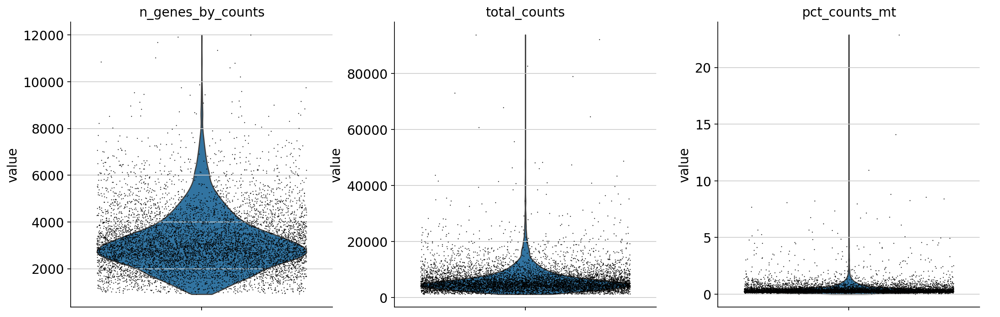

In [13]:
# Crea gráficos de violín para observar la distribución de métricas como el número de genes, el conteo total, 
# y el porcentaje de genes mitocondriales (indicador de calidad de la célula)
sc.pl.violin(adata1, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

---------
3. **Identificación y evalucación de células atípicas con expresión génica inusualmente alta o baja, así como otras características extremas**: Estas células atípicas pueden ser resultado de problemas técnicos o representar tipos de células poco comunes.

-> Uso de métodos estadísticos para determinar su inclusión o eliminación en el análisis.

a) **np.quantile**: Calcula el cuartil q-ésimo de los datos a lo largo del eje especificado.

`np.quantile(adata.obs.n_genes_by_counts.values, .98)`

In [14]:
# Calcula el límite superior del número de genes por célula (percentil 98)
upper_lim_genes = np.quantile(adata1.obs.n_genes_by_counts.values, .98)
# Muestra el valor calculado del límite superior de genes por célula
upper_lim_genes

6618.439999999999

In [15]:
# Filtra las células que tienen un número de genes por debajo del límite superior calculado
adata1 = adata1[adata1.obs.n_genes_by_counts < upper_lim_genes]

In [16]:
# Calcula el límite superior de los conteos totales por célula (percentil 98)
upper_lim_counts = np.quantile(adata1.obs.total_counts.values, .98)
# Muestra el valor calculado del límite superior de conteos totales por célula
upper_lim_counts

15536.899999999998

In [17]:
# Filtra las células que tienen un total de conteos menor a  10,000
adata1 = adata1[adata1.obs.total_counts < 10000]

In [18]:
# Filtra las células que tienen menos del 20% de genes mitocondriales
adata1 = adata1[adata1.obs.pct_counts_mt < 20]

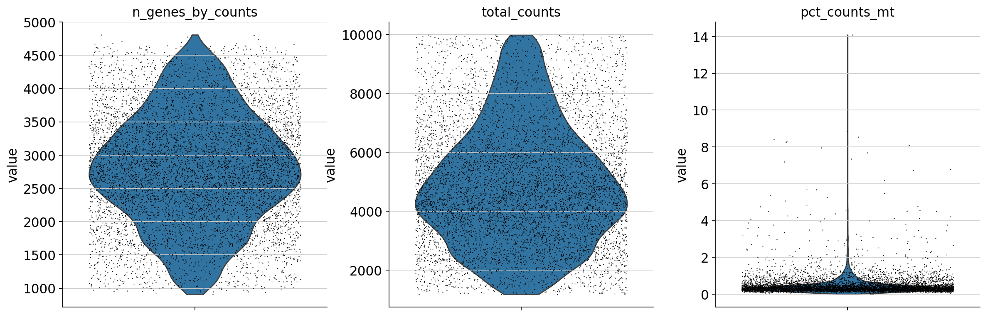

In [19]:
# Crea gráficos de violín nuevamente después del filtrado para comparar las métricas
sc.pl.violin(adata1, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

In [20]:
# Muestra información actualizada del objeto 'adata' después del filtrado
adata1

View of AnnData object with n_obs × n_vars = 7076 × 25234
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

-------
## 2. Normalización

La normalización nos permite ajustar la variabilidad de los datos que surge de las diferencias en la profundidad de secuenciación, el tamaño de las células así como otros factores técnicos. 

-> Aquí se garantiza que las diferencias observadas entre las células se deban a la variación biológica y no a problemas técnicos.

La normalización de recuento total implica escalar los recuentos brutos de cada célula por los recuentos totales de esa célula, seguido de una transformación logarítmica para estabilizar los datos. El logaritmo desplazado resulta beneficioso para estabilizar la varianza para la posterior reducción de la dimensionalidad y la identificación de genes expresados de forma diferencial.

In [21]:
# Suma los valores de la matriz de expresión a lo largo de las células (para cada célula)
adata1.X.sum(axis = 1)

matrix([[2639.],
        [5516.],
        [8325.],
        ...,
        [4309.],
        [6195.],
        [6380.]], dtype=float32)

-------
1. **Escalado por recuentos totales** :Aquí se ajustan los recuentos de cada célula para considerar las diferencias en la profundidad de secuenciación o en el continido total de ARN. Comunmente se escalan los recuentos por un factor constante, normalmente 10 000 ("recuentos por diez mil" o CPTT). 

-> Crea una línea de base común para todas las células.

a) **sc.pp.normalize_total**: Normaliza los recuentos por celda.

`sc.pp.normalize_total(adata`[Matriz de datos anotada como n_obs x n_vars donde las filas corresponden a las células y las columnas corresponden a los genes], `target_sum`[cada observación (celda) tiene un recuento total igual a la mediana de los recuentos totales de las observaciones (celdas) antes de la normalización]`=1e4)`

In [22]:
# Normaliza los datos de expresión para que el total por célula sea igual a 10,000
sc.pp.normalize_total(adata1, target_sum=1e4) # normaliza cada celda a 10.000 UMI

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [23]:
# Verifica nuevamente la suma de la matriz de expresión para cada célula después de la normalización
adata1.X.sum(axis = 1)

matrix([[10000.079],
        [ 9999.997],
        [ 9999.827],
        ...,
        [ 9999.971],
        [10000.192],
        [ 9999.921]], dtype=float32)

--------
2. **Transformación logarítmica**

Scanpy aplica una transformación logarítmica a los recuentos escalados, la cual nos ayuda a estabilizar la varianza para que los datos sean menos sensibles a los valores extremos y de este modo pueda facilitar el análisis posterior.

In [24]:
# Aplica la transformación logarítmica a los datos (logaritmo natural)
sc.pp.log1p(adata1)

In [25]:
# Verifica la suma de la matriz de expresión después de la transformación logarítmica
adata1.X.sum(axis = 1)

matrix([[3224.615 ],
        [4068.6372],
        [4552.351 ],
        ...,
        [3643.8662],
        [4290.606 ],
        [4187.183 ]], dtype=float32)

In [26]:
# Almacena una copia de los datos sin procesar en 'adata.raw' para futuras referencias
adata1.raw = adata1

## 3. Clustering

**Objetivo**: explorar la diversidad celular e identificar tipos o estados celulares únicos. 

Este agrupamiento nos permite categorizar las células en función de sus perfiles de expresión genética y nos da información sobre la composición de una muestra.

Los datos de células individuales suelen tener miles de genes, lo que los hace altamente dimensionales. Antes del agrupamiento, se usan técnicas de reducción de dimensionalidad PCA (Análisis de componentes principales) y UMAP (Aproximación y proyección de colector uniforme) para reducir los datos a un espacio de menor dimensión. En este caso, se utiliza un agrupamiento basado en gráficos, el cual organiza las células en grupos en función de su conectividad en una estructura gráfica. 

**Algoritmo de Leiden**: es un método de agrupamiento basado en gráficos conocido por su eficiencia, precisión y solidez. Se usa ampliamente en el análisis de células individuales debido a su capacidad para encontrar grupos bien definidos en conjuntos de datos complejos.

-------
a) **sc.pp.highly_variable_genes**: Anota genes que son altamente variables.

`sc.pp.highly_variable_genes(adata`[Matriz de datos anotada por n_obs x n_var, donde las filas corresponden al número de células y las columnas correspondel al número de genes], `n_top_genes`[Número de genes altamente variables que se deben conservar] `= 2000)`

In [27]:
# Identificación de genes altamente variables
sc.pp.highly_variable_genes(adata1, n_top_genes = 2000)

In [28]:
# Muestra la información sobre los genes, incluyendo cuáles son altamente variables
adata1.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,False,255,0.032515,96.823222,261.0,255,False,0.054457,0.992671,0.259458
AC114498.1,ENSG00000235146,Gene Expression,False,25,0.003114,99.688551,25.0,25,False,0.006941,1.138593,0.916999
AL669831.5,ENSG00000237491,Gene Expression,False,1483,0.225489,81.524854,1810.0,1483,False,0.300961,0.967812,-0.504182
FAM87B,ENSG00000177757,Gene Expression,False,3,0.000374,99.962626,3.0,3,False,0.000677,0.874816,-0.271616
LINC00115,ENSG00000225880,Gene Expression,False,53,0.006603,99.339728,53.0,53,False,0.010859,1.037427,0.461133
...,...,...,...,...,...,...,...,...,...,...,...,...
AL592183.1,ENSG00000273748,Gene Expression,False,788,0.112620,90.183132,904.0,788,False,0.163427,0.992062,0.256711
AC007325.4,ENSG00000278817,Gene Expression,False,30,0.003737,99.626261,30.0,30,False,0.008840,1.152893,0.981438
AL354822.1,ENSG00000278384,Gene Expression,False,250,0.031768,96.885511,255.0,250,False,0.049367,0.760878,-0.785038
AC004556.1,ENSG00000276345,Gene Expression,False,23,0.002865,99.713467,23.0,23,False,0.002952,0.823862,-0.501219


-------
b) **#sc.pl.highly_variable_genes(adata)**: Grafica dispersiones o varianza normalizada vs medias para los genes.

`sc.pl.highly_variable_genes(adata`[Muestra el resultado de "highly_variable_genes"])

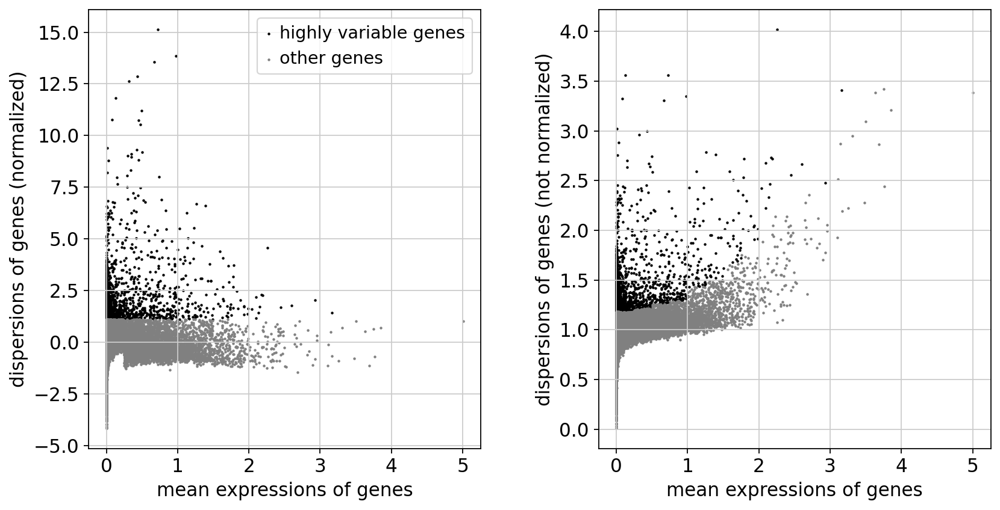

In [29]:
# Crea un gráfico de los genes altamente variables
sc.pl.highly_variable_genes(adata1)

In [30]:
# Mantiene solo los genes altamente variables en los datos para los siguientes análisis
adata1 = adata1[:, adata1.var.highly_variable]

-------
c) **sc.pp.regress_out**: Eliminar (en su mayoría) las fuentes de variación no deseadas mediante regresión lineal simple.

`sc.pp.regress_out(adata`[La matriz de datos anotada], ['total_counts', 'pct_counts_mt'])

- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

In [31]:
# Reajusta los efectos de covariables como el número total de conteos y el porcentaje de genes mitocondriales
sc.pp.regress_out(adata1, ['total_counts', 'pct_counts_mt'])

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


------
d) **sc.pp.scale**: Escala datos a varianza unitaria y media cero.

`sc.pp.scale(adata`[Matriz de datos (anotada) de forma n_obs× n_vars. Las filas corresponden a las células y las columnas a los genes], `max_value`[Recortar (truncar) a este valor después de escalar]`=10)`

In [32]:
# Escala los datos para que cada gen tenga media 0 y varianza 1, con un valor máximo de 10
sc.pp.scale(adata1, max_value=10)

------
e) **sc.tl.pca**: Análisis de Componentes Principales (PCA) que calcula coordenadas de PCA, cargas y descomposición de varianza.

`sc.tl.pca(adata`[Matriz de datos (anotada) de forma n_obs× n_vars donde las filas corresponden a las células y las columnas a los genes], `svd_solver`[Solucionador SVD a utilizar]`='arpack')`

In [33]:
# Realiza análisis de componentes principales (PCA) para reducir la dimensionalidad de los datos
sc.tl.pca(adata1, svd_solver='arpack')

-------
f) **sc.pl.pca_variance_ratio**: Grafica la razón de varianza.

`sc.pl.pca_variance_ratio(adata`[Matriz de datos anotada], `log`[Trazar en escala logarítmica]`=True, n_pcs`[Número de PC a mostrar, por defecto es igual a 30 pero varía] `= 50)`

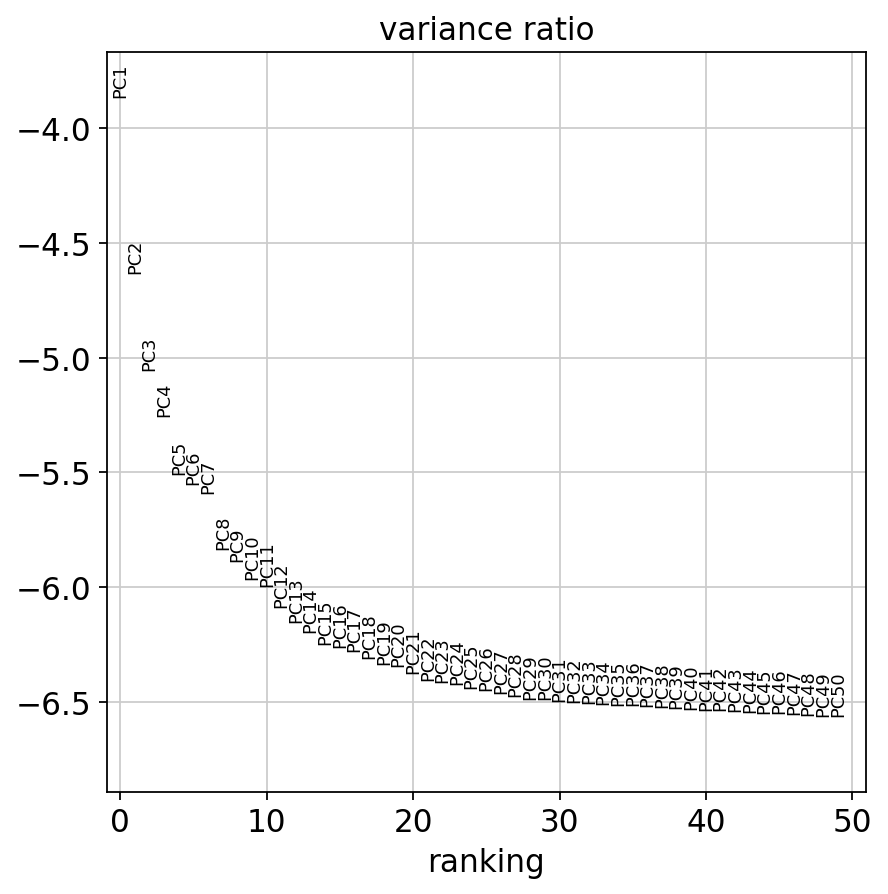

In [34]:
# Muestra un gráfico de la varianza explicada por los componentes principales (logaritmo)
sc.pl.pca_variance_ratio(adata1, log=True, n_pcs = 50)

-------
g) **sc.pp.neighbors**: Calcula la matriz de distancia de los vecinos más cercanos y un gráfico de vecindad de observaciones.\
La eficiencia de búsqueda de vecinos de esto depende en gran medida de UMAP (Aproximación y proyección de colector uniforme) que también proporciona un método para estimar las conectividades de los puntos de datos: la conectividad de la variedad.

`sc.pp.neighbors(adata`[Matriz de datos anotada], `n_pcs`[Utiliza la cantidad de PC] `= 30)`

In [35]:
# Calcula la matriz de vecinos más cercanos para las células usando los primeros 30 componentes principales
sc.pp.neighbors(adata1, n_pcs = 30)

---------
h) **sc.tl.umap**: Incrustra el gráfico de vecindad usando UMAP (Aproximación y proyección de colector uniforme) para visualizar datos de alta dimensión. Optimiza la incrustación de modo que refleje mejor la topología de los datos.

`sc.tl.umap(adata`[Matriz de datos anotada])

i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada])

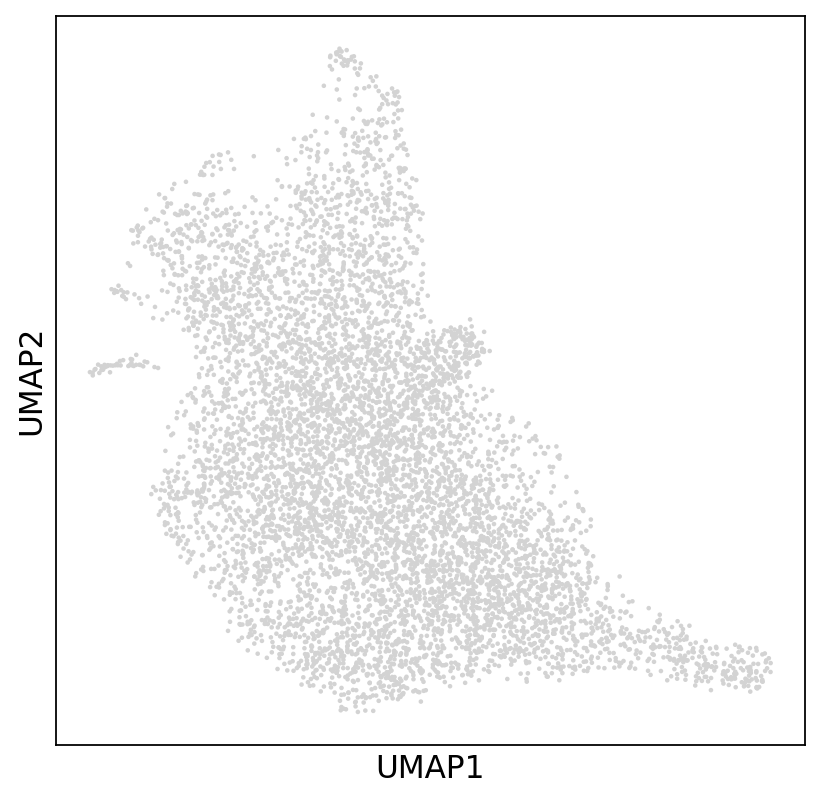

In [36]:
# Realiza una proyección de UMAP (técnica de reducción de dimensionalidad)
sc.tl.umap(adata1) # UMAP: visualizar datos de alta dimensión
# Crea un gráfico de UMAP para visualizar las células en el espacio reducido
sc.pl.umap(adata1)

--------
3. **Leiden**

Leiden comienza construyendo un "gráfico de vecinos", donde cada nodo representa una célula y los bordes representan conexiones entre células en función de su similitud (que a menudo se mide utilizando los k vecinos más cercanos u otras métricas de distancia). Luego, el algoritmo aplica un proceso llamado "detección de comunidad" para identificar grupos de células estrechamente relacionadas dentro del gráfico.

**Pasos clave**:

- **Particionado de nodos**: Leiden asigna células (nodos) a los grupos iniciales, lo que crea una partición del gráfico.
- **Refinamiento de nodos**: el algoritmo refina la partición evaluando la modularidad (una medida de la solidez de los clústeres) y moviendo los nodos para mejorar la modularidad.
- **Optimización de clústeres**: Leiden continúa refinando los clústeres hasta que no se puedan realizar más mejoras.
  
**Resultado final**: conjunto de clústeres que representan grupos distintos de células, que se pueden utilizar para análisis posteriores como visualización, expresión diferencial o anotación de tipo de célula.

-----
a) **sc.tl.leiden**: Agrupa células en subgrupos.

`sc.tl.leiden(adata`[La matriz de datos anotada], `resolution`[Un valor de parámetro que controla la tosquedad de la agrupación donde los valores más altos generan más agrupaciones] `= 1)`

In [37]:
# Realiza un clustering de las células utilizando el algoritmo Leiden con una resolución de 1
sc.tl.leiden(adata1, resolution = 1) # Por defecto la resolución es 1

/tmp/ipykernel_2024655/3618406141.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata1, resolution = 1) # Por defecto la resolución es 1


In [38]:
# Muestra las observaciones (células) con las etiquetas del clustering Leiden
adata1.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGGATTTGA-1,1837,2639.0,7.0,0.265252,2
AAACCCAAGGTCGACA-1,3142,5516.0,14.0,0.253807,3
AAACCCAAGTGAGCCA-1,4216,8325.0,10.0,0.120120,9
AAACCCAAGTGCGACA-1,2705,4532.0,13.0,0.286849,2
AAACCCACAAATGCGG-1,3118,5937.0,23.0,0.387401,0
...,...,...,...,...,...
TTTGTTGAGCGATTCT-1,3585,6793.0,17.0,0.250258,1
TTTGTTGAGTCACGAG-1,1381,1913.0,16.0,0.836383,5
TTTGTTGGTGTTACTG-1,2511,4309.0,22.0,0.510559,0
TTTGTTGTCCACTGGG-1,3524,6196.0,12.0,0.193673,3


------
i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada], `color`[Claves para anotaciones de observaciones/células o variables/genes] `=['leiden'])`

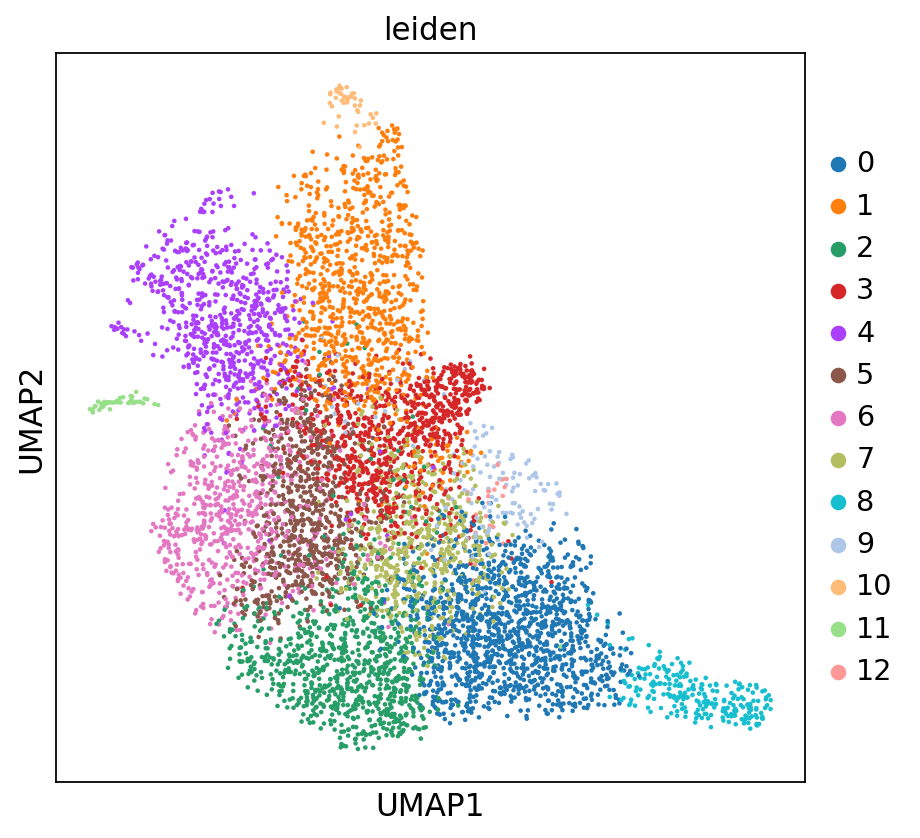

In [39]:
# Crea un gráfico UMAP coloreado por las etiquetas de los clusters Leiden
# Diagrama de dispersión en base UMAP.
sc.pl.umap(adata1, color=['leiden'])

--------
## <span style="color:darkseagreen">Muestra 2: **HB17_tumor_filtered_feature_bc_matrix**</span>

In [40]:
# Cambiar al directorio deseado
os.chdir('/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_tumor_filtered_feature_bc_matrix')

# Verificar el cambio de directorio y listar el contenido
print("Directorio actual:", os.getcwd())
print("Contenido del directorio:", os.listdir('.'))

Directorio actual: /home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_tumor_filtered_feature_bc_matrix
Contenido del directorio: ['cache', 'barcodes.tsv.gz', 'features.tsv.gz', 'matrix.mtx.gz']


In [41]:
pwd

'/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_tumor_filtered_feature_bc_matrix'

In [42]:
adata2 = sc.read_10x_mtx( # Lee los datos de la matriz en formato 10X
    "/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_tumor_filtered_feature_bc_matrix",  # Ruta al directorio que contiene matrix.mtx.gz, features.tsv.gz y barcodes.tsv.gz 
    var_names='gene_symbols',  # Configura los nombres de las variables como los símbolos de los genes
    cache=True # Guarda los datos en caché para acelerar futuras cargas
)

# Muestra un resumen de los datos cargados
adata2

AnnData object with n_obs × n_vars = 7995 × 33538
    var: 'gene_ids', 'feature_types'

## 1. Control de calidad
--------------------

### Preprocesamiento básico
-----------
1. Eliminación de células con alto contenido mitocondrial.\
   Niveles elevados de ARN mitocondrial pueden indicar células estresadas o moribundas. Para ello, se establece un umbral máximo para la expresión de genes mitocondriales (valor máximo: 20%)

In [43]:
# Crea una nueva columna 'mt' en la variable que contiene los genes, 
# indica cuáles genes pertenecen al ADN mitocondrial
adata2.var['mt'] = adata2.var.index.str.startswith('MT-')

In [44]:
# Muestra las variables del objeto 'adata', que incluye información sobre los genes
adata2.var

,gene_ids,feature_types,mt
MIR1302-2HG,ENSG00000243485,Gene Expression,False
FAM138A,ENSG00000237613,Gene Expression,False
OR4F5,ENSG00000186092,Gene Expression,False
AL627309.1,ENSG00000238009,Gene Expression,False
AL627309.3,ENSG00000239945,Gene Expression,False
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,False
AC233755.1,ENSG00000275063,Gene Expression,False
AC240274.1,ENSG00000271254,Gene Expression,False
AC213203.1,ENSG00000277475,Gene Expression,False


------------
a) **pp.calculate_qc_metrics**: cálculo de métricas de control de calidad.\
parámetros utilizados:\
`sc.pp.calculate_qc_metrics(adata`[Matriz de datos anotada], `qc_vars`[Tipo de cosa que son las variables, aquí son genes mitocondriales], `percent_top`[Lista de rangos de la porción acumulada de expresión como un porcentaje, aquí no se calculan], `log1p`[Transformadas], `inplace`[Para colocar métricas calculadas])

In [45]:
# Calcula métricas de control de calidad (QC), como el porcentaje de genes mitocondriales
sc.pp.calculate_qc_metrics(adata2, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [46]:
# Ordena las variables (genes) de acuerdo al número de células en las que están presentes
adata2.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AC007991.4,ENSG00000254287,Gene Expression,False,0,0.000000,100.000000,0.0
AC010857.1,ENSG00000272479,Gene Expression,False,0,0.000000,100.000000,0.0
AC048387.1,ENSG00000254383,Gene Expression,False,0,0.000000,100.000000,0.0
AC016868.1,ENSG00000253396,Gene Expression,False,0,0.000000,100.000000,0.0
KRTAP10-7,ENSG00000272804,Gene Expression,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...
AHSG,ENSG00000145192,Gene Expression,False,7976,16.224890,0.237649,129718.0
APOA2,ENSG00000158874,Gene Expression,False,7978,11.564228,0.212633,92456.0
APOA1,ENSG00000118137,Gene Expression,False,7993,20.604252,0.025016,164731.0
APOB,ENSG00000084674,Gene Expression,False,7993,21.268042,0.025016,170038.0


------------------
2. **Filtrado de células con bajo recuento de genes**\
Aquellas que expresan una menor cantidad de genes únicos pueden ser poco informativas o pueden mostrar un error técnico.\
-> Aplicamos un umbral mínimo para excluir las células de baja calidad.

a) **sc.pp.filter_genes**: filtra genes según sea el número de células o recuentos.

`sc.pp.filter_genes(adata`[Matriz de datos anotada de forma n_obs× n_vars, donde las filas corresponden a las células y las columnas a los genes], `min_cells`[Número mínimo de células expresadas necesarias para que un gen pase el filtrado]`=3)`

In [47]:
# Filtra los genes que están presentes en menos de 3 células
sc.pp.filter_genes(adata2, min_cells=3)

In [48]:
# Ordena nuevamente las variables para ver los genes después del filtrado
adata2.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
LUADT1,ENSG00000196634,Gene Expression,False,3,0.000375,99.962477,3.0,3
AC061975.4,ENSG00000264486,Gene Expression,False,3,0.000375,99.962477,3.0,3
AC011676.2,ENSG00000254019,Gene Expression,False,3,0.000375,99.962477,3.0,3
LY6K,ENSG00000160886,Gene Expression,False,3,0.000375,99.962477,3.0,3
AC083841.2,ENSG00000253715,Gene Expression,False,3,0.000375,99.962477,3.0,3
...,...,...,...,...,...,...,...,...
AHSG,ENSG00000145192,Gene Expression,False,7976,16.224890,0.237649,129718.0,7976
APOA2,ENSG00000158874,Gene Expression,False,7978,11.564228,0.212633,92456.0,7978
APOA1,ENSG00000118137,Gene Expression,False,7993,20.604252,0.025016,164731.0,7993
APOB,ENSG00000084674,Gene Expression,False,7993,21.268042,0.025016,170038.0,7993


---------
b) **sc.pl.violin**: Trama de violín.\
`sc.pl.violin(adata`[Matriz de datos anotada], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             `jitter`[Agrega fluctuación al diagrama de bandas (solo cuando el diagrama de bandas es Verdadero)]`=0.4, multi_panel`[Muestra teclas en varios paneles]`=True)`

- “n_cells_by_counts”: Número de celdas en las que se mide esta expresión.
- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

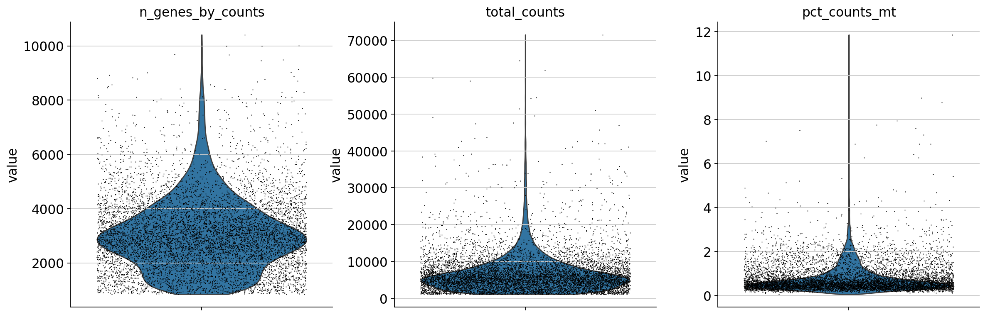

In [49]:
# Crea gráficos de violín para observar la distribución de métricas como el número de genes, el conteo total, 
# y el porcentaje de genes mitocondriales (indicador de calidad de la célula)
sc.pl.violin(adata2, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

---------
3. **Identificación y evalucación de células atípicas con expresión génica inusualmente alta o baja, así como otras características extremas**: Estas células atípicas pueden ser resultado de problemas técnicos o representar tipos de células poco comunes.

-> Uso de métodos estadísticos para determinar su inclusión o eliminación en el análisis.

a) **np.quantile**: Calcula el cuartil q-ésimo de los datos a lo largo del eje especificado.

`np.quantile(adata.obs.n_genes_by_counts.values, .98)`

In [50]:
# Calcula el límite superior del número de genes por célula (percentil 98)
upper_lim_genes = np.quantile(adata2.obs.n_genes_by_counts.values, .98)
# Muestra el valor calculado del límite superior de genes por célula
upper_lim_genes

6591.599999999999

In [51]:
# Filtra las células que tienen un número de genes por debajo del límite superior calculado
adata2 = adata2[adata2.obs.n_genes_by_counts < upper_lim_genes]

In [52]:
# Calcula el límite superior de los conteos totales por célula (percentil 98)
upper_lim_counts = np.quantile(adata2.obs.total_counts.values, .98)
# Muestra el valor calculado del límite superior de conteos totales por célula
upper_lim_counts

17453.719999999994

In [53]:
# Filtra las células que tienen un total de conteos menor a  10,000
adata2 = adata2[adata2.obs.total_counts < 10000]

In [54]:
# Filtra las células que tienen menos del 20% de genes mitocondriales
adata2 = adata2[adata2.obs.pct_counts_mt < 20]

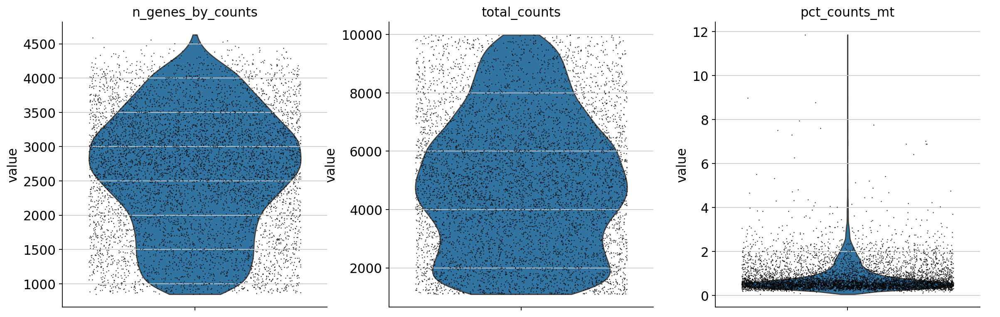

In [55]:
# Crea gráficos de violín nuevamente después del filtrado para comparar las métricas
sc.pl.violin(adata2, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

In [56]:
# Muestra información actualizada del objeto 'adata' después del filtrado
adata2

View of AnnData object with n_obs × n_vars = 6694 × 25334
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

-------
## 2. Normalización

La normalización nos permite ajustar la variabilidad de los datos que surge de las diferencias en la profundidad de secuenciación, el tamaño de las células así como otros factores técnicos. 

-> Aquí se garantiza que las diferencias observadas entre las células se deban a la variación biológica y no a problemas técnicos.

La normalización de recuento total implica escalar los recuentos brutos de cada célula por los recuentos totales de esa célula, seguido de una transformación logarítmica para estabilizar los datos. El logaritmo desplazado resulta beneficioso para estabilizar la varianza para la posterior reducción de la dimensionalidad y la identificación de genes expresados de forma diferencial.

In [57]:
# Suma los valores de la matriz de expresión a lo largo de las células (para cada célula)
adata2.X.sum(axis = 1)

matrix([[2156.],
        [1478.],
        [5183.],
        ...,
        [8153.],
        [5103.],
        [5958.]], dtype=float32)

-------
1. **Escalado por recuentos totales** :Aquí se ajustan los recuentos de cada célula para considerar las diferencias en la profundidad de secuenciación o en el continido total de ARN. Comunmente se escalan los recuentos por un factor constante, normalmente 10 000 ("recuentos por diez mil" o CPTT). 

-> Crea una línea de base común para todas las células.

a) **sc.pp.normalize_total**: Normaliza los recuentos por celda.

`sc.pp.normalize_total(adata`[Matriz de datos anotada como n_obs x n_vars donde las filas corresponden a las células y las columnas corresponden a los genes], `target_sum`[cada observación (celda) tiene un recuento total igual a la mediana de los recuentos totales de las observaciones (celdas) antes de la normalización]`=1e4)`

In [58]:
# Normaliza los datos de expresión para que el total por célula sea igual a 10,000
sc.pp.normalize_total(adata2, target_sum=1e4) # normaliza cada celda a 10.000 UMI

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [59]:
# Verifica nuevamente la suma de la matriz de expresión para cada célula después de la normalización
adata2.X.sum(axis = 1)

matrix([[10000.063],
        [10000.041],
        [10000.022],
        ...,
        [10000.113],
        [10000.049],
        [ 9999.996]], dtype=float32)

--------
2. **Transformación logarítmica**

Scanpy aplica una transformación logarítmica a los recuentos escalados, la cual nos ayuda a estabilizar la varianza para que los datos sean menos sensibles a los valores extremos y de este modo pueda facilitar el análisis posterior.

In [60]:
# Aplica la transformación logarítmica a los datos (logaritmo natural)
sc.pp.log1p(adata2)

In [61]:
# Verifica la suma de la matriz de expresión después de la transformación logarítmica
adata2.X.sum(axis = 1)

matrix([[3000.329 ],
        [2470.5955],
        [3556.9243],
        ...,
        [4085.1245],
        [3811.965 ],
        [3589.419 ]], dtype=float32)

In [62]:
# Almacena una copia de los datos sin procesar en 'adata.raw' para futuras referencias
adata2.raw = adata2

## 3. Clustering

**Objetivo**: explorar la diversidad celular e identificar tipos o estados celulares únicos. 

Este agrupamiento nos permite categorizar las células en función de sus perfiles de expresión genética y nos da información sobre la composición de una muestra.

Los datos de células individuales suelen tener miles de genes, lo que los hace altamente dimensionales. Antes del agrupamiento, se usan técnicas de reducción de dimensionalidad PCA (Análisis de componentes principales) y UMAP (Aproximación y proyección de colector uniforme) para reducir los datos a un espacio de menor dimensión. En este caso, se utiliza un agrupamiento basado en gráficos, el cual organiza las células en grupos en función de su conectividad en una estructura gráfica. 

**Algoritmo de Leiden**: es un método de agrupamiento basado en gráficos conocido por su eficiencia, precisión y solidez. Se usa ampliamente en el análisis de células individuales debido a su capacidad para encontrar grupos bien definidos en conjuntos de datos complejos.

-------
a) **sc.pp.highly_variable_genes**: Anota genes que son altamente variables.

`sc.pp.highly_variable_genes(adata`[Matriz de datos anotada por n_obs x n_var, donde las filas corresponden al número de células y las columnas correspondel al número de genes], `n_top_genes`[Número de genes altamente variables que se deben conservar] `= 2000)`

In [63]:
# Identificación de genes altamente variables
sc.pp.highly_variable_genes(adata2, n_top_genes = 2000)

In [64]:
# Muestra la información sobre los genes, incluyendo cuáles son altamente variables
adata2.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,False,171,0.021889,97.861163,175.0,171,False,0.028466,0.752200,-0.898757
AC114498.1,ENSG00000235146,Gene Expression,False,13,0.001626,99.837398,13.0,13,False,0.002195,0.576682,-1.378592
AL669831.5,ENSG00000237491,Gene Expression,False,830,0.119450,89.618512,955.0,830,False,0.168792,1.115257,0.093776
LINC00115,ENSG00000225880,Gene Expression,False,113,0.014759,98.586617,118.0,113,False,0.022502,1.064440,-0.045149
FAM41C,ENSG00000230368,Gene Expression,False,3,0.000375,99.962477,3.0,3,True,0.001468,2.071663,2.708416
...,...,...,...,...,...,...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,Gene Expression,False,41,0.005253,99.487179,42.0,41,False,0.009466,1.281831,0.549159
AC007325.2,ENSG00000277196,Gene Expression,False,7,0.000876,99.912445,7.0,7,False,0.000599,0.337092,-2.033588
AL354822.1,ENSG00000278384,Gene Expression,False,196,0.025266,97.548468,202.0,196,False,0.029338,0.641672,-1.200922
AC004556.1,ENSG00000276345,Gene Expression,False,18,0.002251,99.774859,18.0,18,False,0.004393,0.965634,-0.315268


-------
b) **#sc.pl.highly_variable_genes(adata)**: Grafica dispersiones o varianza normalizada vs medias para los genes.

`sc.pl.highly_variable_genes(adata`[Muestra el resultado de "highly_variable_genes"])

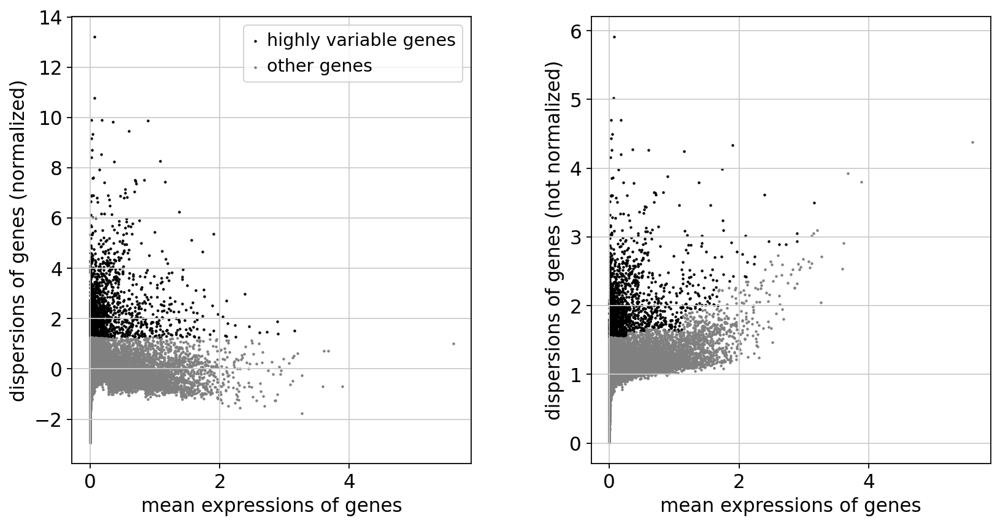

In [65]:
# Crea un gráfico de los genes altamente variables
sc.pl.highly_variable_genes(adata2)

In [66]:
# Mantiene solo los genes altamente variables en los datos para los siguientes análisis
adata2 = adata2[:, adata2.var.highly_variable]

-------
c) **sc.pp.regress_out**: Eliminar (en su mayoría) las fuentes de variación no deseadas mediante regresión lineal simple.

`sc.pp.regress_out(adata`[La matriz de datos anotada], ['total_counts', 'pct_counts_mt'])

- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

In [67]:
# Reajusta los efectos de covariables como el número total de conteos y el porcentaje de genes mitocondriales
sc.pp.regress_out(adata2, ['total_counts', 'pct_counts_mt'])

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


------
d) **sc.pp.scale**: Escala datos a varianza unitaria y media cero.

`sc.pp.scale(adata`[Matriz de datos (anotada) de forma n_obs× n_vars. Las filas corresponden a las células y las columnas a los genes], `max_value`[Recortar (truncar) a este valor después de escalar]`=10)`

In [68]:
# Escala los datos para que cada gen tenga media 0 y varianza 1, con un valor máximo de 10
sc.pp.scale(adata2, max_value=10)

------
e) **sc.tl.pca**: Análisis de Componentes Principales (PCA) que calcula coordenadas de PCA, cargas y descomposición de varianza.

`sc.tl.pca(adata`[Matriz de datos (anotada) de forma n_obs× n_vars donde las filas corresponden a las células y las columnas a los genes], `svd_solver`[Solucionador SVD a utilizar]`='arpack')`

In [69]:
# Realiza análisis de componentes principales (PCA) para reducir la dimensionalidad de los datos
sc.tl.pca(adata2, svd_solver='arpack')

-------
f) **sc.pl.pca_variance_ratio**: Grafica la razón de varianza.

`sc.pl.pca_variance_ratio(adata`[Matriz de datos anotada], `log`[Trazar en escala logarítmica]`=True, n_pcs`[Número de PC a mostrar, por defecto es igual a 30 pero varía] `= 50)`

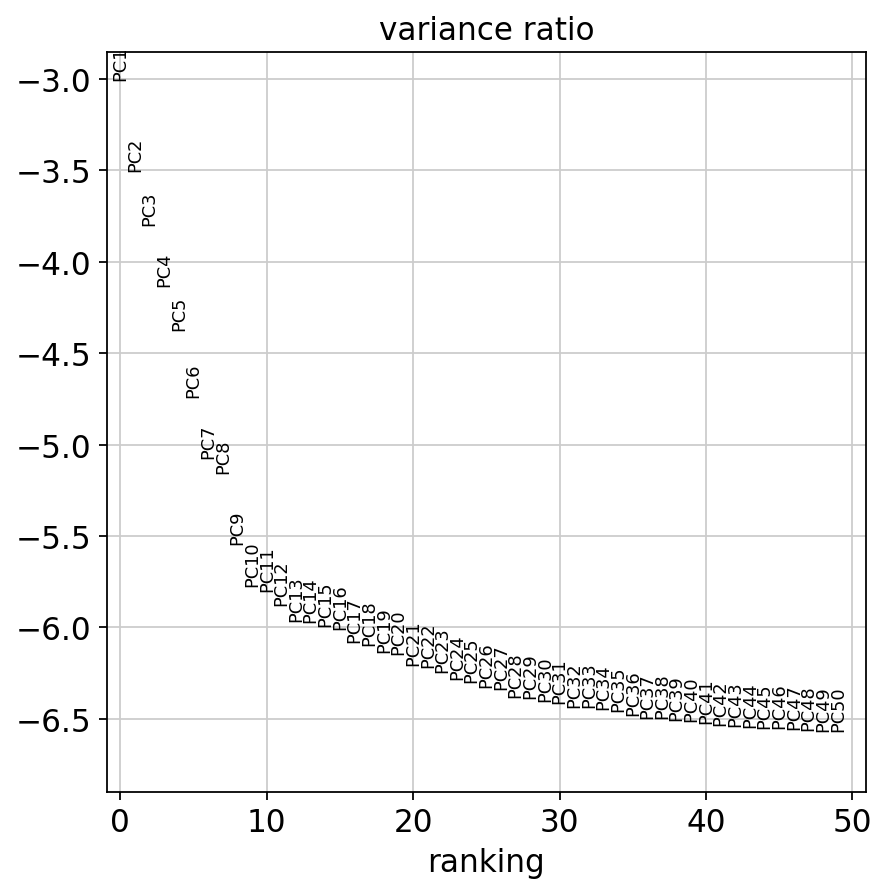

In [70]:
# Muestra un gráfico de la varianza explicada por los componentes principales (logaritmo)
sc.pl.pca_variance_ratio(adata2, log=True, n_pcs = 50)

-------
g) **sc.pp.neighbors**: Calcula la matriz de distancia de los vecinos más cercanos y un gráfico de vecindad de observaciones.\
La eficiencia de búsqueda de vecinos de esto depende en gran medida de UMAP (Aproximación y proyección de colector uniforme) que también proporciona un método para estimar las conectividades de los puntos de datos: la conectividad de la variedad.

`sc.pp.neighbors(adata`[Matriz de datos anotada], `n_pcs`[Utiliza la cantidad de PC] `= 30)`

In [71]:
# Calcula la matriz de vecinos más cercanos para las células usando los primeros 30 componentes principales
sc.pp.neighbors(adata2, n_pcs = 30)

---------
h) **sc.tl.umap**: Incrustra el gráfico de vecindad usando UMAP (Aproximación y proyección de colector uniforme) para visualizar datos de alta dimensión. Optimiza la incrustación de modo que refleje mejor la topología de los datos.

`sc.tl.umap(adata`[Matriz de datos anotada])

i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada])

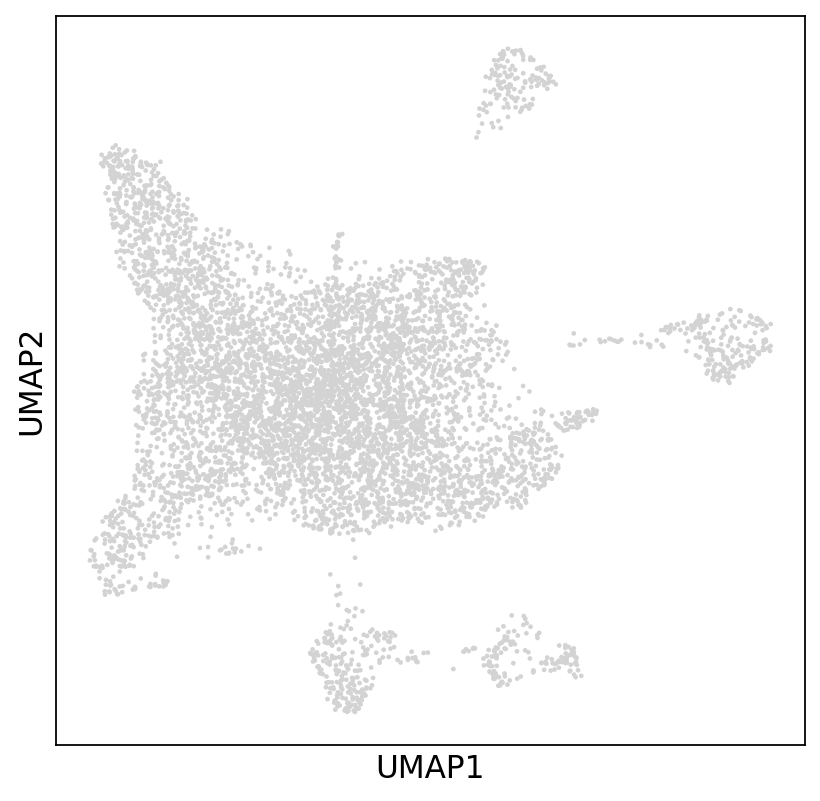

In [72]:
# Realiza una proyección de UMAP (técnica de reducción de dimensionalidad)
sc.tl.umap(adata2) # UMAP: visualizar datos de alta dimensión
# Crea un gráfico de UMAP para visualizar las células en el espacio reducido
sc.pl.umap(adata2)

--------
3. **Leiden**

Leiden comienza construyendo un "gráfico de vecinos", donde cada nodo representa una célula y los bordes representan conexiones entre células en función de su similitud (que a menudo se mide utilizando los k vecinos más cercanos u otras métricas de distancia). Luego, el algoritmo aplica un proceso llamado "detección de comunidad" para identificar grupos de células estrechamente relacionadas dentro del gráfico.

**Pasos clave**:

- **Particionado de nodos**: Leiden asigna células (nodos) a los grupos iniciales, lo que crea una partición del gráfico.
- **Refinamiento de nodos**: el algoritmo refina la partición evaluando la modularidad (una medida de la solidez de los clústeres) y moviendo los nodos para mejorar la modularidad.
- **Optimización de clústeres**: Leiden continúa refinando los clústeres hasta que no se puedan realizar más mejoras.
  
**Resultado final**: conjunto de clústeres que representan grupos distintos de células, que se pueden utilizar para análisis posteriores como visualización, expresión diferencial o anotación de tipo de célula.

-----
a) **sc.tl.leiden**: Agrupa células en subgrupos.

`sc.tl.leiden(adata`[La matriz de datos anotada], `resolution`[Un valor de parámetro que controla la tosquedad de la agrupación donde los valores más altos generan más agrupaciones] `= 1)`

In [73]:
# Realiza un clustering de las células utilizando el algoritmo Leiden con una resolución de 1
sc.tl.leiden(adata2, resolution = 1) # Por defecto la resolución es 1

In [74]:
# Muestra las observaciones (células) con las etiquetas del clustering Leiden
adata2.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGAATCTAG-1,1588,2156.0,34.0,1.576994,0
AAACCCAAGCCAACCC-1,1125,1478.0,29.0,1.962111,0
AAACCCACAACGAGGT-1,2602,5183.0,35.0,0.675285,10
AAACCCACAGGTGGAT-1,1262,1712.0,31.0,1.810748,4
AAACCCAGTCCACAGC-1,2003,2986.0,10.0,0.334896,2
...,...,...,...,...,...
TTTGGTTGTTCCTACC-1,2664,5118.0,25.0,0.488472,1
TTTGGTTTCGTTACCC-1,2666,4712.0,14.0,0.297114,4
TTTGGTTTCTGTACAG-1,3650,8153.0,34.0,0.417024,2
TTTGTTGAGTATCCTG-1,2822,5104.0,21.0,0.411442,6


------
i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada], `color`[Claves para anotaciones de observaciones/células o variables/genes] `=['leiden'])`

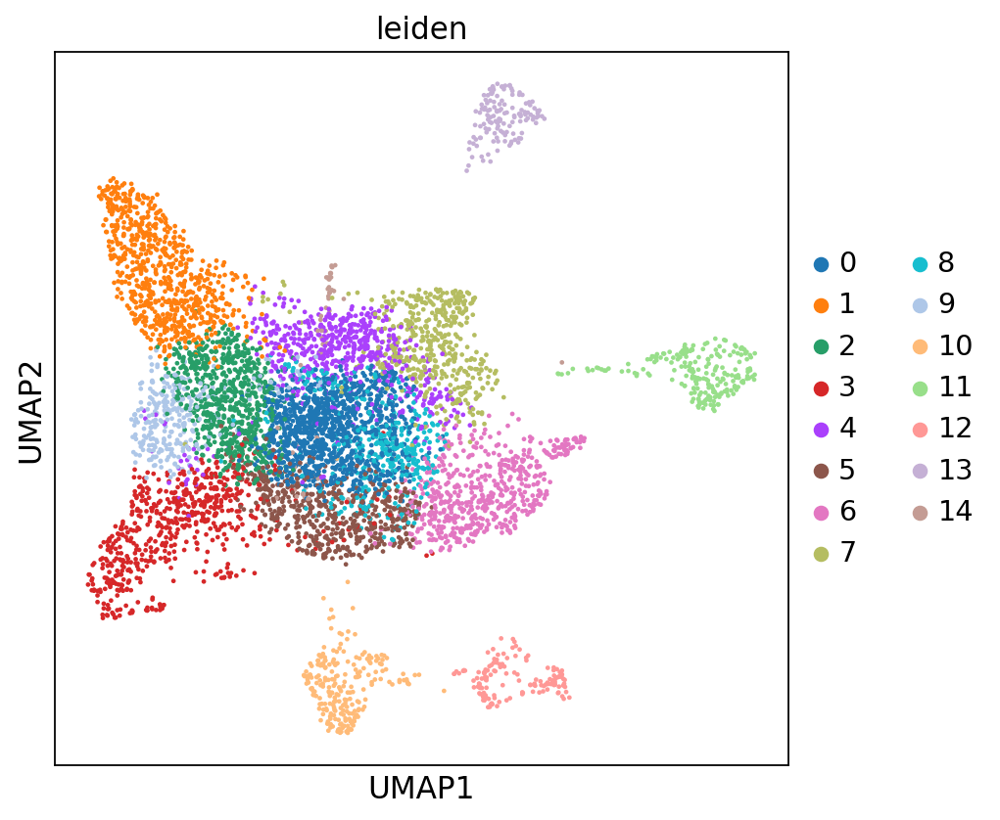

In [75]:
# Crea un gráfico UMAP coloreado por las etiquetas de los clusters Leiden
# Diagrama de dispersión en base UMAP.
sc.pl.umap(adata2, color=['leiden'])

-------
## <span style="color:darkseagreen">Muestra 3: **HB30_PDX_filtered_feature_bc_matrix**</span>

In [76]:
# Cambiar al directorio deseado
os.chdir('/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB30_PDX_filtered_feature_bc_matrix')

# Verificar el cambio de directorio y listar el contenido
print("Directorio actual:", os.getcwd())
print("Contenido del directorio:", os.listdir('.'))

Directorio actual: /home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB30_PDX_filtered_feature_bc_matrix
Contenido del directorio: ['cache', 'barcodes.tsv.gz', 'features.tsv.gz', 'matrix.mtx.gz']


In [77]:
pwd

'/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB30_PDX_filtered_feature_bc_matrix'

In [78]:
adata3 = sc.read_10x_mtx( # Lee los datos de la matriz en formato 10X
    "/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB30_PDX_filtered_feature_bc_matrix",  # Ruta al directorio que contiene matrix.mtx.gz, features.tsv.gz y barcodes.tsv.gz 
    var_names='gene_symbols',  # Configura los nombres de las variables como los símbolos de los genes
    cache=True # Guarda los datos en caché para acelerar futuras cargas
)

# Muestra un resumen de los datos cargados
adata3

AnnData object with n_obs × n_vars = 10303 × 33538
    var: 'gene_ids', 'feature_types'

## 1. Control de calidad
--------------------

### Preprocesamiento básico
-----------
1. Eliminación de células con alto contenido mitocondrial.\
   Niveles elevados de ARN mitocondrial pueden indicar células estresadas o moribundas. Para ello, se establece un umbral máximo para la expresión de genes mitocondriales (valor máximo: 20%)

In [79]:
# Crea una nueva columna 'mt' en la variable que contiene los genes, 
# indica cuáles genes pertenecen al ADN mitocondrial
adata3.var['mt'] = adata3.var.index.str.startswith('MT-')

In [80]:
# Muestra las variables del objeto 'adata', que incluye información sobre los genes
adata3.var

,gene_ids,feature_types,mt
MIR1302-2HG,ENSG00000243485,Gene Expression,False
FAM138A,ENSG00000237613,Gene Expression,False
OR4F5,ENSG00000186092,Gene Expression,False
AL627309.1,ENSG00000238009,Gene Expression,False
AL627309.3,ENSG00000239945,Gene Expression,False
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,False
AC233755.1,ENSG00000275063,Gene Expression,False
AC240274.1,ENSG00000271254,Gene Expression,False
AC213203.1,ENSG00000277475,Gene Expression,False


------------
a) **pp.calculate_qc_metrics**: cálculo de métricas de control de calidad.\
parámetros utilizados:\
`sc.pp.calculate_qc_metrics(adata`[Matriz de datos anotada], `qc_vars`[Tipo de cosa que son las variables, aquí son genes mitocondriales], `percent_top`[Lista de rangos de la porción acumulada de expresión como un porcentaje, aquí no se calculan], `log1p`[Transformadas], `inplace`[Para colocar métricas calculadas])

In [81]:
# Calcula métricas de control de calidad (QC), como el porcentaje de genes mitocondriales
sc.pp.calculate_qc_metrics(adata3, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [82]:
# Ordena las variables (genes) de acuerdo al número de células en las que están presentes
adata3.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AL645608.3,ENSG00000230699,Gene Expression,False,0,0.000000,100.000000,0.0
AL645608.5,ENSG00000241180,Gene Expression,False,0,0.000000,100.000000,0.0
AL645608.1,ENSG00000223764,Gene Expression,False,0,0.000000,100.000000,0.0
AL645608.9,ENSG00000273443,Gene Expression,False,0,0.000000,100.000000,0.0
AL139246.4,ENSG00000229393,Gene Expression,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...
AFP,ENSG00000081051,Gene Expression,False,10280,10.718529,0.223236,110433.0
SERPINA1,ENSG00000197249,Gene Expression,False,10298,14.514510,0.048530,149543.0
APOA2,ENSG00000158874,Gene Expression,False,10300,16.380375,0.029118,168767.0
ALB,ENSG00000163631,Gene Expression,False,10301,18.423372,0.019412,189816.0


------------------
2. **Filtrado de células con bajo recuento de genes**\
Aquellas que expresan una menor cantidad de genes únicos pueden ser poco informativas o pueden mostrar un error técnico.\
-> Aplicamos un umbral mínimo para excluir las células de baja calidad.

a) **sc.pp.filter_genes**: filtra genes según sea el número de células o recuentos.

`sc.pp.filter_genes(adata`[Matriz de datos anotada de forma n_obs× n_vars, donde las filas corresponden a las células y las columnas a los genes], `min_cells`[Número mínimo de células expresadas necesarias para que un gen pase el filtrado]`=3)`

In [83]:
# Filtra los genes que están presentes en menos de 3 células
sc.pp.filter_genes(adata3, min_cells=3)

In [84]:
# Ordena nuevamente las variables para ver los genes después del filtrado
adata3.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
HOXB13,ENSG00000159184,Gene Expression,False,3,0.000291,99.970882,3.0,3
LINC02284,ENSG00000259719,Gene Expression,False,3,0.000291,99.970882,3.0,3
PCAT4,ENSG00000251321,Gene Expression,False,3,0.000388,99.970882,4.0,3
AP006545.2,ENSG00000272128,Gene Expression,False,3,0.000291,99.970882,3.0,3
AC087623.1,ENSG00000254981,Gene Expression,False,3,0.000291,99.970882,3.0,3
...,...,...,...,...,...,...,...,...
AFP,ENSG00000081051,Gene Expression,False,10280,10.718529,0.223236,110433.0,10280
SERPINA1,ENSG00000197249,Gene Expression,False,10298,14.514510,0.048530,149543.0,10298
APOA2,ENSG00000158874,Gene Expression,False,10300,16.380375,0.029118,168767.0,10300
ALB,ENSG00000163631,Gene Expression,False,10301,18.423372,0.019412,189816.0,10301


---------
b) **sc.pl.violin**: Trama de violín.\
`sc.pl.violin(adata`[Matriz de datos anotada], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             `jitter`[Agrega fluctuación al diagrama de bandas (solo cuando el diagrama de bandas es Verdadero)]`=0.4, multi_panel`[Muestra teclas en varios paneles]`=True)`

- “n_cells_by_counts”: Número de celdas en las que se mide esta expresión.
- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

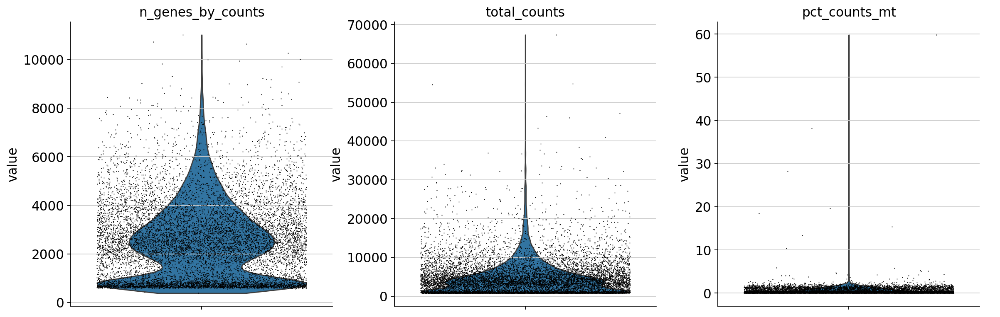

In [85]:
# Crea gráficos de violín para observar la distribución de métricas como el número de genes, el conteo total, 
# y el porcentaje de genes mitocondriales (indicador de calidad de la célula)
sc.pl.violin(adata3, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

---------
3. **Identificación y evalucación de células atípicas con expresión génica inusualmente alta o baja, así como otras características extremas**: Estas células atípicas pueden ser resultado de problemas técnicos o representar tipos de células poco comunes.

-> Uso de métodos estadísticos para determinar su inclusión o eliminación en el análisis.

a) **np.quantile**: Calcula el cuartil q-ésimo de los datos a lo largo del eje especificado.

`np.quantile(adata.obs.n_genes_by_counts.values, .98)`

In [86]:
# Calcula el límite superior del número de genes por célula (percentil 98)
upper_lim_genes = np.quantile(adata3.obs.n_genes_by_counts.values, .98)
# Muestra el valor calculado del límite superior de genes por célula
upper_lim_genes

6619.799999999996

In [87]:
# Filtra las células que tienen un número de genes por debajo del límite superior calculado
adata3 = adata3[adata3.obs.n_genes_by_counts < upper_lim_genes]

In [88]:
# Calcula el límite superior de los conteos totales por célula (percentil 98)
upper_lim_counts = np.quantile(adata3.obs.total_counts.values, .98)
# Muestra el valor calculado del límite superior de conteos totales por célula
upper_lim_counts

14310.50000000001

In [89]:
# Filtra las células que tienen un total de conteos menor a  10,000
adata3 = adata3[adata3.obs.total_counts < 10000]

In [90]:
# Filtra las células que tienen menos del 20% de genes mitocondriales
adata3 = adata3[adata3.obs.pct_counts_mt < 20]

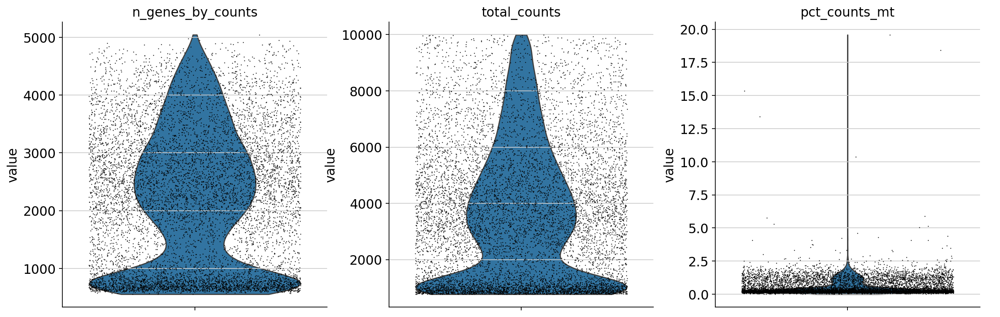

In [91]:
# Crea gráficos de violín nuevamente después del filtrado para comparar las métricas
sc.pl.violin(adata3, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

In [92]:
# Muestra información actualizada del objeto 'adata' después del filtrado
adata3

View of AnnData object with n_obs × n_vars = 9314 × 25871
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

-------
## 2. Normalización

La normalización nos permite ajustar la variabilidad de los datos que surge de las diferencias en la profundidad de secuenciación, el tamaño de las células así como otros factores técnicos. 

-> Aquí se garantiza que las diferencias observadas entre las células se deban a la variación biológica y no a problemas técnicos.

La normalización de recuento total implica escalar los recuentos brutos de cada célula por los recuentos totales de esa célula, seguido de una transformación logarítmica para estabilizar los datos. El logaritmo desplazado resulta beneficioso para estabilizar la varianza para la posterior reducción de la dimensionalidad y la identificación de genes expresados de forma diferencial.

In [93]:
# Suma los valores de la matriz de expresión a lo largo de las células (para cada célula)
adata3.X.sum(axis = 1)

matrix([[4332.],
        [3073.],
        [3308.],
        ...,
        [4053.],
        [4046.],
        [1265.]], dtype=float32)

-------
1. **Escalado por recuentos totales** :Aquí se ajustan los recuentos de cada célula para considerar las diferencias en la profundidad de secuenciación o en el continido total de ARN. Comunmente se escalan los recuentos por un factor constante, normalmente 10 000 ("recuentos por diez mil" o CPTT). 

-> Crea una línea de base común para todas las células.

a) **sc.pp.normalize_total**: Normaliza los recuentos por celda.

`sc.pp.normalize_total(adata`[Matriz de datos anotada como n_obs x n_vars donde las filas corresponden a las células y las columnas corresponden a los genes], `target_sum`[cada observación (celda) tiene un recuento total igual a la mediana de los recuentos totales de las observaciones (celdas) antes de la normalización]`=1e4)`

In [94]:
# Normaliza los datos de expresión para que el total por célula sea igual a 10,000
sc.pp.normalize_total(adata3, target_sum=1e4) # normaliza cada celda a 10.000 UMI

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [95]:
# Verifica nuevamente la suma de la matriz de expresión para cada célula después de la normalización
adata3.X.sum(axis = 1)

matrix([[10000.171],
        [ 9999.774],
        [10000.108],
        ...,
        [10000.143],
        [10000.178],
        [10000.045]], dtype=float32)

--------
2. **Transformación logarítmica**

Scanpy aplica una transformación logarítmica a los recuentos escalados, la cual nos ayuda a estabilizar la varianza para que los datos sean menos sensibles a los valores extremos y de este modo pueda facilitar el análisis posterior.

In [96]:
# Aplica la transformación logarítmica a los datos (logaritmo natural)
sc.pp.log1p(adata3)

In [97]:
# Verifica la suma de la matriz de expresión después de la transformación logarítmica
adata3.X.sum(axis = 1)

matrix([[3832.619 ],
        [3128.082 ],
        [3584.7563],
        ...,
        [3742.8643],
        [3539.9434],
        [2219.345 ]], dtype=float32)

In [98]:
# Almacena una copia de los datos sin procesar en 'adata.raw' para futuras referencias
adata3.raw = adata3

## 3. Clustering

**Objetivo**: explorar la diversidad celular e identificar tipos o estados celulares únicos. 

Este agrupamiento nos permite categorizar las células en función de sus perfiles de expresión genética y nos da información sobre la composición de una muestra.

Los datos de células individuales suelen tener miles de genes, lo que los hace altamente dimensionales. Antes del agrupamiento, se usan técnicas de reducción de dimensionalidad PCA (Análisis de componentes principales) y UMAP (Aproximación y proyección de colector uniforme) para reducir los datos a un espacio de menor dimensión. En este caso, se utiliza un agrupamiento basado en gráficos, el cual organiza las células en grupos en función de su conectividad en una estructura gráfica. 

**Algoritmo de Leiden**: es un método de agrupamiento basado en gráficos conocido por su eficiencia, precisión y solidez. Se usa ampliamente en el análisis de células individuales debido a su capacidad para encontrar grupos bien definidos en conjuntos de datos complejos.

-------
a) **sc.pp.highly_variable_genes**: Anota genes que son altamente variables.

`sc.pp.highly_variable_genes(adata`[Matriz de datos anotada por n_obs x n_var, donde las filas corresponden al número de células y las columnas correspondel al número de genes], `n_top_genes`[Número de genes altamente variables que se deben conservar] `= 2000)`

In [99]:
# Identificación de genes altamente variables
sc.pp.highly_variable_genes(adata3, n_top_genes = 2000)

In [100]:
# Muestra la información sobre los genes, incluyendo cuáles son altamente variables
adata3.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,False,320,0.032321,96.894109,333.0,320,False,0.053388,1.326159,-0.274538
AC114498.1,ENSG00000235146,Gene Expression,False,21,0.002038,99.796176,21.0,21,False,0.004127,1.196388,-0.599999
AL669831.2,ENSG00000229905,Gene Expression,False,25,0.002426,99.757352,25.0,25,False,0.004643,0.927675,-1.273919
AL669831.5,ENSG00000237491,Gene Expression,False,2636,0.376104,74.415219,3875.0,2636,False,0.502836,1.524518,-0.511541
FAM87B,ENSG00000177757,Gene Expression,False,4,0.000388,99.961176,4.0,4,False,0.000955,1.071022,-0.914412
...,...,...,...,...,...,...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,Gene Expression,False,6,0.000582,99.941765,6.0,6,True,0.002209,2.367301,2.336601
BX072566.1,ENSG00000277630,Gene Expression,False,4,0.000388,99.961176,4.0,4,False,0.001124,1.003441,-1.083901
AL354822.1,ENSG00000278384,Gene Expression,False,53,0.005338,99.485587,55.0,53,False,0.008326,0.743065,-1.736913
AC004556.1,ENSG00000276345,Gene Expression,False,14,0.001359,99.864117,14.0,14,False,0.003445,1.965952,1.330034


-------
b) **#sc.pl.highly_variable_genes(adata)**: Grafica dispersiones o varianza normalizada vs medias para los genes.

`sc.pl.highly_variable_genes(adata`[Muestra el resultado de "highly_variable_genes"])

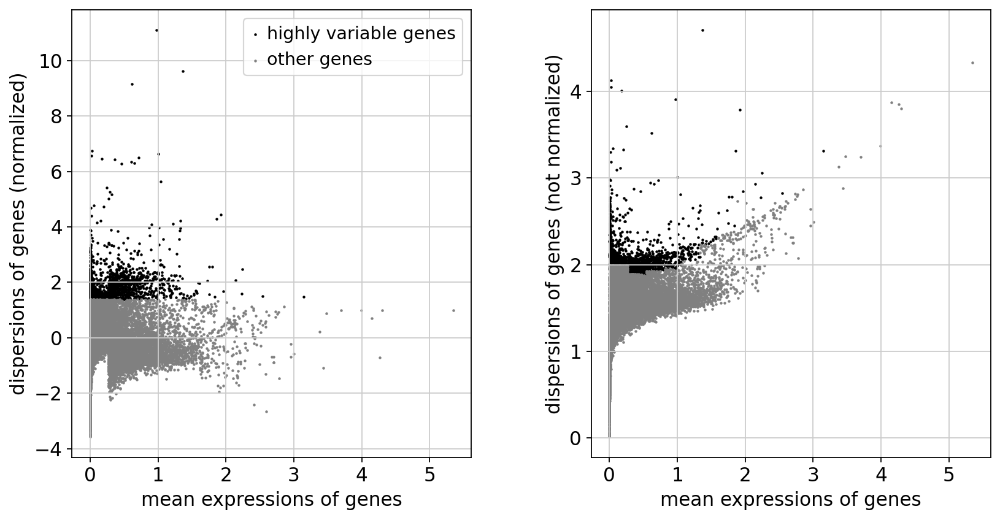

In [101]:
# Crea un gráfico de los genes altamente variables
sc.pl.highly_variable_genes(adata3)

In [102]:
# Mantiene solo los genes altamente variables en los datos para los siguientes análisis
adata3 = adata3[:, adata3.var.highly_variable]

-------
c) **sc.pp.regress_out**: Eliminar (en su mayoría) las fuentes de variación no deseadas mediante regresión lineal simple.

`sc.pp.regress_out(adata`[La matriz de datos anotada], ['total_counts', 'pct_counts_mt'])

- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

In [103]:
# Reajusta los efectos de covariables como el número total de conteos y el porcentaje de genes mitocondriales
sc.pp.regress_out(adata3, ['total_counts', 'pct_counts_mt'])

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


------
d) **sc.pp.scale**: Escala datos a varianza unitaria y media cero.

`sc.pp.scale(adata`[Matriz de datos (anotada) de forma n_obs× n_vars. Las filas corresponden a las células y las columnas a los genes], `max_value`[Recortar (truncar) a este valor después de escalar]`=10)`

In [104]:
# Escala los datos para que cada gen tenga media 0 y varianza 1, con un valor máximo de 10
sc.pp.scale(adata3, max_value=10)

------
e) **sc.tl.pca**: Análisis de Componentes Principales (PCA) que calcula coordenadas de PCA, cargas y descomposición de varianza.

`sc.tl.pca(adata`[Matriz de datos (anotada) de forma n_obs× n_vars donde las filas corresponden a las células y las columnas a los genes], `svd_solver`[Solucionador SVD a utilizar]`='arpack')`

In [105]:
# Realiza análisis de componentes principales (PCA) para reducir la dimensionalidad de los datos
sc.tl.pca(adata3, svd_solver='arpack')

-------
f) **sc.pl.pca_variance_ratio**: Grafica la razón de varianza.

`sc.pl.pca_variance_ratio(adata`[Matriz de datos anotada], `log`[Trazar en escala logarítmica]`=True, n_pcs`[Número de PC a mostrar, por defecto es igual a 30 pero varía] `= 50)`

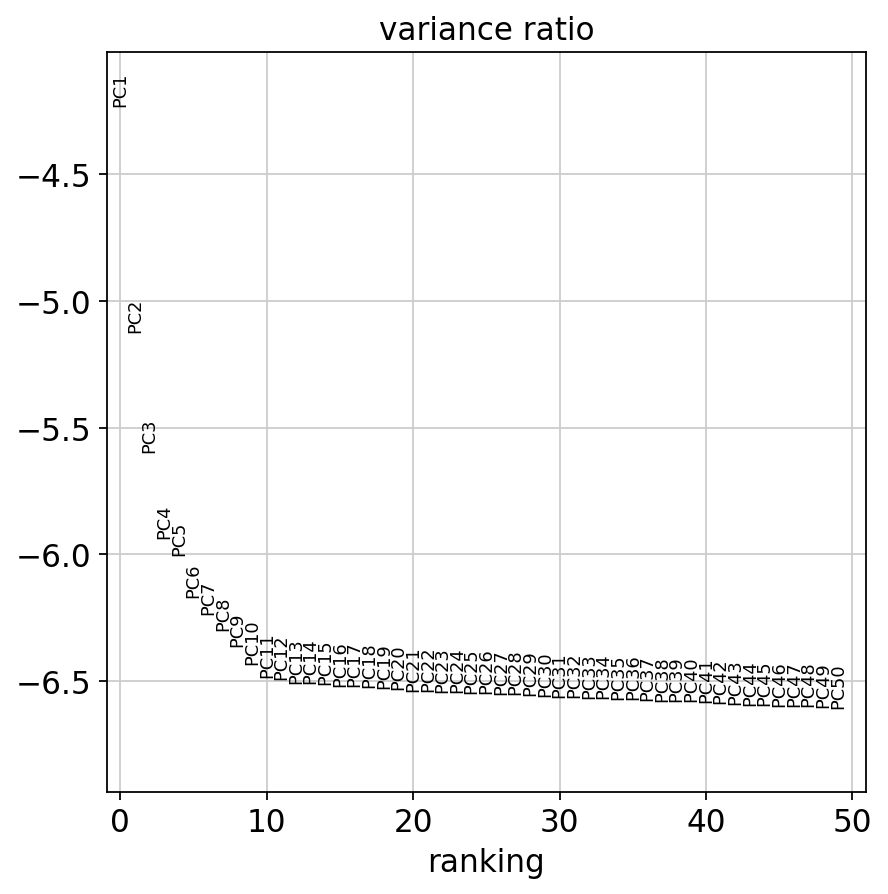

In [106]:
# Muestra un gráfico de la varianza explicada por los componentes principales (logaritmo)
sc.pl.pca_variance_ratio(adata3, log=True, n_pcs = 50)

-------
g) **sc.pp.neighbors**: Calcula la matriz de distancia de los vecinos más cercanos y un gráfico de vecindad de observaciones.\
La eficiencia de búsqueda de vecinos de esto depende en gran medida de UMAP (Aproximación y proyección de colector uniforme) que también proporciona un método para estimar las conectividades de los puntos de datos: la conectividad de la variedad.

`sc.pp.neighbors(adata`[Matriz de datos anotada], `n_pcs`[Utiliza la cantidad de PC] `= 30)`

In [107]:
# Calcula la matriz de vecinos más cercanos para las células usando los primeros 30 componentes principales
sc.pp.neighbors(adata3, n_pcs = 30)

---------
h) **sc.tl.umap**: Incrustra el gráfico de vecindad usando UMAP (Aproximación y proyección de colector uniforme) para visualizar datos de alta dimensión. Optimiza la incrustación de modo que refleje mejor la topología de los datos.

`sc.tl.umap(adata`[Matriz de datos anotada])

i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada])

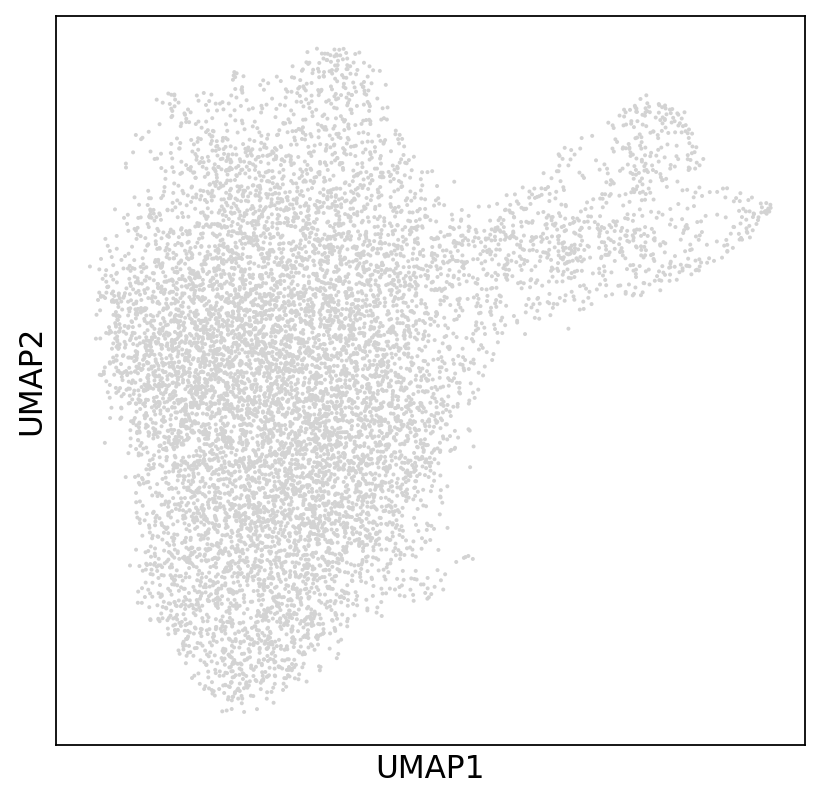

In [108]:
# Realiza una proyección de UMAP (técnica de reducción de dimensionalidad)
sc.tl.umap(adata3) # UMAP: visualizar datos de alta dimensión
# Crea un gráfico de UMAP para visualizar las células en el espacio reducido
sc.pl.umap(adata3)

--------
3. **Leiden**

Leiden comienza construyendo un "gráfico de vecinos", donde cada nodo representa una célula y los bordes representan conexiones entre células en función de su similitud (que a menudo se mide utilizando los k vecinos más cercanos u otras métricas de distancia). Luego, el algoritmo aplica un proceso llamado "detección de comunidad" para identificar grupos de células estrechamente relacionadas dentro del gráfico.

**Pasos clave**:

- **Particionado de nodos**: Leiden asigna células (nodos) a los grupos iniciales, lo que crea una partición del gráfico.
- **Refinamiento de nodos**: el algoritmo refina la partición evaluando la modularidad (una medida de la solidez de los clústeres) y moviendo los nodos para mejorar la modularidad.
- **Optimización de clústeres**: Leiden continúa refinando los clústeres hasta que no se puedan realizar más mejoras.
  
**Resultado final**: conjunto de clústeres que representan grupos distintos de células, que se pueden utilizar para análisis posteriores como visualización, expresión diferencial o anotación de tipo de célula.

-----
a) **sc.tl.leiden**: Agrupa células en subgrupos.

`sc.tl.leiden(adata`[La matriz de datos anotada], `resolution`[Un valor de parámetro que controla la tosquedad de la agrupación donde los valores más altos generan más agrupaciones] `= 1)`

In [109]:
# Realiza un clustering de las células utilizando el algoritmo Leiden con una resolución de 1
sc.tl.leiden(adata3, resolution = 1) # Por defecto la resolución es 1

In [110]:
# Muestra las observaciones (células) con las etiquetas del clustering Leiden
adata3.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGACCATAA-1,2698,4333.0,9.0,0.207708,4
AAACCCAAGACCCTTA-1,1823,3073.0,11.0,0.357956,8
AAACCCAAGTGCTCAT-1,2253,3308.0,6.0,0.181378,6
AAACCCACAACAGCCC-1,1872,2518.0,18.0,0.714853,0
AAACCCACACTAAACC-1,751,993.0,11.0,1.107754,0
...,...,...,...,...,...
TTTGTTGCACACAGCC-1,824,1062.0,9.0,0.847458,0
TTTGTTGCAGCAGAAC-1,2738,4735.0,15.0,0.316790,1
TTTGTTGCATAAGCGG-1,2598,4053.0,6.0,0.148038,2
TTTGTTGGTTCAGCGC-1,2383,4046.0,21.0,0.519031,5


------
i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada], `color`[Claves para anotaciones de observaciones/células o variables/genes] `=['leiden'])`

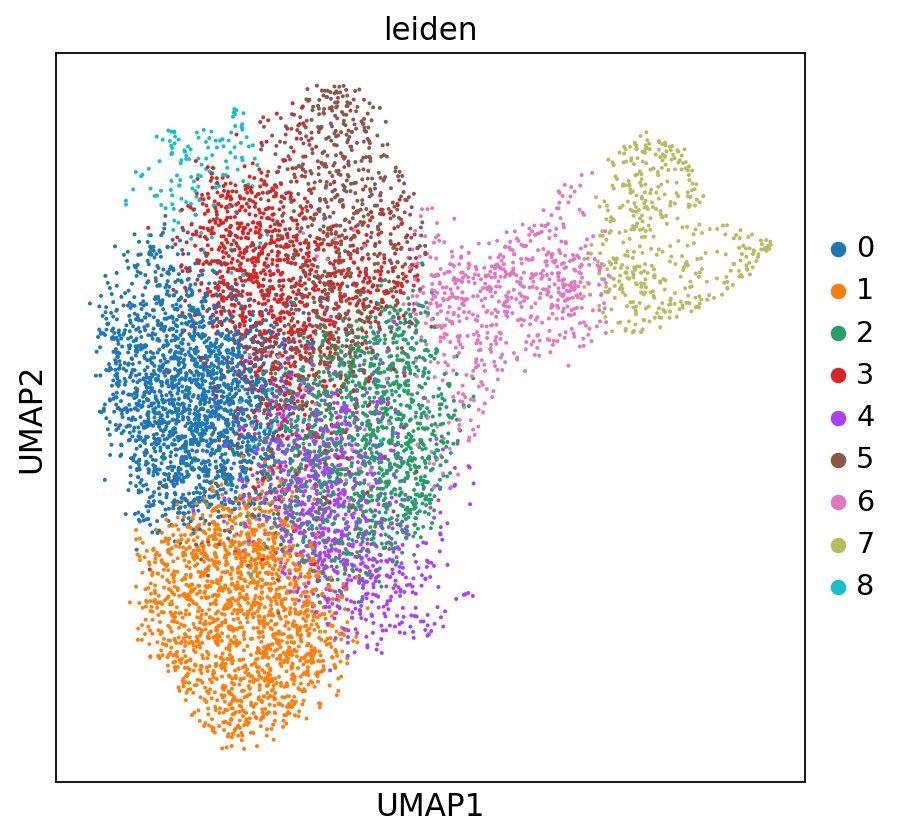

In [111]:
# Crea un gráfico UMAP coloreado por las etiquetas de los clusters Leiden
# Diagrama de dispersión en base UMAP.
sc.pl.umap(adata3, color=['leiden'])

-----
## <span style="color:darkseagreen">Muestra 4:**HB30_tumor_filtered_feature_bc_matrix**</span>

In [112]:
# Cambiar al directorio deseado
os.chdir('/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB30_tumor_filtered_feature_bc_matrix')

# Verificar el cambio de directorio y listar el contenido
print("Directorio actual:", os.getcwd())
print("Contenido del directorio:", os.listdir('.'))

Directorio actual: /home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB30_tumor_filtered_feature_bc_matrix
Contenido del directorio: ['cache', 'barcodes.tsv.gz', 'features.tsv.gz', 'matrix.mtx.gz']


In [113]:
pwd

'/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB30_tumor_filtered_feature_bc_matrix'

In [114]:
adata4 = sc.read_10x_mtx( # Lee los datos de la matriz en formato 10X
    "/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB30_tumor_filtered_feature_bc_matrix",  # Ruta al directorio que contiene matrix.mtx.gz, features.tsv.gz y barcodes.tsv.gz 
    var_names='gene_symbols',  # Configura los nombres de las variables como los símbolos de los genes
    cache=True # Guarda los datos en caché para acelerar futuras cargas
)

# Muestra un resumen de los datos cargados
adata4

AnnData object with n_obs × n_vars = 19042 × 33538
    var: 'gene_ids', 'feature_types'

## 1. Control de calidad
--------------------

### Preprocesamiento básico
-----------
1. Eliminación de células con alto contenido mitocondrial.\
   Niveles elevados de ARN mitocondrial pueden indicar células estresadas o moribundas. Para ello, se establece un umbral máximo para la expresión de genes mitocondriales (valor máximo: 20%)

In [115]:
# Crea una nueva columna 'mt' en la variable que contiene los genes, 
# indica cuáles genes pertenecen al ADN mitocondrial
adata4.var['mt'] = adata4.var.index.str.startswith('MT-')

In [116]:
# Muestra las variables del objeto 'adata', que incluye información sobre los genes
adata4.var

,gene_ids,feature_types,mt
MIR1302-2HG,ENSG00000243485,Gene Expression,False
FAM138A,ENSG00000237613,Gene Expression,False
OR4F5,ENSG00000186092,Gene Expression,False
AL627309.1,ENSG00000238009,Gene Expression,False
AL627309.3,ENSG00000239945,Gene Expression,False
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,False
AC233755.1,ENSG00000275063,Gene Expression,False
AC240274.1,ENSG00000271254,Gene Expression,False
AC213203.1,ENSG00000277475,Gene Expression,False


------------
a) **pp.calculate_qc_metrics**: cálculo de métricas de control de calidad.\
parámetros utilizados:\
`sc.pp.calculate_qc_metrics(adata`[Matriz de datos anotada], `qc_vars`[Tipo de cosa que son las variables, aquí son genes mitocondriales], `percent_top`[Lista de rangos de la porción acumulada de expresión como un porcentaje, aquí no se calculan], `log1p`[Transformadas], `inplace`[Para colocar métricas calculadas])

In [117]:
# Calcula métricas de control de calidad (QC), como el porcentaje de genes mitocondriales
sc.pp.calculate_qc_metrics(adata4, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [118]:
# Ordena las variables (genes) de acuerdo al número de células en las que están presentes
adata4.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AC083829.2,ENSG00000285122,Gene Expression,False,0,0.000000,100.000000,0.0
AC079154.1,ENSG00000228400,Gene Expression,False,0,0.000000,100.000000,0.0
AC073409.1,ENSG00000226708,Gene Expression,False,0,0.000000,100.000000,0.0
AC062020.1,ENSG00000237856,Gene Expression,False,0,0.000000,100.000000,0.0
AC126323.5,ENSG00000260957,Gene Expression,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...
FTL,ENSG00000087086,Gene Expression,False,19020,15.452683,0.115534,294250.0
APOB,ENSG00000084674,Gene Expression,False,19025,19.870392,0.089276,378372.0
ALB,ENSG00000163631,Gene Expression,False,19041,43.669571,0.005252,831556.0
APOA2,ENSG00000158874,Gene Expression,False,19042,38.420177,0.000000,731597.0


------------------
2. **Filtrado de células con bajo recuento de genes**\
Aquellas que expresan una menor cantidad de genes únicos pueden ser poco informativas o pueden mostrar un error técnico.\
-> Aplicamos un umbral mínimo para excluir las células de baja calidad.

a) **sc.pp.filter_genes**: filtra genes según sea el número de células o recuentos.

`sc.pp.filter_genes(adata`[Matriz de datos anotada de forma n_obs× n_vars, donde las filas corresponden a las células y las columnas a los genes], `min_cells`[Número mínimo de células expresadas necesarias para que un gen pase el filtrado]`=3)`

In [119]:
# Filtra los genes que están presentes en menos de 3 células
sc.pp.filter_genes(adata4, min_cells=3)

In [120]:
# Ordena nuevamente las variables para ver los genes después del filtrado
adata4.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
LINC00489,ENSG00000225759,Gene Expression,False,3,0.000158,99.984245,3.0,3
ADIG,ENSG00000182035,Gene Expression,False,3,0.000158,99.984245,3.0,3
SLC32A1,ENSG00000101438,Gene Expression,False,3,0.000158,99.984245,3.0,3
REPIN1,ENSG00000214022,Gene Expression,False,3,0.000158,99.984245,3.0,3
FAM131B,ENSG00000159784,Gene Expression,False,3,0.000158,99.984245,3.0,3
...,...,...,...,...,...,...,...,...
FTL,ENSG00000087086,Gene Expression,False,19020,15.452683,0.115534,294250.0,19020
APOB,ENSG00000084674,Gene Expression,False,19025,19.870392,0.089276,378372.0,19025
ALB,ENSG00000163631,Gene Expression,False,19041,43.669571,0.005252,831556.0,19041
APOA2,ENSG00000158874,Gene Expression,False,19042,38.420177,0.000000,731597.0,19042


---------
b) **sc.pl.violin**: Trama de violín.\
`sc.pl.violin(adata`[Matriz de datos anotada], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             `jitter`[Agrega fluctuación al diagrama de bandas (solo cuando el diagrama de bandas es Verdadero)]`=0.4, multi_panel`[Muestra teclas en varios paneles]`=True)`

- “n_cells_by_counts”: Número de celdas en las que se mide esta expresión.
- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

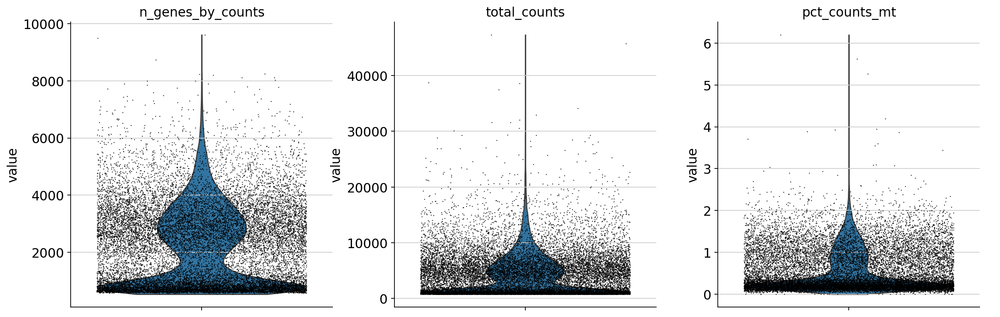

In [121]:
# Crea gráficos de violín para observar la distribución de métricas como el número de genes, el conteo total, 
# y el porcentaje de genes mitocondriales (indicador de calidad de la célula)
sc.pl.violin(adata4, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

---------
3. **Identificación y evalucación de células atípicas con expresión génica inusualmente alta o baja, así como otras características extremas**: Estas células atípicas pueden ser resultado de problemas técnicos o representar tipos de células poco comunes.

-> Uso de métodos estadísticos para determinar su inclusión o eliminación en el análisis.

a) **np.quantile**: Calcula el cuartil q-ésimo de los datos a lo largo del eje especificado.

`np.quantile(adata.obs.n_genes_by_counts.values, .98)`

In [122]:
# Calcula el límite superior del número de genes por célula (percentil 98)
upper_lim_genes = np.quantile(adata4.obs.n_genes_by_counts.values, .98)
# Muestra el valor calculado del límite superior de genes por célula
upper_lim_genes

5464.18

In [123]:
# Filtra las células que tienen un número de genes por debajo del límite superior calculado
adata4 = adata4[adata4.obs.n_genes_by_counts < upper_lim_genes]

In [124]:
# Calcula el límite superior de los conteos totales por célula (percentil 98)
upper_lim_counts = np.quantile(adata4.obs.total_counts.values, .98)
# Muestra el valor calculado del límite superior de conteos totales por célula
upper_lim_counts

12378.999999999996

In [125]:
# Filtra las células que tienen un total de conteos menor a  10,000
adata4 = adata4[adata4.obs.total_counts < 10000]

In [126]:
# Filtra las células que tienen menos del 20% de genes mitocondriales
adata4 = adata4[adata4.obs.pct_counts_mt < 20]

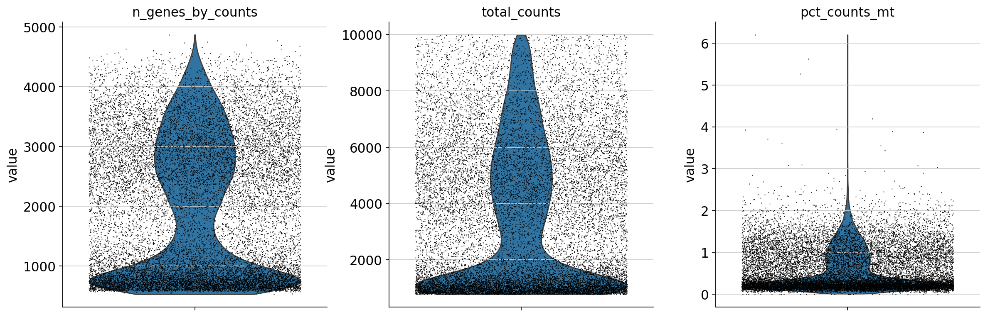

In [127]:
# Crea gráficos de violín nuevamente después del filtrado para comparar las métricas
sc.pl.violin(adata4, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

In [128]:
# Muestra información actualizada del objeto 'adata' después del filtrado
adata4

View of AnnData object with n_obs × n_vars = 17607 × 26902
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

-------
## 2. Normalización

La normalización nos permite ajustar la variabilidad de los datos que surge de las diferencias en la profundidad de secuenciación, el tamaño de las células así como otros factores técnicos. 

-> Aquí se garantiza que las diferencias observadas entre las células se deban a la variación biológica y no a problemas técnicos.

La normalización de recuento total implica escalar los recuentos brutos de cada célula por los recuentos totales de esa célula, seguido de una transformación logarítmica para estabilizar los datos. El logaritmo desplazado resulta beneficioso para estabilizar la varianza para la posterior reducción de la dimensionalidad y la identificación de genes expresados de forma diferencial.

In [129]:
# Suma los valores de la matriz de expresión a lo largo de las células (para cada célula)
adata4.X.sum(axis = 1)

matrix([[ 804.],
        [5375.],
        [ 910.],
        ...,
        [4131.],
        [ 894.],
        [5715.]], dtype=float32)

-------
1. **Escalado por recuentos totales** :Aquí se ajustan los recuentos de cada célula para considerar las diferencias en la profundidad de secuenciación o en el continido total de ARN. Comunmente se escalan los recuentos por un factor constante, normalmente 10 000 ("recuentos por diez mil" o CPTT). 

-> Crea una línea de base común para todas las células.

a) **sc.pp.normalize_total**: Normaliza los recuentos por celda.

`sc.pp.normalize_total(adata`[Matriz de datos anotada como n_obs x n_vars donde las filas corresponden a las células y las columnas corresponden a los genes], `target_sum`[cada observación (celda) tiene un recuento total igual a la mediana de los recuentos totales de las observaciones (celdas) antes de la normalización]`=1e4)`

In [130]:
# Normaliza los datos de expresión para que el total por célula sea igual a 10,000
sc.pp.normalize_total(adata4, target_sum=1e4) # normaliza cada celda a 10.000 UMI

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [131]:
# Verifica nuevamente la suma de la matriz de expresión para cada célula después de la normalización
adata4.X.sum(axis = 1)

matrix([[10000.007],
        [ 9999.738],
        [ 9999.953],
        ...,
        [10000.152],
        [ 9999.967],
        [10000.271]], dtype=float32)

--------
2. **Transformación logarítmica**

Scanpy aplica una transformación logarítmica a los recuentos escalados, la cual nos ayuda a estabilizar la varianza para que los datos sean menos sensibles a los valores extremos y de este modo pueda facilitar el análisis posterior.

In [132]:
# Aplica la transformación logarítmica a los datos (logaritmo natural)
sc.pp.log1p(adata4)

In [133]:
# Verifica la suma de la matriz de expresión después de la transformación logarítmica
adata4.X.sum(axis = 1)

matrix([[1614.8112],
        [3968.8274],
        [1764.021 ],
        ...,
        [3404.8042],
        [1767.987 ],
        [3732.4668]], dtype=float32)

In [134]:
# Almacena una copia de los datos sin procesar en 'adata.raw' para futuras referencias
adata4.raw = adata4

## 3. Clustering

**Objetivo**: explorar la diversidad celular e identificar tipos o estados celulares únicos. 

Este agrupamiento nos permite categorizar las células en función de sus perfiles de expresión genética y nos da información sobre la composición de una muestra.

Los datos de células individuales suelen tener miles de genes, lo que los hace altamente dimensionales. Antes del agrupamiento, se usan técnicas de reducción de dimensionalidad PCA (Análisis de componentes principales) y UMAP (Aproximación y proyección de colector uniforme) para reducir los datos a un espacio de menor dimensión. En este caso, se utiliza un agrupamiento basado en gráficos, el cual organiza las células en grupos en función de su conectividad en una estructura gráfica. 

**Algoritmo de Leiden**: es un método de agrupamiento basado en gráficos conocido por su eficiencia, precisión y solidez. Se usa ampliamente en el análisis de células individuales debido a su capacidad para encontrar grupos bien definidos en conjuntos de datos complejos.

-------
a) **sc.pp.highly_variable_genes**: Anota genes que son altamente variables.

`sc.pp.highly_variable_genes(adata`[Matriz de datos anotada por n_obs x n_var, donde las filas corresponden al número de células y las columnas correspondel al número de genes], `n_top_genes`[Número de genes altamente variables que se deben conservar] `= 2000)`

In [135]:
# Identificación de genes altamente variables
sc.pp.highly_variable_genes(adata4, n_top_genes = 2000)

In [136]:
# Muestra la información sobre los genes, incluyendo cuáles son altamente variables
adata4.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,False,384,0.020744,97.983405,395.0,384,False,0.035193,1.412551,-0.210155
AL627309.2,ENSG00000239906,Gene Expression,False,21,0.001103,99.889717,21.0,21,False,0.002142,1.666696,0.424818
AL627309.4,ENSG00000241599,Gene Expression,False,3,0.000158,99.984245,3.0,3,False,0.000344,0.720173,-1.940032
AC114498.1,ENSG00000235146,Gene Expression,False,22,0.001155,99.884466,22.0,22,False,0.002420,1.725839,0.572582
AL669831.2,ENSG00000229905,Gene Expression,False,16,0.000840,99.915975,16.0,16,False,0.002004,1.611397,0.286654
...,...,...,...,...,...,...,...,...,...,...,...,...
AC007325.2,ENSG00000277196,Gene Expression,False,4,0.000210,99.978994,4.0,4,False,0.000280,0.220981,-3.187243
AL354822.1,ENSG00000278384,Gene Expression,False,58,0.003151,99.695410,60.0,58,False,0.005717,1.474920,-0.054327
AC004556.1,ENSG00000276345,Gene Expression,False,20,0.001050,99.894969,20.0,20,False,0.001838,1.603100,0.265924
AC240274.1,ENSG00000271254,Gene Expression,False,341,0.018275,98.209222,348.0,341,False,0.029682,1.183590,-0.782204


-------
b) **#sc.pl.highly_variable_genes(adata)**: Grafica dispersiones o varianza normalizada vs medias para los genes.

`sc.pl.highly_variable_genes(adata`[Muestra el resultado de "highly_variable_genes"])

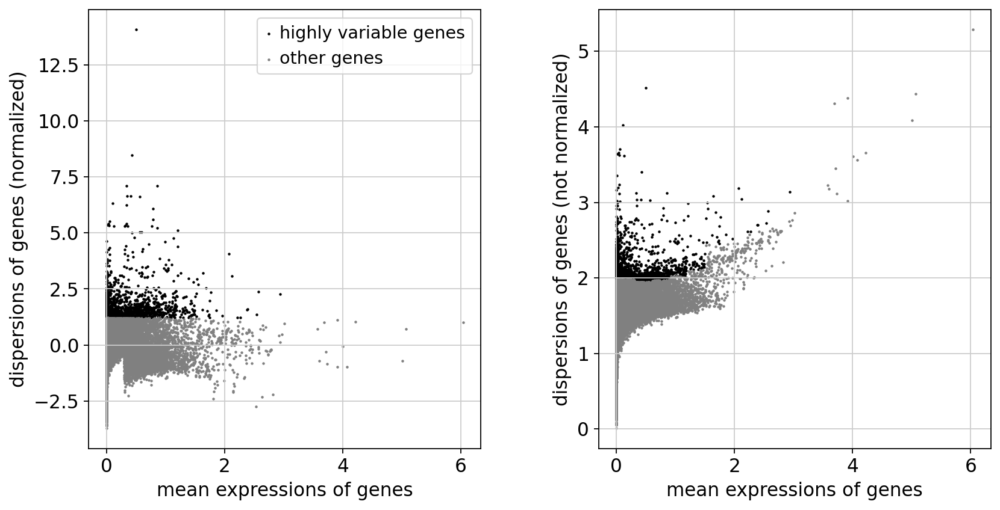

In [137]:
# Crea un gráfico de los genes altamente variables
sc.pl.highly_variable_genes(adata4)

In [138]:
# Mantiene solo los genes altamente variables en los datos para los siguientes análisis
adata4 = adata4[:, adata4.var.highly_variable]

-------
c) **sc.pp.regress_out**: Eliminar (en su mayoría) las fuentes de variación no deseadas mediante regresión lineal simple.

`sc.pp.regress_out(adata`[La matriz de datos anotada], ['total_counts', 'pct_counts_mt'])

- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

In [139]:
# Reajusta los efectos de covariables como el número total de conteos y el porcentaje de genes mitocondriales
sc.pp.regress_out(adata4, ['total_counts', 'pct_counts_mt'])

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


------
d) **sc.pp.scale**: Escala datos a varianza unitaria y media cero.

`sc.pp.scale(adata`[Matriz de datos (anotada) de forma n_obs× n_vars. Las filas corresponden a las células y las columnas a los genes], `max_value`[Recortar (truncar) a este valor después de escalar]`=10)`

In [140]:
# Escala los datos para que cada gen tenga media 0 y varianza 1, con un valor máximo de 10
sc.pp.scale(adata4, max_value=10)

------
e) **sc.tl.pca**: Análisis de Componentes Principales (PCA) que calcula coordenadas de PCA, cargas y descomposición de varianza.

`sc.tl.pca(adata`[Matriz de datos (anotada) de forma n_obs× n_vars donde las filas corresponden a las células y las columnas a los genes], `svd_solver`[Solucionador SVD a utilizar]`='arpack')`

In [141]:
# Realiza análisis de componentes principales (PCA) para reducir la dimensionalidad de los datos
sc.tl.pca(adata4, svd_solver='arpack')

-------
f) **sc.pl.pca_variance_ratio**: Grafica la razón de varianza.

`sc.pl.pca_variance_ratio(adata`[Matriz de datos anotada], `log`[Trazar en escala logarítmica]`=True, n_pcs`[Número de PC a mostrar, por defecto es igual a 30 pero varía] `= 50)`

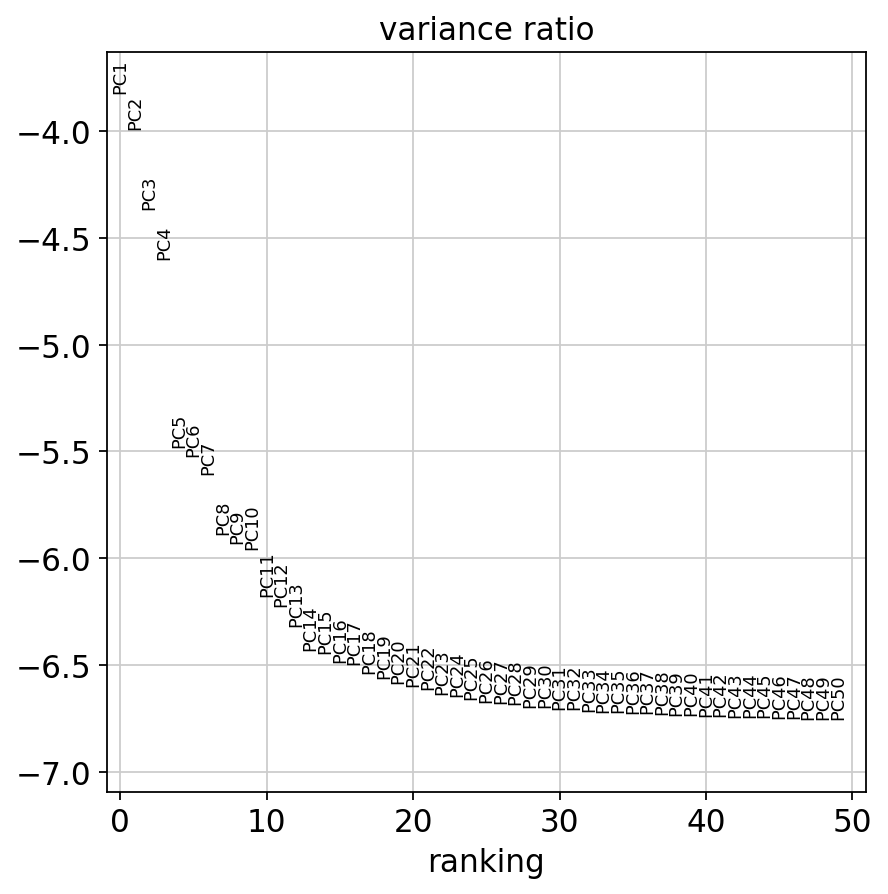

In [142]:
# Muestra un gráfico de la varianza explicada por los componentes principales (logaritmo)
sc.pl.pca_variance_ratio(adata4, log=True, n_pcs = 50)

-------
g) **sc.pp.neighbors**: Calcula la matriz de distancia de los vecinos más cercanos y un gráfico de vecindad de observaciones.\
La eficiencia de búsqueda de vecinos de esto depende en gran medida de UMAP (Aproximación y proyección de colector uniforme) que también proporciona un método para estimar las conectividades de los puntos de datos: la conectividad de la variedad.

`sc.pp.neighbors(adata`[Matriz de datos anotada], `n_pcs`[Utiliza la cantidad de PC] `= 30)`

In [143]:
# Calcula la matriz de vecinos más cercanos para las células usando los primeros 30 componentes principales
sc.pp.neighbors(adata4, n_pcs = 30)

---------
h) **sc.tl.umap**: Incrustra el gráfico de vecindad usando UMAP (Aproximación y proyección de colector uniforme) para visualizar datos de alta dimensión. Optimiza la incrustación de modo que refleje mejor la topología de los datos.

`sc.tl.umap(adata`[Matriz de datos anotada])

i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada])

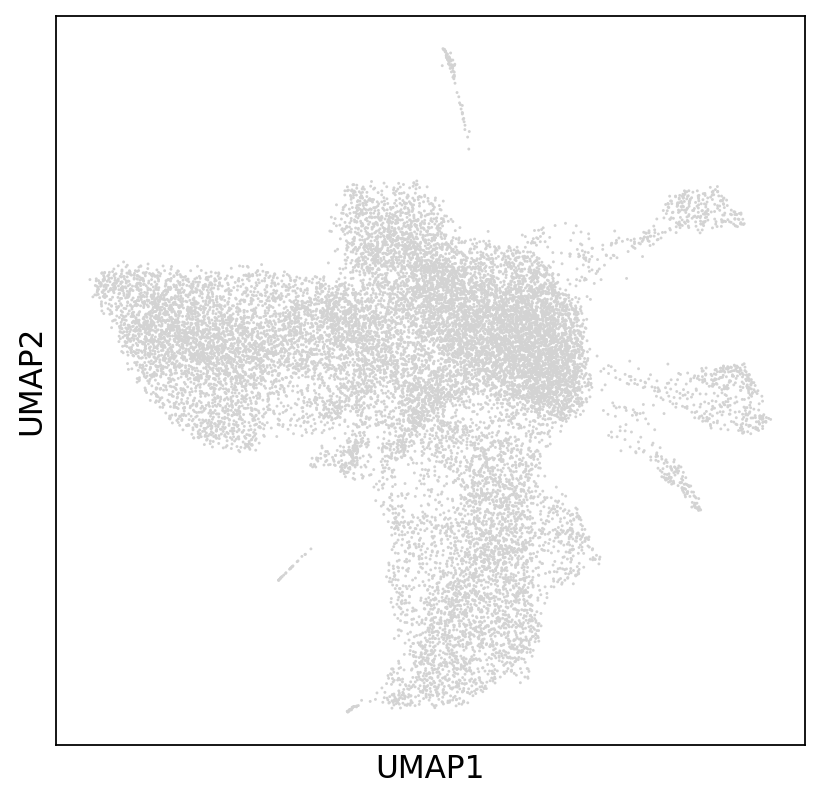

In [144]:
# Realiza una proyección de UMAP (técnica de reducción de dimensionalidad)
sc.tl.umap(adata4) # UMAP: visualizar datos de alta dimensión
# Crea un gráfico de UMAP para visualizar las células en el espacio reducido
sc.pl.umap(adata4)

--------
3. **Leiden**

Leiden comienza construyendo un "gráfico de vecinos", donde cada nodo representa una célula y los bordes representan conexiones entre células en función de su similitud (que a menudo se mide utilizando los k vecinos más cercanos u otras métricas de distancia). Luego, el algoritmo aplica un proceso llamado "detección de comunidad" para identificar grupos de células estrechamente relacionadas dentro del gráfico.

**Pasos clave**:

- **Particionado de nodos**: Leiden asigna células (nodos) a los grupos iniciales, lo que crea una partición del gráfico.
- **Refinamiento de nodos**: el algoritmo refina la partición evaluando la modularidad (una medida de la solidez de los clústeres) y moviendo los nodos para mejorar la modularidad.
- **Optimización de clústeres**: Leiden continúa refinando los clústeres hasta que no se puedan realizar más mejoras.
  
**Resultado final**: conjunto de clústeres que representan grupos distintos de células, que se pueden utilizar para análisis posteriores como visualización, expresión diferencial o anotación de tipo de célula.

-----
a) **sc.tl.leiden**: Agrupa células en subgrupos.

`sc.tl.leiden(adata`[La matriz de datos anotada], `resolution`[Un valor de parámetro que controla la tosquedad de la agrupación donde los valores más altos generan más agrupaciones] `= 1)`

In [145]:
# Realiza un clustering de las células utilizando el algoritmo Leiden con una resolución de 1
sc.tl.leiden(adata4, resolution = 1) # Por defecto la resolución es 1

In [146]:
# Muestra las observaciones (células) con las etiquetas del clustering Leiden
adata4.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGAAATCCA-1,590,804.0,12.0,1.492537,6
AAACCCAAGAGATCGC-1,3056,5376.0,11.0,0.204613,1
AAACCCAAGGTTACCT-1,672,910.0,10.0,1.098901,1
AAACCCACAAAGCTCT-1,2788,4787.0,15.0,0.313349,4
AAACCCACAAAGGATT-1,594,795.0,9.0,1.132076,0
...,...,...,...,...,...
TTTGTTGTCATTCATC-1,603,825.0,9.0,1.090909,0
TTTGTTGTCCGTGGCA-1,2261,3473.0,14.0,0.403110,9
TTTGTTGTCCTTGGAA-1,2269,4131.0,9.0,0.217865,10
TTTGTTGTCGTCGCTT-1,670,894.0,9.0,1.006711,0


------
i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada], `color`[Claves para anotaciones de observaciones/células o variables/genes] `=['leiden'])`

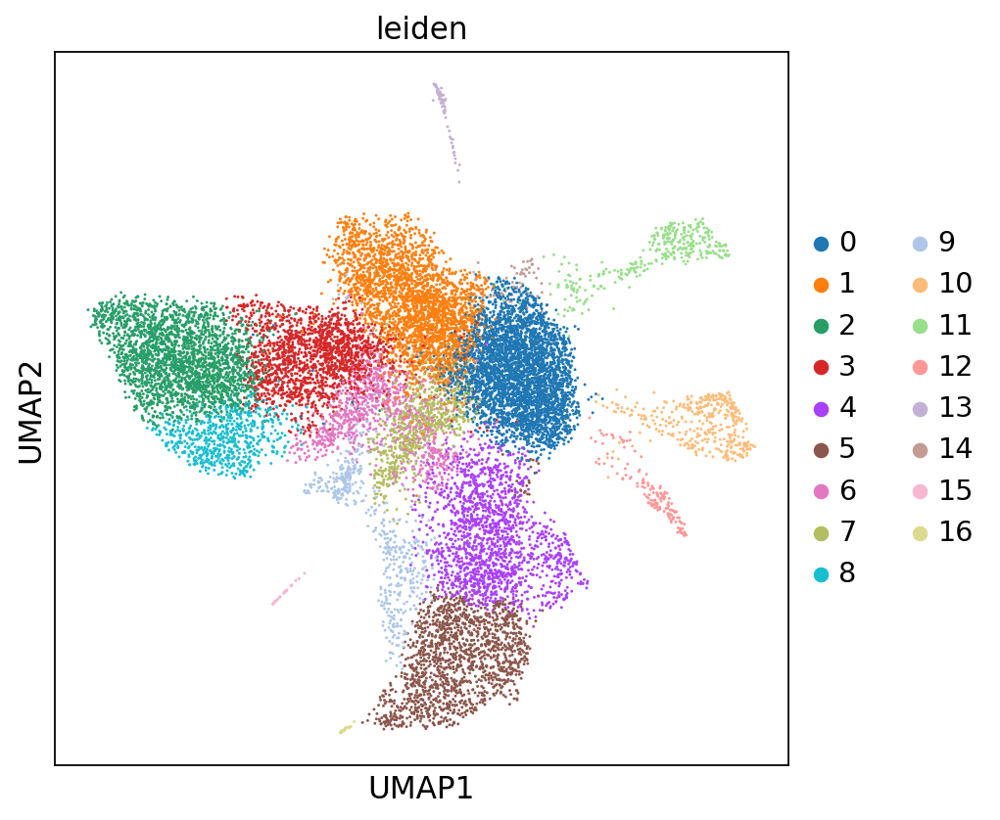

In [147]:
# Crea un gráfico UMAP coloreado por las etiquetas de los clusters Leiden
# Diagrama de dispersión en base UMAP.
sc.pl.umap(adata4, color=['leiden'])

------
## <span style="color:darkseagreen">Muestra 5: **HB53_background_filtered_feature_bc_matrix**</span>

In [148]:
# Cambiar al directorio deseado
os.chdir('/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB53_background_filtered_feature_bc_matrix')

# Verificar el cambio de directorio y listar el contenido
print("Directorio actual:", os.getcwd())
print("Contenido del directorio:", os.listdir('.'))

Directorio actual: /home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB53_background_filtered_feature_bc_matrix
Contenido del directorio: ['cache', 'barcodes.tsv.gz', 'features.tsv.gz', 'matrix.mtx.gz']


In [149]:
pwd

'/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB53_background_filtered_feature_bc_matrix'

In [150]:
adata5 = sc.read_10x_mtx( # Lee los datos de la matriz en formato 10X
    "/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB53_background_filtered_feature_bc_matrix",  # Ruta al directorio que contiene matrix.mtx.gz, features.tsv.gz y barcodes.tsv.gz 
    var_names='gene_symbols',  # Configura los nombres de las variables como los símbolos de los genes
    cache=True # Guarda los datos en caché para acelerar futuras cargas
)

# Muestra un resumen de los datos cargados
adata5

AnnData object with n_obs × n_vars = 8540 × 33538
    var: 'gene_ids', 'feature_types'

## 1. Control de calidad
--------------------

### Preprocesamiento básico
-----------
1. Eliminación de células con alto contenido mitocondrial.\
   Niveles elevados de ARN mitocondrial pueden indicar células estresadas o moribundas. Para ello, se establece un umbral máximo para la expresión de genes mitocondriales (valor máximo: 20%)

In [151]:
# Crea una nueva columna 'mt' en la variable que contiene los genes, 
# indica cuáles genes pertenecen al ADN mitocondrial
adata5.var['mt'] = adata5.var.index.str.startswith('MT-')

In [152]:
# Muestra las variables del objeto 'adata', que incluye información sobre los genes
adata5.var

,gene_ids,feature_types,mt
MIR1302-2HG,ENSG00000243485,Gene Expression,False
FAM138A,ENSG00000237613,Gene Expression,False
OR4F5,ENSG00000186092,Gene Expression,False
AL627309.1,ENSG00000238009,Gene Expression,False
AL627309.3,ENSG00000239945,Gene Expression,False
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,False
AC233755.1,ENSG00000275063,Gene Expression,False
AC240274.1,ENSG00000271254,Gene Expression,False
AC213203.1,ENSG00000277475,Gene Expression,False


------------
a) **pp.calculate_qc_metrics**: cálculo de métricas de control de calidad.\
parámetros utilizados:\
`sc.pp.calculate_qc_metrics(adata`[Matriz de datos anotada], `qc_vars`[Tipo de cosa que son las variables, aquí son genes mitocondriales], `percent_top`[Lista de rangos de la porción acumulada de expresión como un porcentaje, aquí no se calculan], `log1p`[Transformadas], `inplace`[Para colocar métricas calculadas])

In [153]:
# Calcula métricas de control de calidad (QC), como el porcentaje de genes mitocondriales
sc.pp.calculate_qc_metrics(adata5, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [154]:
# Ordena las variables (genes) de acuerdo al número de células en las que están presentes
adata5.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AL645608.5,ENSG00000241180,Gene Expression,False,0,0.000000,100.000000,0.0
AJ011932.1,ENSG00000274248,Gene Expression,False,0,0.000000,100.000000,0.0
AL391845.2,ENSG00000233542,Gene Expression,False,0,0.000000,100.000000,0.0
AL391845.1,ENSG00000226969,Gene Expression,False,0,0.000000,100.000000,0.0
AIRE,ENSG00000160224,Gene Expression,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...
MT2A,ENSG00000125148,Gene Expression,False,8515,17.452225,0.292740,149042.0
FGB,ENSG00000171564,Gene Expression,False,8519,32.610188,0.245902,278491.0
SERPINA1,ENSG00000197249,Gene Expression,False,8523,13.930679,0.199063,118968.0
MALAT1,ENSG00000251562,Gene Expression,False,8540,364.595795,0.000000,3113648.0


------------------
2. **Filtrado de células con bajo recuento de genes**\
Aquellas que expresan una menor cantidad de genes únicos pueden ser poco informativas o pueden mostrar un error técnico.\
-> Aplicamos un umbral mínimo para excluir las células de baja calidad.

a) **sc.pp.filter_genes**: filtra genes según sea el número de células o recuentos.

`sc.pp.filter_genes(adata`[Matriz de datos anotada de forma n_obs× n_vars, donde las filas corresponden a las células y las columnas a los genes], `min_cells`[Número mínimo de células expresadas necesarias para que un gen pase el filtrado]`=3)`

In [155]:
# Filtra los genes que están presentes en menos de 3 células
sc.pp.filter_genes(adata5, min_cells=3)

In [156]:
# Ordena nuevamente las variables para ver los genes después del filtrado
adata5.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
RAX,ENSG00000134438,Gene Expression,False,3,0.000351,99.964871,3.0,3
AC106771.1,ENSG00000248783,Gene Expression,False,3,0.000468,99.964871,4.0,3
AP001468.1,ENSG00000228404,Gene Expression,False,3,0.000351,99.964871,3.0,3
FNDC10,ENSG00000228594,Gene Expression,False,3,0.000351,99.964871,3.0,3
AC137936.1,ENSG00000283148,Gene Expression,False,3,0.000351,99.964871,3.0,3
...,...,...,...,...,...,...,...,...
MT2A,ENSG00000125148,Gene Expression,False,8515,17.452225,0.292740,149042.0,8515
FGB,ENSG00000171564,Gene Expression,False,8519,32.610188,0.245902,278491.0,8519
SERPINA1,ENSG00000197249,Gene Expression,False,8523,13.930679,0.199063,118968.0,8523
ALB,ENSG00000163631,Gene Expression,False,8540,20.547424,0.000000,175475.0,8540


---------
b) **sc.pl.violin**: Trama de violín.\
`sc.pl.violin(adata`[Matriz de datos anotada], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             `jitter`[Agrega fluctuación al diagrama de bandas (solo cuando el diagrama de bandas es Verdadero)]`=0.4, multi_panel`[Muestra teclas en varios paneles]`=True)`

- “n_cells_by_counts”: Número de celdas en las que se mide esta expresión.
- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

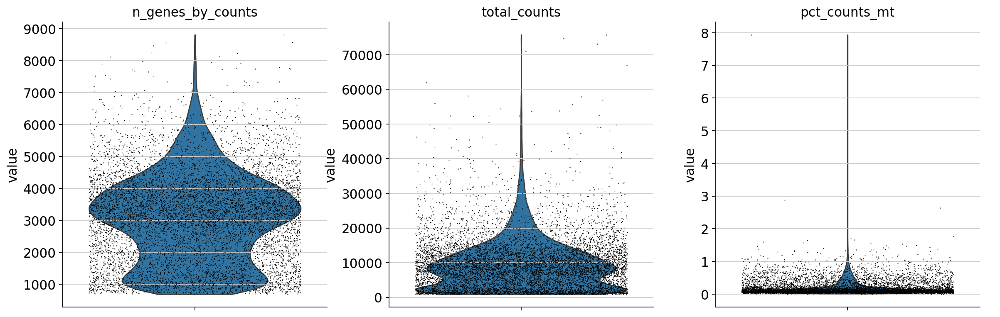

In [157]:
# Crea gráficos de violín para observar la distribución de métricas como el número de genes, el conteo total, 
# y el porcentaje de genes mitocondriales (indicador de calidad de la célula)
sc.pl.violin(adata5, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

---------
3. **Identificación y evalucación de células atípicas con expresión génica inusualmente alta o baja, así como otras características extremas**: Estas células atípicas pueden ser resultado de problemas técnicos o representar tipos de células poco comunes.

-> Uso de métodos estadísticos para determinar su inclusión o eliminación en el análisis.

a) **np.quantile**: Calcula el cuartil q-ésimo de los datos a lo largo del eje especificado.

`np.quantile(adata.obs.n_genes_by_counts.values, .98)`

In [158]:
# Calcula el límite superior del número de genes por célula (percentil 98)
upper_lim_genes = np.quantile(adata5.obs.n_genes_by_counts.values, .98)
# Muestra el valor calculado del límite superior de genes por célula
upper_lim_genes

6081.659999999998

In [159]:
# Filtra las células que tienen un número de genes por debajo del límite superior calculado
adata5 = adata5[adata5.obs.n_genes_by_counts < upper_lim_genes]

In [160]:
# Calcula el límite superior de los conteos totales por célula (percentil 98)
upper_lim_counts = np.quantile(adata5.obs.total_counts.values, .98)
# Muestra el valor calculado del límite superior de conteos totales por célula
upper_lim_counts

24815.59999999999

In [161]:
# Filtra las células que tienen un total de conteos menor a  10,000
adata5 = adata5[adata5.obs.total_counts < 10000]

In [162]:
# Filtra las células que tienen menos del 20% de genes mitocondriales
adata5 = adata5[adata5.obs.pct_counts_mt < 20]

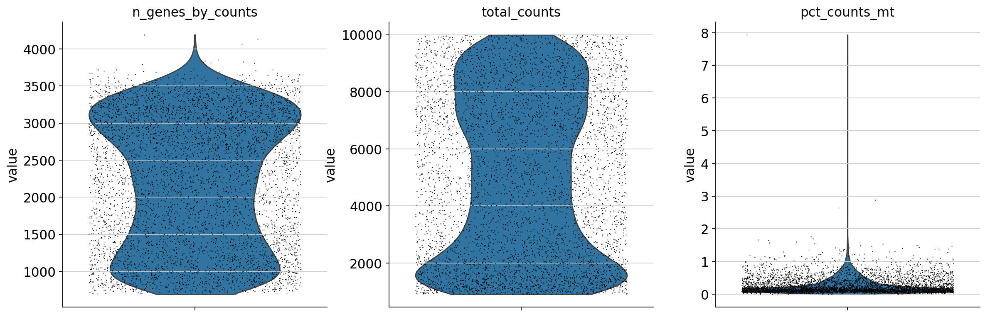

In [163]:
# Crea gráficos de violín nuevamente después del filtrado para comparar las métricas
sc.pl.violin(adata5, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

In [164]:
# Muestra información actualizada del objeto 'adata' después del filtrado
adata5

View of AnnData object with n_obs × n_vars = 5208 × 25204
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

-------
## 2. Normalización

La normalización nos permite ajustar la variabilidad de los datos que surge de las diferencias en la profundidad de secuenciación, el tamaño de las células así como otros factores técnicos. 

-> Aquí se garantiza que las diferencias observadas entre las células se deban a la variación biológica y no a problemas técnicos.

La normalización de recuento total implica escalar los recuentos brutos de cada célula por los recuentos totales de esa célula, seguido de una transformación logarítmica para estabilizar los datos. El logaritmo desplazado resulta beneficioso para estabilizar la varianza para la posterior reducción de la dimensionalidad y la identificación de genes expresados de forma diferencial.

In [165]:
# Suma los valores de la matriz de expresión a lo largo de las células (para cada célula)
adata5.X.sum(axis = 1)

matrix([[6234.],
        [9726.],
        [4996.],
        ...,
        [7562.],
        [9794.],
        [6761.]], dtype=float32)

-------
1. **Escalado por recuentos totales** :Aquí se ajustan los recuentos de cada célula para considerar las diferencias en la profundidad de secuenciación o en el continido total de ARN. Comunmente se escalan los recuentos por un factor constante, normalmente 10 000 ("recuentos por diez mil" o CPTT). 

-> Crea una línea de base común para todas las células.

a) **sc.pp.normalize_total**: Normaliza los recuentos por celda.

`sc.pp.normalize_total(adata`[Matriz de datos anotada como n_obs x n_vars donde las filas corresponden a las células y las columnas corresponden a los genes], `target_sum`[cada observación (celda) tiene un recuento total igual a la mediana de los recuentos totales de las observaciones (celdas) antes de la normalización]`=1e4)`

In [166]:
# Normaliza los datos de expresión para que el total por célula sea igual a 10,000
sc.pp.normalize_total(adata5, target_sum=1e4) # normaliza cada celda a 10.000 UMI

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [167]:
# Verifica nuevamente la suma de la matriz de expresión para cada célula después de la normalización
adata5.X.sum(axis = 1)

matrix([[ 9999.985],
        [10000.152],
        [10000.075],
        ...,
        [ 9999.902],
        [10000.103],
        [10000.098]], dtype=float32)

--------
2. **Transformación logarítmica**

Scanpy aplica una transformación logarítmica a los recuentos escalados, la cual nos ayuda a estabilizar la varianza para que los datos sean menos sensibles a los valores extremos y de este modo pueda facilitar el análisis posterior.

In [168]:
# Aplica la transformación logarítmica a los datos (logaritmo natural)
sc.pp.log1p(adata5)

In [169]:
# Verifica la suma de la matriz de expresión después de la transformación logarítmica
adata5.X.sum(axis = 1)

matrix([[3542.2986],
        [3864.0945],
        [3340.7969],
        ...,
        [3578.0364],
        [3639.303 ],
        [3511.941 ]], dtype=float32)

In [170]:
# Almacena una copia de los datos sin procesar en 'adata.raw' para futuras referencias
adata5.raw = adata5

## 3. Clustering

**Objetivo**: explorar la diversidad celular e identificar tipos o estados celulares únicos. 

Este agrupamiento nos permite categorizar las células en función de sus perfiles de expresión genética y nos da información sobre la composición de una muestra.

Los datos de células individuales suelen tener miles de genes, lo que los hace altamente dimensionales. Antes del agrupamiento, se usan técnicas de reducción de dimensionalidad PCA (Análisis de componentes principales) y UMAP (Aproximación y proyección de colector uniforme) para reducir los datos a un espacio de menor dimensión. En este caso, se utiliza un agrupamiento basado en gráficos, el cual organiza las células en grupos en función de su conectividad en una estructura gráfica. 

**Algoritmo de Leiden**: es un método de agrupamiento basado en gráficos conocido por su eficiencia, precisión y solidez. Se usa ampliamente en el análisis de células individuales debido a su capacidad para encontrar grupos bien definidos en conjuntos de datos complejos.

-------
a) **sc.pp.highly_variable_genes**: Anota genes que son altamente variables.

`sc.pp.highly_variable_genes(adata`[Matriz de datos anotada por n_obs x n_var, donde las filas corresponden al número de células y las columnas correspondel al número de genes], `n_top_genes`[Número de genes altamente variables que se deben conservar] `= 2000)`

In [171]:
# Identificación de genes altamente variables
sc.pp.highly_variable_genes(adata5, n_top_genes = 2000)

In [172]:
# Muestra la información sobre los genes, incluyendo cuáles son altamente variables
adata5.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,False,266,0.033138,96.885246,283.0,266,False,2.060826e-02,0.887774,-0.728103
AL627309.2,ENSG00000239906,Gene Expression,False,5,0.000585,99.941452,5.0,5,False,5.348592e-04,1.024712,-0.436147
AC114498.1,ENSG00000235146,Gene Expression,False,12,0.001405,99.859485,12.0,12,False,7.096350e-04,0.248335,-2.091417
AL669831.2,ENSG00000229905,Gene Expression,False,5,0.000585,99.941452,5.0,5,False,2.759606e-04,0.362837,-1.847294
AL669831.5,ENSG00000237491,Gene Expression,False,1468,0.212295,82.810304,1813.0,1468,False,2.144542e-01,1.273620,0.094537
...,...,...,...,...,...,...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,Gene Expression,False,29,0.003396,99.660422,29.0,29,False,7.395397e-03,1.672974,0.945978
AC007325.2,ENSG00000277196,Gene Expression,False,5,0.000585,99.941452,5.0,5,False,1.000000e-12,NaN,NaN
AL354822.1,ENSG00000278384,Gene Expression,False,422,0.053279,95.058548,455.0,422,False,5.158288e-02,0.953346,-0.588301
AC004556.1,ENSG00000276345,Gene Expression,False,8,0.000937,99.906323,8.0,8,False,4.964324e-04,0.286667,-2.009691


-------
b) **#sc.pl.highly_variable_genes(adata)**: Grafica dispersiones o varianza normalizada vs medias para los genes.

`sc.pl.highly_variable_genes(adata`[Muestra el resultado de "highly_variable_genes"])

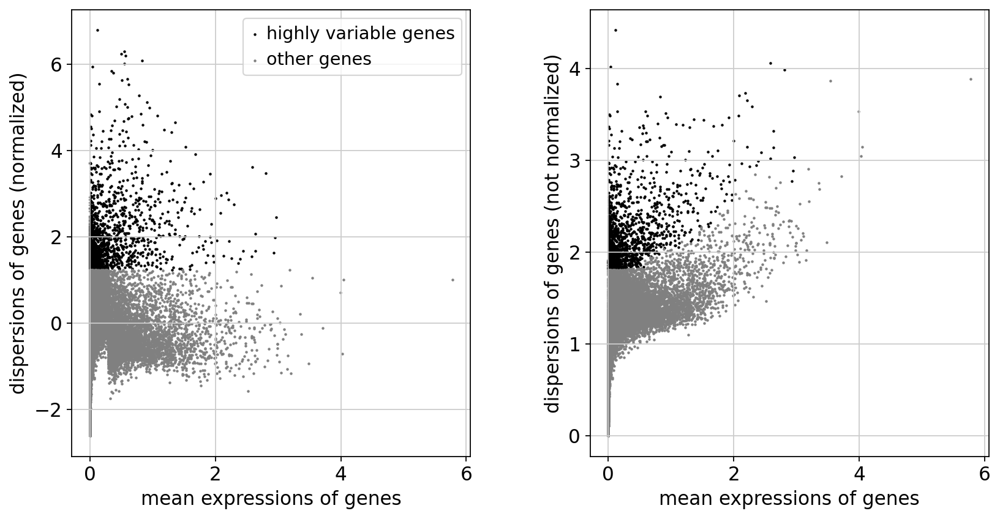

In [173]:
# Crea un gráfico de los genes altamente variables
sc.pl.highly_variable_genes(adata5)

In [174]:
# Mantiene solo los genes altamente variables en los datos para los siguientes análisis
adata5 = adata5[:, adata5.var.highly_variable]

-------
c) **sc.pp.regress_out**: Eliminar (en su mayoría) las fuentes de variación no deseadas mediante regresión lineal simple.

`sc.pp.regress_out(adata`[La matriz de datos anotada], ['total_counts', 'pct_counts_mt'])

- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

In [175]:
# Reajusta los efectos de covariables como el número total de conteos y el porcentaje de genes mitocondriales
sc.pp.regress_out(adata5, ['total_counts', 'pct_counts_mt'])

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


------
d) **sc.pp.scale**: Escala datos a varianza unitaria y media cero.

`sc.pp.scale(adata`[Matriz de datos (anotada) de forma n_obs× n_vars. Las filas corresponden a las células y las columnas a los genes], `max_value`[Recortar (truncar) a este valor después de escalar]`=10)`

In [176]:
# Escala los datos para que cada gen tenga media 0 y varianza 1, con un valor máximo de 10
sc.pp.scale(adata5, max_value=10)

------
e) **sc.tl.pca**: Análisis de Componentes Principales (PCA) que calcula coordenadas de PCA, cargas y descomposición de varianza.

`sc.tl.pca(adata`[Matriz de datos (anotada) de forma n_obs× n_vars donde las filas corresponden a las células y las columnas a los genes], `svd_solver`[Solucionador SVD a utilizar]`='arpack')`

In [177]:
# Realiza análisis de componentes principales (PCA) para reducir la dimensionalidad de los datos
sc.tl.pca(adata5, svd_solver='arpack')

-------
f) **sc.pl.pca_variance_ratio**: Grafica la razón de varianza.

`sc.pl.pca_variance_ratio(adata`[Matriz de datos anotada], `log`[Trazar en escala logarítmica]`=True, n_pcs`[Número de PC a mostrar, por defecto es igual a 30 pero varía] `= 50)`

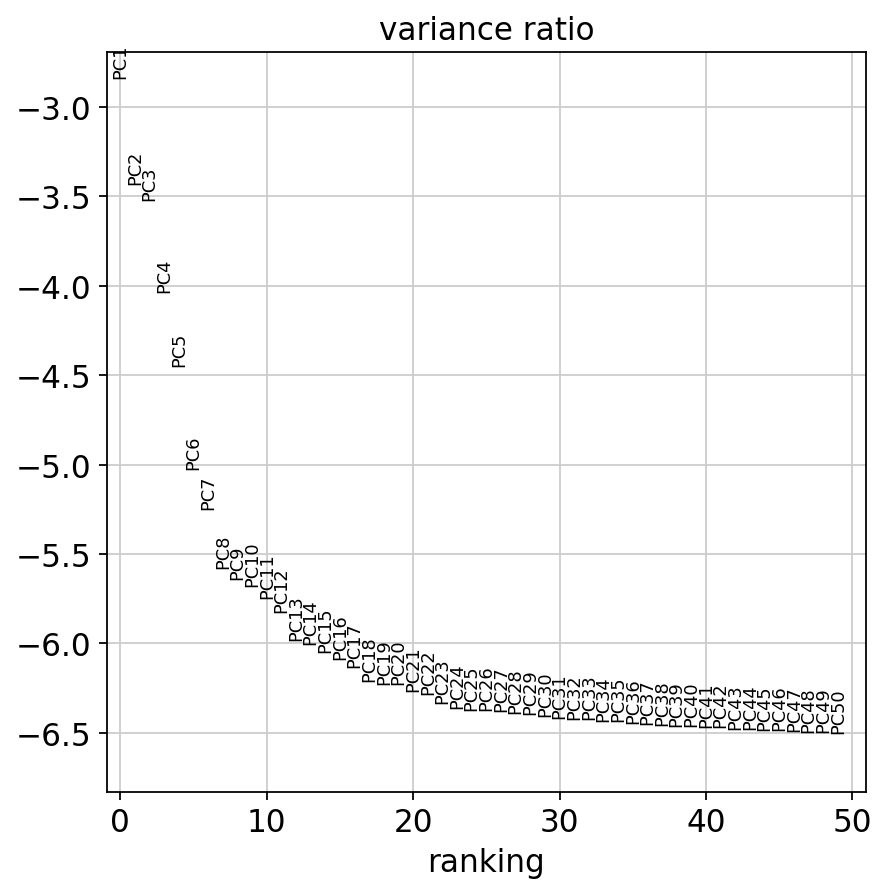

In [178]:
# Muestra un gráfico de la varianza explicada por los componentes principales (logaritmo)
sc.pl.pca_variance_ratio(adata5, log=True, n_pcs = 50)

-------
g) **sc.pp.neighbors**: Calcula la matriz de distancia de los vecinos más cercanos y un gráfico de vecindad de observaciones.\
La eficiencia de búsqueda de vecinos de esto depende en gran medida de UMAP (Aproximación y proyección de colector uniforme) que también proporciona un método para estimar las conectividades de los puntos de datos: la conectividad de la variedad.

`sc.pp.neighbors(adata`[Matriz de datos anotada], `n_pcs`[Utiliza la cantidad de PC] `= 30)`

In [179]:
# Calcula la matriz de vecinos más cercanos para las células usando los primeros 30 componentes principales
sc.pp.neighbors(adata5, n_pcs = 30)

---------
h) **sc.tl.umap**: Incrustra el gráfico de vecindad usando UMAP (Aproximación y proyección de colector uniforme) para visualizar datos de alta dimensión. Optimiza la incrustación de modo que refleje mejor la topología de los datos.

`sc.tl.umap(adata`[Matriz de datos anotada])

i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada])

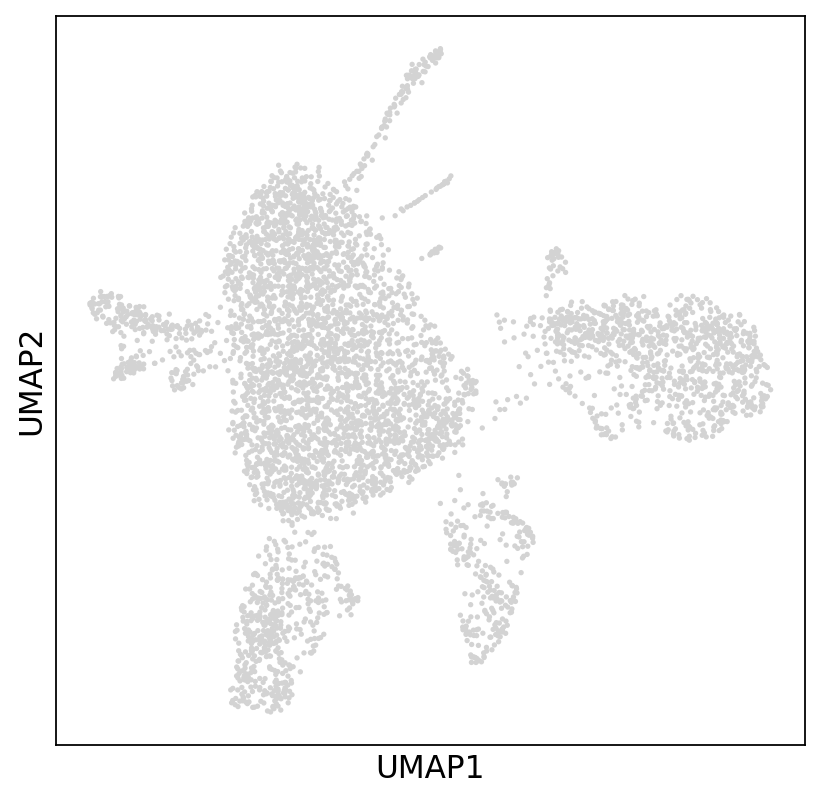

In [180]:
# Realiza una proyección de UMAP (técnica de reducción de dimensionalidad)
sc.tl.umap(adata5) # UMAP: visualizar datos de alta dimensión
# Crea un gráfico de UMAP para visualizar las células en el espacio reducido
sc.pl.umap(adata5)

--------
3. **Leiden**

Leiden comienza construyendo un "gráfico de vecinos", donde cada nodo representa una célula y los bordes representan conexiones entre células en función de su similitud (que a menudo se mide utilizando los k vecinos más cercanos u otras métricas de distancia). Luego, el algoritmo aplica un proceso llamado "detección de comunidad" para identificar grupos de células estrechamente relacionadas dentro del gráfico.

**Pasos clave**:

- **Particionado de nodos**: Leiden asigna células (nodos) a los grupos iniciales, lo que crea una partición del gráfico.
- **Refinamiento de nodos**: el algoritmo refina la partición evaluando la modularidad (una medida de la solidez de los clústeres) y moviendo los nodos para mejorar la modularidad.
- **Optimización de clústeres**: Leiden continúa refinando los clústeres hasta que no se puedan realizar más mejoras.
  
**Resultado final**: conjunto de clústeres que representan grupos distintos de células, que se pueden utilizar para análisis posteriores como visualización, expresión diferencial o anotación de tipo de célula.

-----
a) **sc.tl.leiden**: Agrupa células en subgrupos.

`sc.tl.leiden(adata`[La matriz de datos anotada], `resolution`[Un valor de parámetro que controla la tosquedad de la agrupación donde los valores más altos generan más agrupaciones] `= 1)`

In [181]:
# Realiza un clustering de las células utilizando el algoritmo Leiden con una resolución de 1
sc.tl.leiden(adata5, resolution = 1) # Por defecto la resolución es 1

In [182]:
# Muestra las observaciones (células) con las etiquetas del clustering Leiden
adata5.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGATAGTCA-1,2716,6234.0,10.0,0.160411,2
AAACCCAAGGTAGACC-1,3519,9726.0,8.0,0.082254,7
AAACCCAGTTCTGACA-1,2352,4996.0,6.0,0.120096,0
AAACCCATCTTTCCGG-1,1484,2534.0,7.0,0.276243,0
AAACGAAAGCCGTTAT-1,2984,7212.0,6.0,0.083195,3
...,...,...,...,...,...
TTTGTTGGTACGACAG-1,3058,8156.0,6.0,0.073565,8
TTTGTTGGTACGACTT-1,1120,1496.0,11.0,0.735294,5
TTTGTTGGTCTCGGGT-1,2941,7562.0,6.0,0.079344,2
TTTGTTGTCAGAACCT-1,3308,9795.0,10.0,0.102093,4


------
i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada], `color`[Claves para anotaciones de observaciones/células o variables/genes] `=['leiden'])`

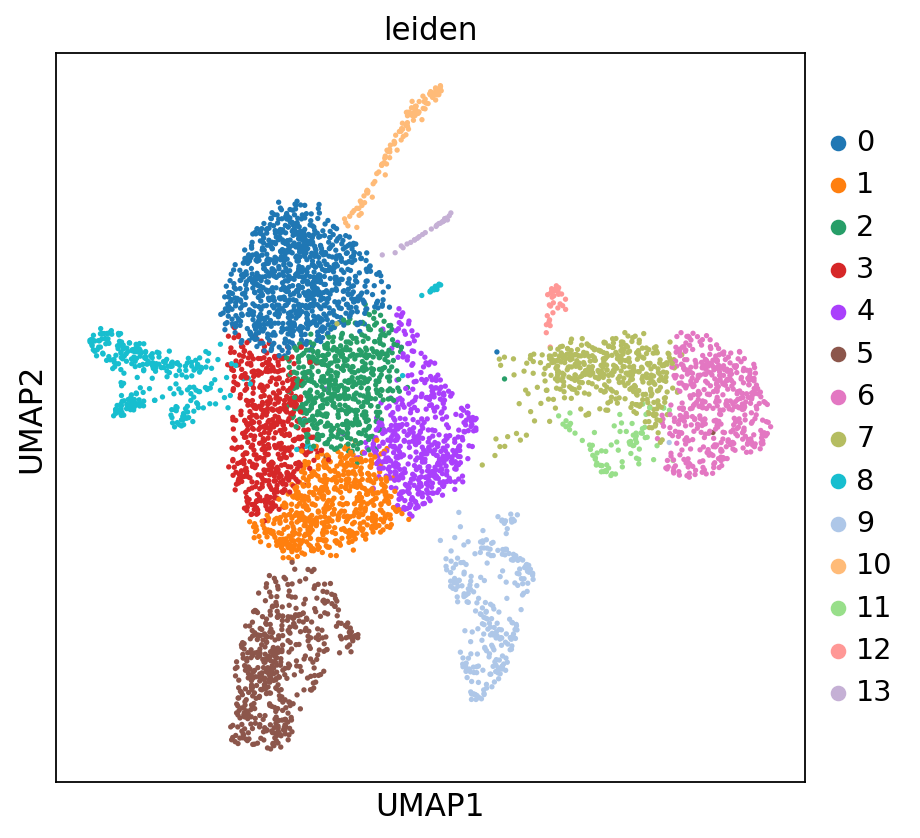

In [183]:
# Crea un gráfico UMAP coloreado por las etiquetas de los clusters Leiden
# Diagrama de dispersión en base UMAP.
sc.pl.umap(adata5, color=['leiden'])

------
## <span style="color:darkseagreen">Muestra 6:**HB53_tumor_filtered_feature_bc_matrix**</span>

In [184]:
# Cambiar al directorio deseado
os.chdir('/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB53_tumor_filtered_feature_bc_matrix')

# Verificar el cambio de directorio y listar el contenido
print("Directorio actual:", os.getcwd())
print("Contenido del directorio:", os.listdir('.'))

Directorio actual: /home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB53_tumor_filtered_feature_bc_matrix
Contenido del directorio: ['cache', 'barcodes.tsv.gz', 'features.tsv.gz', 'matrix.mtx.gz']


In [185]:
pwd

'/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB53_tumor_filtered_feature_bc_matrix'

In [186]:
adata6 = sc.read_10x_mtx( # Lee los datos de la matriz en formato 10X
    "/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB53_tumor_filtered_feature_bc_matrix",  # Ruta al directorio que contiene matrix.mtx.gz, features.tsv.gz y barcodes.tsv.gz 
    var_names='gene_symbols',  # Configura los nombres de las variables como los símbolos de los genes
    cache=True # Guarda los datos en caché para acelerar futuras cargas
)

# Muestra un resumen de los datos cargados
adata6

AnnData object with n_obs × n_vars = 12832 × 33538
    var: 'gene_ids', 'feature_types'

## 1. Control de calidad
--------------------

### Preprocesamiento básico
-----------
1. Eliminación de células con alto contenido mitocondrial.\
   Niveles elevados de ARN mitocondrial pueden indicar células estresadas o moribundas. Para ello, se establece un umbral máximo para la expresión de genes mitocondriales (valor máximo: 20%)

In [187]:
# Crea una nueva columna 'mt' en la variable que contiene los genes, 
# indica cuáles genes pertenecen al ADN mitocondrial
adata6.var['mt'] = adata6.var.index.str.startswith('MT-')

In [188]:
# Muestra las variables del objeto 'adata', que incluye información sobre los genes
adata6.var

,gene_ids,feature_types,mt
MIR1302-2HG,ENSG00000243485,Gene Expression,False
FAM138A,ENSG00000237613,Gene Expression,False
OR4F5,ENSG00000186092,Gene Expression,False
AL627309.1,ENSG00000238009,Gene Expression,False
AL627309.3,ENSG00000239945,Gene Expression,False
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,False
AC233755.1,ENSG00000275063,Gene Expression,False
AC240274.1,ENSG00000271254,Gene Expression,False
AC213203.1,ENSG00000277475,Gene Expression,False


------------
a) **pp.calculate_qc_metrics**: cálculo de métricas de control de calidad.\
parámetros utilizados:\
`sc.pp.calculate_qc_metrics(adata`[Matriz de datos anotada], `qc_vars`[Tipo de cosa que son las variables, aquí son genes mitocondriales], `percent_top`[Lista de rangos de la porción acumulada de expresión como un porcentaje, aquí no se calculan], `log1p`[Transformadas], `inplace`[Para colocar métricas calculadas])

In [189]:
# Calcula métricas de control de calidad (QC), como el porcentaje de genes mitocondriales
sc.pp.calculate_qc_metrics(adata6, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [190]:
# Ordena las variables (genes) de acuerdo al número de células en las que están presentes
adata6.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
POM121L12,ENSG00000221900,Gene Expression,False,0,0.000000,100.000000,0.0
HPVC1,ENSG00000280920,Gene Expression,False,0,0.000000,100.000000,0.0
AL589702.1,ENSG00000284745,Gene Expression,False,0,0.000000,100.000000,0.0
ACTRT2,ENSG00000169717,Gene Expression,False,0,0.000000,100.000000,0.0
AL136528.2,ENSG00000235131,Gene Expression,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...
APOA2,ENSG00000158874,Gene Expression,False,12819,17.426746,0.101309,223620.0
APOB,ENSG00000084674,Gene Expression,False,12823,23.467581,0.070137,301136.0
FTL,ENSG00000087086,Gene Expression,False,12831,60.755455,0.007793,779614.0
ALB,ENSG00000163631,Gene Expression,False,12832,64.100372,0.000000,822536.0


------------------
2. **Filtrado de células con bajo recuento de genes**\
Aquellas que expresan una menor cantidad de genes únicos pueden ser poco informativas o pueden mostrar un error técnico.\
-> Aplicamos un umbral mínimo para excluir las células de baja calidad.

a) **sc.pp.filter_genes**: filtra genes según sea el número de células o recuentos.

`sc.pp.filter_genes(adata`[Matriz de datos anotada de forma n_obs× n_vars, donde las filas corresponden a las células y las columnas a los genes], `min_cells`[Número mínimo de células expresadas necesarias para que un gen pase el filtrado]`=3)`

In [191]:
# Filtra los genes que están presentes en menos de 3 células
sc.pp.filter_genes(adata6, min_cells=3)

In [192]:
# Ordena nuevamente las variables para ver los genes después del filtrado
adata6.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
TFAP2B,ENSG00000008196,Gene Expression,False,3,0.000312,99.976621,4.0,3
LINC00945,ENSG00000232539,Gene Expression,False,3,0.000234,99.976621,3.0,3
AP000289.1,ENSG00000226527,Gene Expression,False,3,0.000234,99.976621,3.0,3
AC069235.1,ENSG00000255998,Gene Expression,False,3,0.000234,99.976621,3.0,3
AL391845.2,ENSG00000233542,Gene Expression,False,3,0.000234,99.976621,3.0,3
...,...,...,...,...,...,...,...,...
APOA2,ENSG00000158874,Gene Expression,False,12819,17.426746,0.101309,223620.0,12819
APOB,ENSG00000084674,Gene Expression,False,12823,23.467581,0.070137,301136.0,12823
FTL,ENSG00000087086,Gene Expression,False,12831,60.755455,0.007793,779614.0,12831
MALAT1,ENSG00000251562,Gene Expression,False,12832,377.115417,0.000000,4839145.0,12832


---------
b) **sc.pl.violin**: Trama de violín.\
`sc.pl.violin(adata`[Matriz de datos anotada], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             `jitter`[Agrega fluctuación al diagrama de bandas (solo cuando el diagrama de bandas es Verdadero)]`=0.4, multi_panel`[Muestra teclas en varios paneles]`=True)`

- “n_cells_by_counts”: Número de celdas en las que se mide esta expresión.
- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

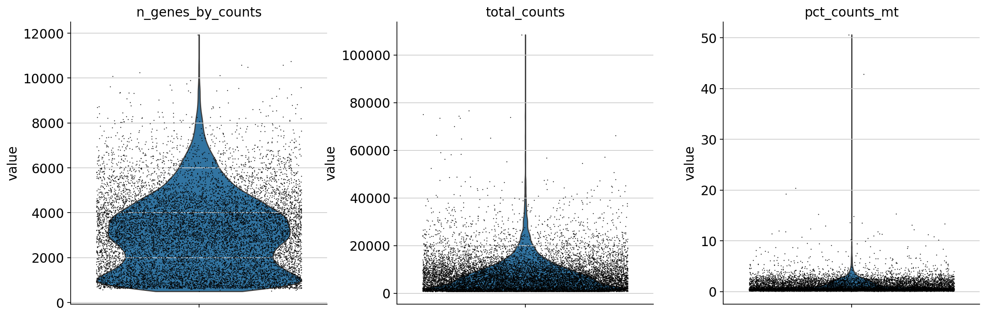

In [193]:
# Crea gráficos de violín para observar la distribución de métricas como el número de genes, el conteo total, 
# y el porcentaje de genes mitocondriales (indicador de calidad de la célula)
sc.pl.violin(adata6, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

---------
3. **Identificación y evalucación de células atípicas con expresión génica inusualmente alta o baja, así como otras características extremas**: Estas células atípicas pueden ser resultado de problemas técnicos o representar tipos de células poco comunes.

-> Uso de métodos estadísticos para determinar su inclusión o eliminación en el análisis.

a) **np.quantile**: Calcula el cuartil q-ésimo de los datos a lo largo del eje especificado.

`np.quantile(adata.obs.n_genes_by_counts.values, .98)`

In [194]:
# Calcula el límite superior del número de genes por célula (percentil 98)
upper_lim_genes = np.quantile(adata6.obs.n_genes_by_counts.values, .98)
# Muestra el valor calculado del límite superior de genes por célula
upper_lim_genes

6978.759999999998

In [195]:
# Filtra las células que tienen un número de genes por debajo del límite superior calculado
adata6 = adata6[adata6.obs.n_genes_by_counts < upper_lim_genes]

In [196]:
# Calcula el límite superior de los conteos totales por célula (percentil 98)
upper_lim_counts = np.quantile(adata6.obs.total_counts.values, .98)
# Muestra el valor calculado del límite superior de conteos totales por célula
upper_lim_counts

22968.44000000001

In [197]:
# Filtra las células que tienen un total de conteos menor a  10,000
adata6 = adata6[adata6.obs.total_counts < 10000]

In [198]:
# Filtra las células que tienen menos del 20% de genes mitocondriales
adata6 = adata6[adata6.obs.pct_counts_mt < 20]

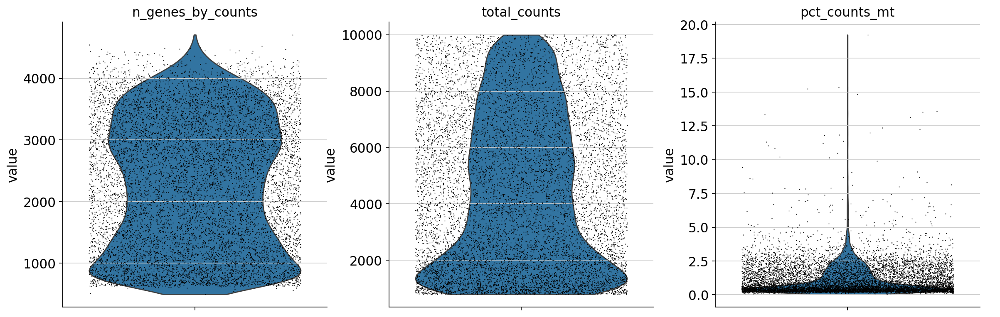

In [199]:
# Crea gráficos de violín nuevamente después del filtrado para comparar las métricas
sc.pl.violin(adata6, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

In [200]:
# Muestra información actualizada del objeto 'adata' después del filtrado
adata6

View of AnnData object with n_obs × n_vars = 9452 × 26845
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

-------
## 2. Normalización

La normalización nos permite ajustar la variabilidad de los datos que surge de las diferencias en la profundidad de secuenciación, el tamaño de las células así como otros factores técnicos. 

-> Aquí se garantiza que las diferencias observadas entre las células se deban a la variación biológica y no a problemas técnicos.

La normalización de recuento total implica escalar los recuentos brutos de cada célula por los recuentos totales de esa célula, seguido de una transformación logarítmica para estabilizar los datos. El logaritmo desplazado resulta beneficioso para estabilizar la varianza para la posterior reducción de la dimensionalidad y la identificación de genes expresados de forma diferencial.

In [201]:
# Suma los valores de la matriz de expresión a lo largo de las células (para cada célula)
adata6.X.sum(axis = 1)

matrix([[2097.],
        [1059.],
        [2728.],
        ...,
        [8629.],
        [2409.],
        [5711.]], dtype=float32)

-------
1. **Escalado por recuentos totales** :Aquí se ajustan los recuentos de cada célula para considerar las diferencias en la profundidad de secuenciación o en el continido total de ARN. Comunmente se escalan los recuentos por un factor constante, normalmente 10 000 ("recuentos por diez mil" o CPTT). 

-> Crea una línea de base común para todas las células.

a) **sc.pp.normalize_total**: Normaliza los recuentos por celda.

`sc.pp.normalize_total(adata`[Matriz de datos anotada como n_obs x n_vars donde las filas corresponden a las células y las columnas corresponden a los genes], `target_sum`[cada observación (celda) tiene un recuento total igual a la mediana de los recuentos totales de las observaciones (celdas) antes de la normalización]`=1e4)`

In [202]:
# Normaliza los datos de expresión para que el total por célula sea igual a 10,000
sc.pp.normalize_total(adata6, target_sum=1e4) # normaliza cada celda a 10.000 UMI

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [203]:
# Verifica nuevamente la suma de la matriz de expresión para cada célula después de la normalización
adata6.X.sum(axis = 1)

matrix([[ 9999.903],
        [10000.043],
        [ 9999.986],
        ...,
        [10000.005],
        [ 9999.959],
        [ 9999.886]], dtype=float32)

--------
2. **Transformación logarítmica**

Scanpy aplica una transformación logarítmica a los recuentos escalados, la cual nos ayuda a estabilizar la varianza para que los datos sean menos sensibles a los valores extremos y de este modo pueda facilitar el análisis posterior.

In [204]:
# Aplica la transformación logarítmica a los datos (logaritmo natural)
sc.pp.log1p(adata6)

In [205]:
# Verifica la suma de la matriz de expresión después de la transformación logarítmica
adata6.X.sum(axis = 1)

matrix([[2731.0608],
        [2002.0402],
        [2974.5305],
        ...,
        [3870.7043],
        [2952.6106],
        [3640.0674]], dtype=float32)

In [206]:
# Almacena una copia de los datos sin procesar en 'adata.raw' para futuras referencias
adata6.raw = adata6

## 3. Clustering

**Objetivo**: explorar la diversidad celular e identificar tipos o estados celulares únicos. 

Este agrupamiento nos permite categorizar las células en función de sus perfiles de expresión genética y nos da información sobre la composición de una muestra.

Los datos de células individuales suelen tener miles de genes, lo que los hace altamente dimensionales. Antes del agrupamiento, se usan técnicas de reducción de dimensionalidad PCA (Análisis de componentes principales) y UMAP (Aproximación y proyección de colector uniforme) para reducir los datos a un espacio de menor dimensión. En este caso, se utiliza un agrupamiento basado en gráficos, el cual organiza las células en grupos en función de su conectividad en una estructura gráfica. 

**Algoritmo de Leiden**: es un método de agrupamiento basado en gráficos conocido por su eficiencia, precisión y solidez. Se usa ampliamente en el análisis de células individuales debido a su capacidad para encontrar grupos bien definidos en conjuntos de datos complejos.

-------
a) **sc.pp.highly_variable_genes**: Anota genes que son altamente variables.

`sc.pp.highly_variable_genes(adata`[Matriz de datos anotada por n_obs x n_var, donde las filas corresponden al número de células y las columnas correspondel al número de genes], `n_top_genes`[Número de genes altamente variables que se deben conservar] `= 2000)`

In [207]:
# Identificación de genes altamente variables
sc.pp.highly_variable_genes(adata6, n_top_genes = 2000)

In [208]:
# Muestra la información sobre los genes, incluyendo cuáles son altamente variables
adata6.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,False,548,0.045200,95.729426,580.0,548,False,0.047190,1.163860,-0.422940
AL627309.2,ENSG00000239906,Gene Expression,False,11,0.000857,99.914277,11.0,11,False,0.000585,0.623217,-1.681424
AC114498.1,ENSG00000235146,Gene Expression,False,25,0.001948,99.805175,25.0,25,False,0.003039,1.547658,0.470446
AL669831.2,ENSG00000229905,Gene Expression,False,13,0.001013,99.898691,13.0,13,False,0.001032,0.368218,-2.274998
AL669831.5,ENSG00000237491,Gene Expression,False,2933,0.317020,77.143080,4068.0,2933,False,0.293273,1.245398,-0.233141
...,...,...,...,...,...,...,...,...,...,...,...,...
AC007325.4,ENSG00000278817,Gene Expression,False,89,0.006936,99.306421,89.0,89,False,0.012372,1.608535,0.612154
AC007325.2,ENSG00000277196,Gene Expression,False,10,0.000779,99.922070,10.0,10,False,0.000527,0.251813,-2.545959
AL354822.1,ENSG00000278384,Gene Expression,False,828,0.071228,93.547382,914.0,828,False,0.062217,1.143203,-0.471024
AC004556.1,ENSG00000276345,Gene Expression,False,17,0.001325,99.867519,17.0,17,True,0.003270,1.892130,1.272292


-------
b) **#sc.pl.highly_variable_genes(adata)**: Grafica dispersiones o varianza normalizada vs medias para los genes.

`sc.pl.highly_variable_genes(adata`[Muestra el resultado de "highly_variable_genes"])

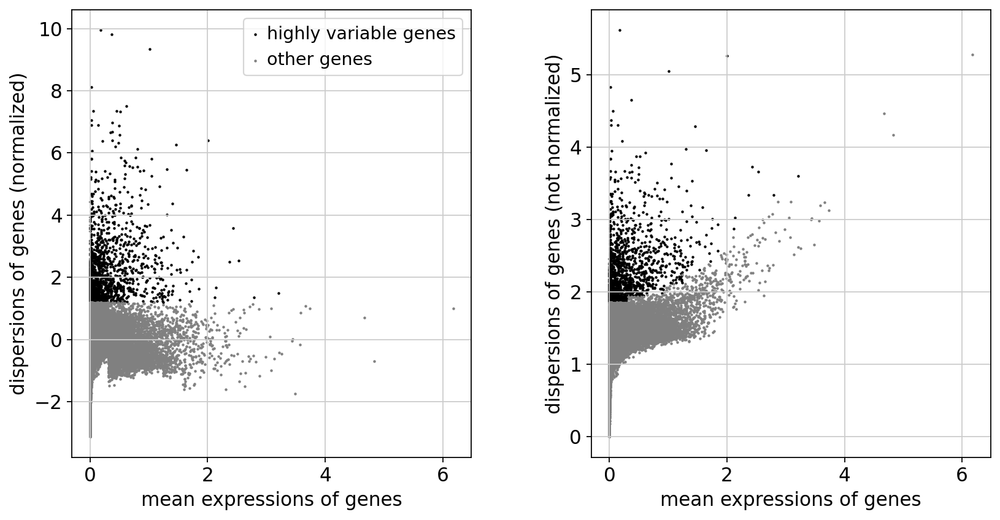

In [209]:
# Crea un gráfico de los genes altamente variables
sc.pl.highly_variable_genes(adata6)

In [210]:
# Mantiene solo los genes altamente variables en los datos para los siguientes análisis
adata6 = adata6[:, adata6.var.highly_variable]

-------
c) **sc.pp.regress_out**: Eliminar (en su mayoría) las fuentes de variación no deseadas mediante regresión lineal simple.

`sc.pp.regress_out(adata`[La matriz de datos anotada], ['total_counts', 'pct_counts_mt'])

- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

In [211]:
# Reajusta los efectos de covariables como el número total de conteos y el porcentaje de genes mitocondriales
sc.pp.regress_out(adata6, ['total_counts', 'pct_counts_mt'])

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


------
d) **sc.pp.scale**: Escala datos a varianza unitaria y media cero.

`sc.pp.scale(adata`[Matriz de datos (anotada) de forma n_obs× n_vars. Las filas corresponden a las células y las columnas a los genes], `max_value`[Recortar (truncar) a este valor después de escalar]`=10)`

In [212]:
# Escala los datos para que cada gen tenga media 0 y varianza 1, con un valor máximo de 10
sc.pp.scale(adata6, max_value=10)

------
e) **sc.tl.pca**: Análisis de Componentes Principales (PCA) que calcula coordenadas de PCA, cargas y descomposición de varianza.

`sc.tl.pca(adata`[Matriz de datos (anotada) de forma n_obs× n_vars donde las filas corresponden a las células y las columnas a los genes], `svd_solver`[Solucionador SVD a utilizar]`='arpack')`

In [213]:
# Realiza análisis de componentes principales (PCA) para reducir la dimensionalidad de los datos
sc.tl.pca(adata6, svd_solver='arpack')

-------
f) **sc.pl.pca_variance_ratio**: Grafica la razón de varianza.

`sc.pl.pca_variance_ratio(adata`[Matriz de datos anotada], `log`[Trazar en escala logarítmica]`=True, n_pcs`[Número de PC a mostrar, por defecto es igual a 30 pero varía] `= 50)`

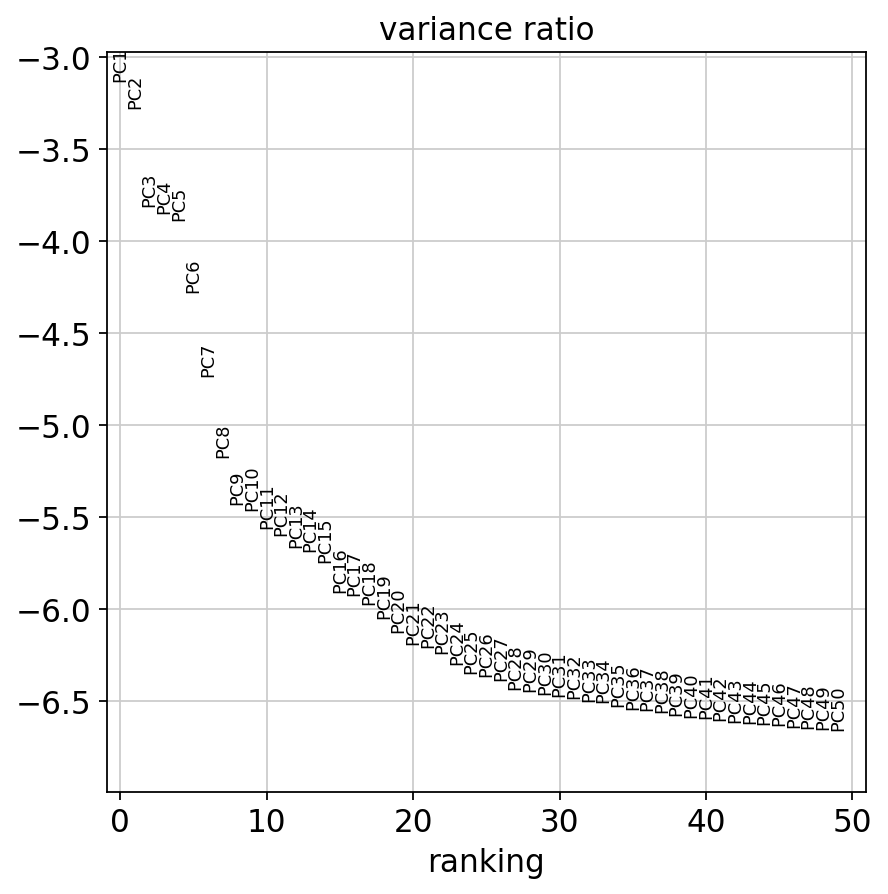

In [214]:
# Muestra un gráfico de la varianza explicada por los componentes principales (logaritmo)
sc.pl.pca_variance_ratio(adata6, log=True, n_pcs = 50)

-------
g) **sc.pp.neighbors**: Calcula la matriz de distancia de los vecinos más cercanos y un gráfico de vecindad de observaciones.\
La eficiencia de búsqueda de vecinos de esto depende en gran medida de UMAP (Aproximación y proyección de colector uniforme) que también proporciona un método para estimar las conectividades de los puntos de datos: la conectividad de la variedad.

`sc.pp.neighbors(adata`[Matriz de datos anotada], `n_pcs`[Utiliza la cantidad de PC] `= 30)`

In [215]:
# Calcula la matriz de vecinos más cercanos para las células usando los primeros 30 componentes principales
sc.pp.neighbors(adata6, n_pcs = 30)

---------
h) **sc.tl.umap**: Incrustra el gráfico de vecindad usando UMAP (Aproximación y proyección de colector uniforme) para visualizar datos de alta dimensión. Optimiza la incrustación de modo que refleje mejor la topología de los datos.

`sc.tl.umap(adata`[Matriz de datos anotada])

i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada])

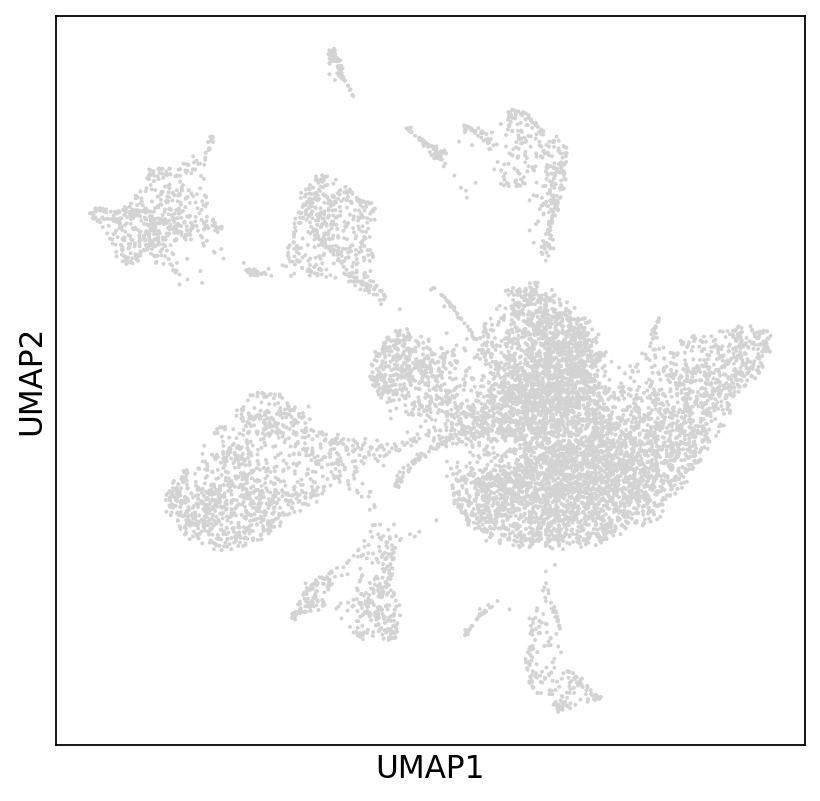

In [216]:
# Realiza una proyección de UMAP (técnica de reducción de dimensionalidad)
sc.tl.umap(adata6) # UMAP: visualizar datos de alta dimensión
# Crea un gráfico de UMAP para visualizar las células en el espacio reducido
sc.pl.umap(adata6)

--------
3. **Leiden**

Leiden comienza construyendo un "gráfico de vecinos", donde cada nodo representa una célula y los bordes representan conexiones entre células en función de su similitud (que a menudo se mide utilizando los k vecinos más cercanos u otras métricas de distancia). Luego, el algoritmo aplica un proceso llamado "detección de comunidad" para identificar grupos de células estrechamente relacionadas dentro del gráfico.

**Pasos clave**:

- **Particionado de nodos**: Leiden asigna células (nodos) a los grupos iniciales, lo que crea una partición del gráfico.
- **Refinamiento de nodos**: el algoritmo refina la partición evaluando la modularidad (una medida de la solidez de los clústeres) y moviendo los nodos para mejorar la modularidad.
- **Optimización de clústeres**: Leiden continúa refinando los clústeres hasta que no se puedan realizar más mejoras.
  
**Resultado final**: conjunto de clústeres que representan grupos distintos de células, que se pueden utilizar para análisis posteriores como visualización, expresión diferencial o anotación de tipo de célula.

-----
a) **sc.tl.leiden**: Agrupa células en subgrupos.

`sc.tl.leiden(adata`[La matriz de datos anotada], `resolution`[Un valor de parámetro que controla la tosquedad de la agrupación donde los valores más altos generan más agrupaciones] `= 1)`

In [217]:
# Realiza un clustering de las células utilizando el algoritmo Leiden con una resolución de 1
sc.tl.leiden(adata6, resolution = 1) # Por defecto la resolución es 1

In [218]:
# Muestra las observaciones (células) con las etiquetas del clustering Leiden
adata6.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGACCGCCT-1,1419,2097.0,42.0,2.002861,0
AAACCCAAGAGGCGGA-1,808,1059.0,27.0,2.549575,2
AAACCCAAGCAGCCTC-1,1700,2728.0,24.0,0.879765,0
AAACCCAAGCCGTTAT-1,3399,8240.0,21.0,0.254854,11
AAACCCAAGGACGGAG-1,3446,8873.0,163.0,1.837034,3
...,...,...,...,...,...
TTTGTTGGTACGCTAT-1,816,1134.0,47.0,4.144621,5
TTTGTTGGTGCTTATG-1,2952,5172.0,13.0,0.251353,7
TTTGTTGGTGGACTGA-1,3425,8629.0,20.0,0.231777,1
TTTGTTGGTTCATCTT-1,1602,2409.0,16.0,0.664176,4


------
i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada], `color`[Claves para anotaciones de observaciones/células o variables/genes] `=['leiden'])`

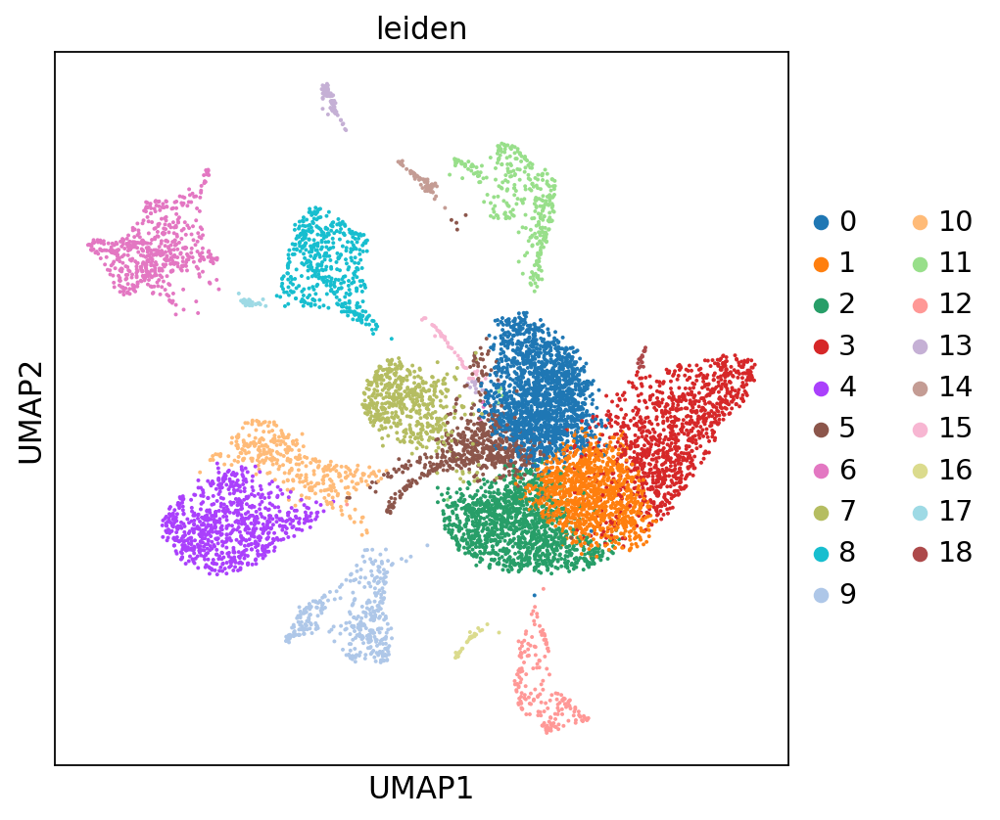

In [219]:
# Crea un gráfico UMAP coloreado por las etiquetas de los clusters Leiden
# Diagrama de dispersión en base UMAP.
sc.pl.umap(adata6, color=['leiden'])

------
## <span style="color:darkseagreen">Muestra 7:**HB17_background_filtered_feature_bc_matrix**</span>

In [220]:
# Cambiar al directorio deseado
os.chdir('/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_background_filtered_feature_bc_matrix')

# Verificar el cambio de directorio y listar el contenido
print("Directorio actual:", os.getcwd())
print("Contenido del directorio:", os.listdir('.'))

Directorio actual: /home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_background_filtered_feature_bc_matrix
Contenido del directorio: ['barcodes.tsv.gz', 'features.tsv.gz', 'matrix.mtx.gz']


In [221]:
pwd

'/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_background_filtered_feature_bc_matrix'

In [222]:
adata7 = sc.read_10x_mtx( # Lee los datos de la matriz en formato 10X
    "/home/mcgonzalez/Servicio_Social/Data/HB_filtered/HB17_background_filtered_feature_bc_matrix",  # Ruta al directorio que contiene matrix.mtx.gz, features.tsv.gz y barcodes.tsv.gz 
    var_names='gene_symbols',  # Configura los nombres de las variables como los símbolos de los genes
    cache=True # Guarda los datos en caché para acelerar futuras cargas
)

# Muestra un resumen de los datos cargados
adata7

AnnData object with n_obs × n_vars = 11197 × 33538
    var: 'gene_ids', 'feature_types'

## 1. Control de calidad
--------------------

### Preprocesamiento básico
-----------
1. Eliminación de células con alto contenido mitocondrial.\
   Niveles elevados de ARN mitocondrial pueden indicar células estresadas o moribundas. Para ello, se establece un umbral máximo para la expresión de genes mitocondriales (valor máximo: 20%)

In [223]:
# Crea una nueva columna 'mt' en la variable que contiene los genes, 
# indica cuáles genes pertenecen al ADN mitocondrial
adata7.var['mt'] = adata7.var.index.str.startswith('MT-')

In [224]:
# Muestra las variables del objeto 'adata', que incluye información sobre los genes
adata7.var

,gene_ids,feature_types,mt
MIR1302-2HG,ENSG00000243485,Gene Expression,False
FAM138A,ENSG00000237613,Gene Expression,False
OR4F5,ENSG00000186092,Gene Expression,False
AL627309.1,ENSG00000238009,Gene Expression,False
AL627309.3,ENSG00000239945,Gene Expression,False
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,False
AC233755.1,ENSG00000275063,Gene Expression,False
AC240274.1,ENSG00000271254,Gene Expression,False
AC213203.1,ENSG00000277475,Gene Expression,False


------------
a) **pp.calculate_qc_metrics**: cálculo de métricas de control de calidad.\
parámetros utilizados:\
`sc.pp.calculate_qc_metrics(adata`[Matriz de datos anotada], `qc_vars`[Tipo de cosa que son las variables, aquí son genes mitocondriales], `percent_top`[Lista de rangos de la porción acumulada de expresión como un porcentaje, aquí no se calculan], `log1p`[Transformadas], `inplace`[Para colocar métricas calculadas])

In [225]:
# Calcula métricas de control de calidad (QC), como el porcentaje de genes mitocondriales
sc.pp.calculate_qc_metrics(adata7, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [226]:
# Ordena las variables (genes) de acuerdo al número de células en las que están presentes
adata7.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AC022447.1,ENSG00000248378,Gene Expression,False,0,0.000000,100.000000,0.0
LINC00561,ENSG00000261206,Gene Expression,False,0,0.000000,100.000000,0.0
LINC01034,ENSG00000224933,Gene Expression,False,0,0.000000,100.000000,0.0
AL365394.1,ENSG00000284809,Gene Expression,False,0,0.000000,100.000000,0.0
AC000403.1,ENSG00000278727,Gene Expression,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...,...
MT-CO3,ENSG00000198938,Gene Expression,True,11196,61.589802,0.008931,689621.0
ALB,ENSG00000163631,Gene Expression,False,11197,304.420380,0.000000,3408595.0
SERPINA1,ENSG00000197249,Gene Expression,False,11197,96.951683,0.000000,1085568.0
MT-ND4,ENSG00000198886,Gene Expression,True,11197,82.440567,0.000000,923087.0


------------------
2. **Filtrado de células con bajo recuento de genes**\
Aquellas que expresan una menor cantidad de genes únicos pueden ser poco informativas o pueden mostrar un error técnico.\
-> Aplicamos un umbral mínimo para excluir las células de baja calidad.

a) **sc.pp.filter_genes**: filtra genes según sea el número de células o recuentos.

`sc.pp.filter_genes(adata`[Matriz de datos anotada de forma n_obs× n_vars, donde las filas corresponden a las células y las columnas a los genes], `min_cells`[Número mínimo de células expresadas necesarias para que un gen pase el filtrado]`=3)`

In [227]:
# Filtra los genes que están presentes en menos de 3 células
sc.pp.filter_genes(adata7, min_cells=3)

In [228]:
# Ordena nuevamente las variables para ver los genes después del filtrado
adata6.var.sort_values('n_cells_by_counts')

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std
AC010975.1,ENSG00000229385,Gene Expression,False,3,0.000234,99.976621,3.0,3,True,0.001236,2.028024,1.588620,1.057132e-19,0.026597
AC114284.1,ENSG00000248927,Gene Expression,False,3,0.000234,99.976621,3.0,3,True,0.001145,2.059663,1.662266,2.466640e-19,0.025964
AC104758.4,ENSG00000261244,Gene Expression,False,3,0.000234,99.976621,3.0,3,True,0.001123,2.106824,1.772046,3.112665e-19,0.025525
UGT2A1,ENSG00000173610,Gene Expression,False,3,0.000234,99.976621,3.0,3,True,0.001251,2.301400,2.224972,2.819017e-19,0.026392
C11orf44,ENSG00000175728,Gene Expression,False,3,0.000390,99.976621,5.0,3,True,0.001528,2.670754,3.084736,7.047544e-20,0.028157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DENND4A,ENSG00000174485,Gene Expression,False,9562,4.066163,25.483167,52177.0,9562,True,1.721455,2.427465,1.243127,1.010712e-15,0.949345
PLCB1,ENSG00000182621,Gene Expression,False,10186,9.743298,20.620324,125026.0,10186,True,2.428544,3.731630,3.576888,6.735572e-16,1.182945
ROBO1,ENSG00000169855,Gene Expression,False,10742,12.112142,16.287406,155423.0,10742,True,2.531980,3.665221,2.532850,9.798905e-16,1.127728
CPS1,ENSG00000021826,Gene Expression,False,11439,14.404302,10.855673,184836.0,11439,True,2.791847,3.342710,1.358064,4.811123e-16,1.200564


---------
b) **sc.pl.violin**: Trama de violín.\
`sc.pl.violin(adata`[Matriz de datos anotada], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             `jitter`[Agrega fluctuación al diagrama de bandas (solo cuando el diagrama de bandas es Verdadero)]`=0.4, multi_panel`[Muestra teclas en varios paneles]`=True)`

- “n_cells_by_counts”: Número de celdas en las que se mide esta expresión.
- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

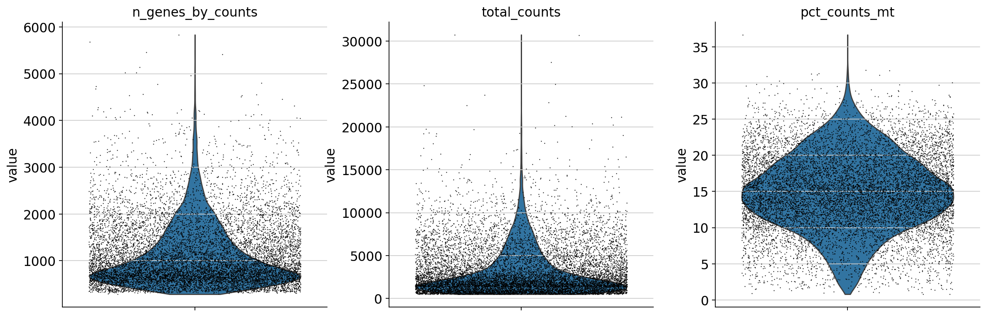

In [229]:
# Crea gráficos de violín para observar la distribución de métricas como el número de genes, el conteo total, 
# y el porcentaje de genes mitocondriales (indicador de calidad de la célula)
sc.pl.violin(adata7, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

---------
3. **Identificación y evalucación de células atípicas con expresión génica inusualmente alta o baja, así como otras características extremas**: Estas células atípicas pueden ser resultado de problemas técnicos o representar tipos de células poco comunes.

-> Uso de métodos estadísticos para determinar su inclusión o eliminación en el análisis.

a) **np.quantile**: Calcula el cuartil q-ésimo de los datos a lo largo del eje especificado.

`np.quantile(adata.obs.n_genes_by_counts.values, .98)`

In [230]:
# Calcula el límite superior del número de genes por célula (percentil 98)
upper_lim_genes = np.quantile(adata7.obs.n_genes_by_counts.values, .98)
# Muestra el valor calculado del límite superior de genes por célula
upper_lim_genes

3046.08

In [231]:
# Filtra las células que tienen un número de genes por debajo del límite superior calculado
adata7 = adata7[adata7.obs.n_genes_by_counts < upper_lim_genes]

In [232]:
# Calcula el límite superior de los conteos totales por célula (percentil 98)
upper_lim_counts = np.quantile(adata7.obs.total_counts.values, .98)
# Muestra el valor calculado del límite superior de conteos totales por célula
upper_lim_counts

9565.799999999997

In [233]:
# Filtra las células que tienen un total de conteos menor a  10,000
adata7 = adata7[adata7.obs.total_counts < 10000]

In [234]:
# Filtra las células que tienen menos del 20% de genes mitocondriales
adata7 = adata7[adata7.obs.pct_counts_mt < 20]

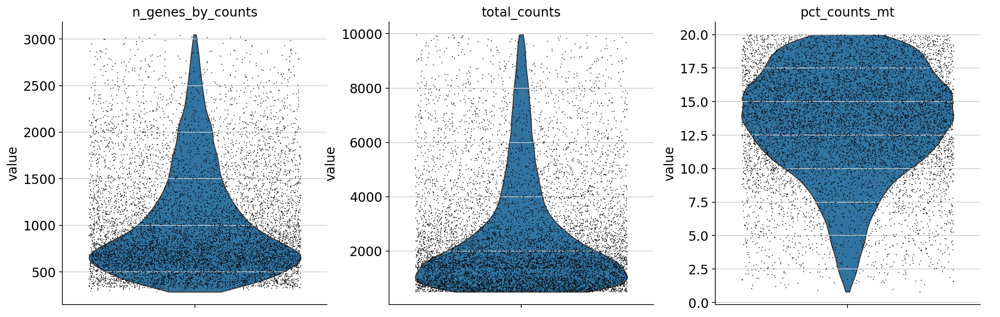

In [235]:
# Crea gráficos de violín nuevamente después del filtrado para comparar las métricas
sc.pl.violin(adata7, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], 
             jitter=0.4, multi_panel=True)

In [236]:
# Muestra información actualizada del objeto 'adata' después del filtrado
adata7

View of AnnData object with n_obs × n_vars = 8976 × 20519
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

-------
## 2. Normalización

La normalización nos permite ajustar la variabilidad de los datos que surge de las diferencias en la profundidad de secuenciación, el tamaño de las células así como otros factores técnicos. 

-> Aquí se garantiza que las diferencias observadas entre las células se deban a la variación biológica y no a problemas técnicos.

La normalización de recuento total implica escalar los recuentos brutos de cada célula por los recuentos totales de esa célula, seguido de una transformación logarítmica para estabilizar los datos. El logaritmo desplazado resulta beneficioso para estabilizar la varianza para la posterior reducción de la dimensionalidad y la identificación de genes expresados de forma diferencial.

In [237]:
# Suma los valores de la matriz de expresión a lo largo de las células (para cada célula)
adata7.X.sum(axis = 1)

matrix([[1863.],
        [ 789.],
        [6578.],
        ...,
        [1469.],
        [4234.],
        [1608.]], dtype=float32)

-------
1. **Escalado por recuentos totales** :Aquí se ajustan los recuentos de cada célula para considerar las diferencias en la profundidad de secuenciación o en el continido total de ARN. Comunmente se escalan los recuentos por un factor constante, normalmente 10 000 ("recuentos por diez mil" o CPTT). 

-> Crea una línea de base común para todas las células.

a) **sc.pp.normalize_total**: Normaliza los recuentos por celda.

`sc.pp.normalize_total(adata`[Matriz de datos anotada como n_obs x n_vars donde las filas corresponden a las células y las columnas corresponden a los genes], `target_sum`[cada observación (celda) tiene un recuento total igual a la mediana de los recuentos totales de las observaciones (celdas) antes de la normalización]`=1e4)`

In [238]:
# Normaliza los datos de expresión para que el total por célula sea igual a 10,000
sc.pp.normalize_total(adata7, target_sum=1e4) # normaliza cada celda a 10.000 UMI

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [239]:
# Verifica nuevamente la suma de la matriz de expresión para cada célula después de la normalización
adata7.X.sum(axis = 1)

matrix([[10000.017 ],
        [ 9999.996 ],
        [ 9999.9375],
        ...,
        [ 9999.935 ],
        [10000.102 ],
        [ 9999.953 ]], dtype=float32)

--------
2. **Transformación logarítmica**

Scanpy aplica una transformación logarítmica a los recuentos escalados, la cual nos ayuda a estabilizar la varianza para que los datos sean menos sensibles a los valores extremos y de este modo pueda facilitar el análisis posterior.

In [240]:
# Aplica la transformación logarítmica a los datos (logaritmo natural)
sc.pp.log1p(adata7)

In [241]:
# Verifica la suma de la matriz de expresión después de la transformación logarítmica
adata7.X.sum(axis = 1)

matrix([[1724.0658],
        [1482.1775],
        [2745.0596],
        ...,
        [1868.8821],
        [3214.453 ],
        [2140.6802]], dtype=float32)

In [242]:
# Almacena una copia de los datos sin procesar en 'adata.raw' para futuras referencias
adata7.raw = adata7

## 3. Clustering

**Objetivo**: explorar la diversidad celular e identificar tipos o estados celulares únicos. 

Este agrupamiento nos permite categorizar las células en función de sus perfiles de expresión genética y nos da información sobre la composición de una muestra.

Los datos de células individuales suelen tener miles de genes, lo que los hace altamente dimensionales. Antes del agrupamiento, se usan técnicas de reducción de dimensionalidad PCA (Análisis de componentes principales) y UMAP (Aproximación y proyección de colector uniforme) para reducir los datos a un espacio de menor dimensión. En este caso, se utiliza un agrupamiento basado en gráficos, el cual organiza las células en grupos en función de su conectividad en una estructura gráfica. 

**Algoritmo de Leiden**: es un método de agrupamiento basado en gráficos conocido por su eficiencia, precisión y solidez. Se usa ampliamente en el análisis de células individuales debido a su capacidad para encontrar grupos bien definidos en conjuntos de datos complejos.

-------
a) **sc.pp.highly_variable_genes**: Anota genes que son altamente variables.

`sc.pp.highly_variable_genes(adata`[Matriz de datos anotada por n_obs x n_var, donde las filas corresponden al número de células y las columnas correspondel al número de genes], `n_top_genes`[Número de genes altamente variables que se deben conservar] `= 2000)`

In [243]:
# Identificación de genes altamente variables
sc.pp.highly_variable_genes(adata7, n_top_genes = 2000)

In [244]:
# Muestra la información sobre los genes, incluyendo cuáles son altamente variables
adata7.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,False,54,0.004823,99.517728,54.0,54,False,0.016873,1.785054,-0.466173
AL669831.5,ENSG00000237491,Gene Expression,False,156,0.014200,98.606770,159.0,156,False,0.048906,1.920700,-0.115392
LINC00115,ENSG00000225880,Gene Expression,False,13,0.001161,99.883897,13.0,13,True,0.006606,2.348109,0.989889
FAM41C,ENSG00000230368,Gene Expression,False,3,0.000268,99.973207,3.0,3,False,0.001045,1.177390,-2.037596
AL645608.1,ENSG00000223764,Gene Expression,False,11,0.000982,99.901759,11.0,11,False,0.006613,1.992160,0.069404
...,...,...,...,...,...,...,...,...,...,...,...,...
AL592183.1,ENSG00000273748,Gene Expression,False,185,0.016790,98.347772,188.0,185,False,0.061983,1.936013,-0.075791
AC007325.4,ENSG00000278817,Gene Expression,False,416,0.039118,96.284719,438.0,416,False,0.107520,1.897694,-0.174887
AC007325.2,ENSG00000277196,Gene Expression,False,10,0.000893,99.910690,10.0,10,False,0.001269,0.775083,-3.077961
AL354822.1,ENSG00000278384,Gene Expression,False,19,0.001697,99.830312,19.0,19,False,0.009933,2.217996,0.653416


-------
b) **#sc.pl.highly_variable_genes(adata)**: Grafica dispersiones o varianza normalizada vs medias para los genes.

`sc.pl.highly_variable_genes(adata`[Muestra el resultado de "highly_variable_genes"])

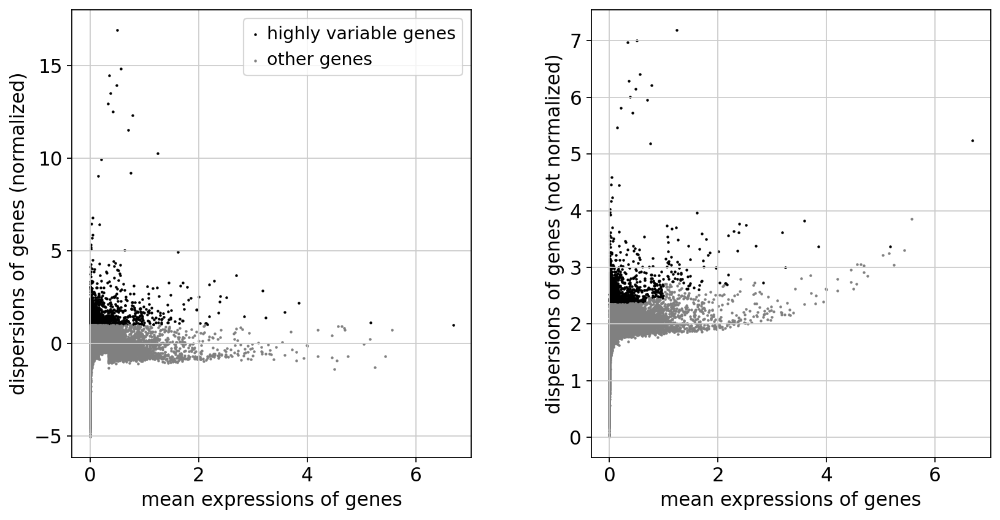

In [245]:
# Crea un gráfico de los genes altamente variables
sc.pl.highly_variable_genes(adata7)

In [246]:
# Mantiene solo los genes altamente variables en los datos para los siguientes análisis
adata7 = adata7[:, adata7.var.highly_variable]

-------
c) **sc.pp.regress_out**: Eliminar (en su mayoría) las fuentes de variación no deseadas mediante regresión lineal simple.

`sc.pp.regress_out(adata`[La matriz de datos anotada], ['total_counts', 'pct_counts_mt'])

- “total_counts”: Suma de recuentos de un gen.
- “pct_counts_mt”: Proporción del recuento total de mitocondrias de una sola célula.

In [247]:
# Reajusta los efectos de covariables como el número total de conteos y el porcentaje de genes mitocondriales
sc.pp.regress_out(adata7, ['total_counts', 'pct_counts_mt'])

/home/mcgonzalez/miniconda3/envs/SS/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


------
d) **sc.pp.scale**: Escala datos a varianza unitaria y media cero.

`sc.pp.scale(adata`[Matriz de datos (anotada) de forma n_obs× n_vars. Las filas corresponden a las células y las columnas a los genes], `max_value`[Recortar (truncar) a este valor después de escalar]`=10)`

In [248]:
# Escala los datos para que cada gen tenga media 0 y varianza 1, con un valor máximo de 10
sc.pp.scale(adata7, max_value=10)

------
e) **sc.tl.pca**: Análisis de Componentes Principales (PCA) que calcula coordenadas de PCA, cargas y descomposición de varianza.

`sc.tl.pca(adata`[Matriz de datos (anotada) de forma n_obs× n_vars donde las filas corresponden a las células y las columnas a los genes], `svd_solver`[Solucionador SVD a utilizar]`='arpack')`

In [249]:
# Realiza análisis de componentes principales (PCA) para reducir la dimensionalidad de los datos
sc.tl.pca(adata7, svd_solver='arpack')

-------
f) **sc.pl.pca_variance_ratio**: Grafica la razón de varianza.

`sc.pl.pca_variance_ratio(adata`[Matriz de datos anotada], `log`[Trazar en escala logarítmica]`=True, n_pcs`[Número de PC a mostrar, por defecto es igual a 30 pero varía] `= 50)`

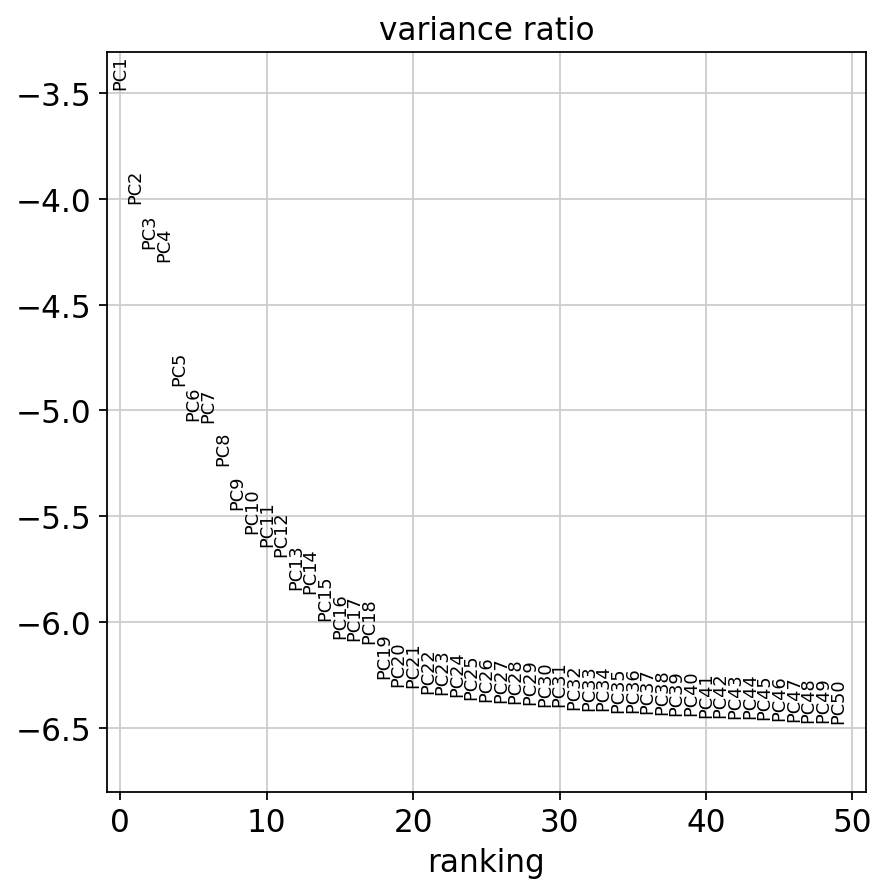

In [250]:
# Muestra un gráfico de la varianza explicada por los componentes principales (logaritmo)
sc.pl.pca_variance_ratio(adata7, log=True, n_pcs = 50)

-------
g) **sc.pp.neighbors**: Calcula la matriz de distancia de los vecinos más cercanos y un gráfico de vecindad de observaciones.\
La eficiencia de búsqueda de vecinos de esto depende en gran medida de UMAP (Aproximación y proyección de colector uniforme) que también proporciona un método para estimar las conectividades de los puntos de datos: la conectividad de la variedad.

`sc.pp.neighbors(adata`[Matriz de datos anotada], `n_pcs`[Utiliza la cantidad de PC] `= 30)`

In [251]:
# Calcula la matriz de vecinos más cercanos para las células usando los primeros 30 componentes principales
sc.pp.neighbors(adata7, n_pcs = 30)

---------
h) **sc.tl.umap**: Incrustra el gráfico de vecindad usando UMAP (Aproximación y proyección de colector uniforme) para visualizar datos de alta dimensión. Optimiza la incrustación de modo que refleje mejor la topología de los datos.

`sc.tl.umap(adata`[Matriz de datos anotada])

i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada])

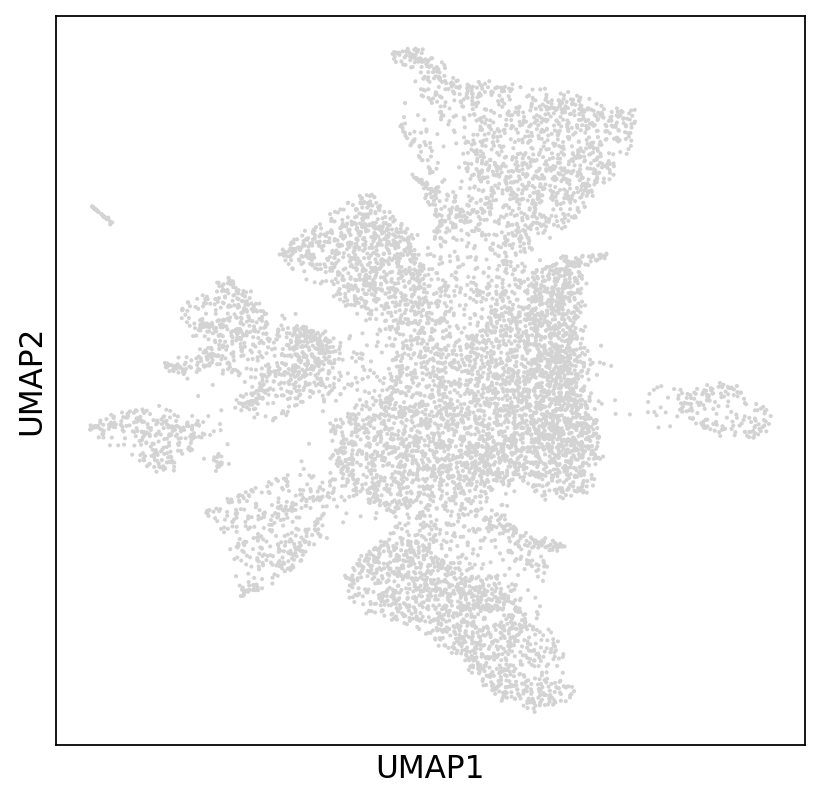

In [252]:
# Realiza una proyección de UMAP (técnica de reducción de dimensionalidad)
sc.tl.umap(adata7) # UMAP: visualizar datos de alta dimensión
# Crea un gráfico de UMAP para visualizar las células en el espacio reducido
sc.pl.umap(adata7)

--------
3. **Leiden**

Leiden comienza construyendo un "gráfico de vecinos", donde cada nodo representa una célula y los bordes representan conexiones entre células en función de su similitud (que a menudo se mide utilizando los k vecinos más cercanos u otras métricas de distancia). Luego, el algoritmo aplica un proceso llamado "detección de comunidad" para identificar grupos de células estrechamente relacionadas dentro del gráfico.

**Pasos clave**:

- **Particionado de nodos**: Leiden asigna células (nodos) a los grupos iniciales, lo que crea una partición del gráfico.
- **Refinamiento de nodos**: el algoritmo refina la partición evaluando la modularidad (una medida de la solidez de los clústeres) y moviendo los nodos para mejorar la modularidad.
- **Optimización de clústeres**: Leiden continúa refinando los clústeres hasta que no se puedan realizar más mejoras.
  
**Resultado final**: conjunto de clústeres que representan grupos distintos de células, que se pueden utilizar para análisis posteriores como visualización, expresión diferencial o anotación de tipo de célula.

-----
a) **sc.tl.leiden**: Agrupa células en subgrupos.

`sc.tl.leiden(adata`[La matriz de datos anotada], `resolution`[Un valor de parámetro que controla la tosquedad de la agrupación donde los valores más altos generan más agrupaciones] `= 1)`

In [253]:
# Realiza un clustering de las células utilizando el algoritmo Leiden con una resolución de 1
sc.tl.leiden(adata7, resolution = 1) # Por defecto la resolución es 1

In [254]:
# Muestra las observaciones (células) con las etiquetas del clustering Leiden
adata7.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGCACGGAT-1,818,1863.0,232.0,12.453033,6
AAACCCACATTCACCC-1,533,790.0,72.0,9.113924,6
AAACCCAGTACGGTTT-1,2180,6579.0,544.0,8.268734,3
AAACCCAGTATCGAGG-1,846,2507.0,419.0,16.713203,0
AAACCCAGTATGAGCG-1,1026,1803.0,194.0,10.759845,4
...,...,...,...,...,...
TTTGTTGCATCGCTGG-1,444,632.0,66.0,10.443038,9
TTTGTTGGTACAGAAT-1,540,806.0,85.0,10.545906,6
TTTGTTGGTTCAGGTT-1,820,1469.0,204.0,13.886998,13
TTTGTTGTCGGCATTA-1,2138,4236.0,157.0,3.706327,11


------
i) **sc.pl.umap**: Diagrama de dispersión en base UMAP (Aproximación y proyección de colector uniforme).

`sc.pl.umap(adata`[Matriz de datos anotada], `color`[Claves para anotaciones de observaciones/células o variables/genes] `=['leiden'])`

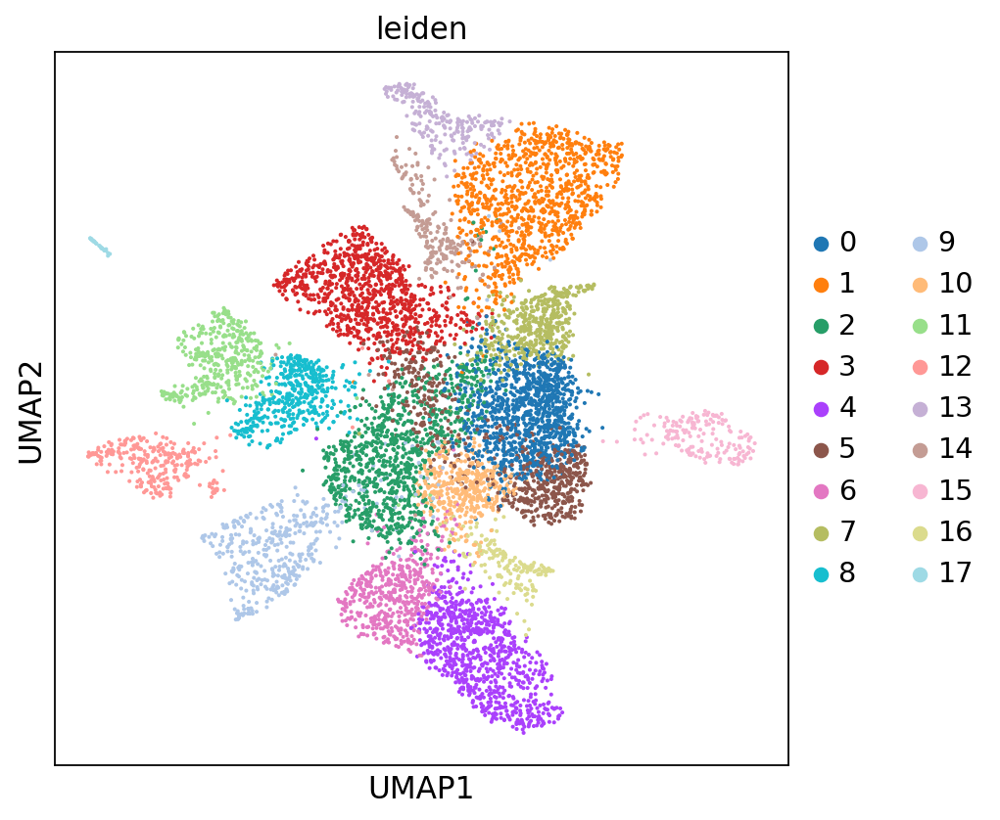

In [255]:
# Crea un gráfico UMAP coloreado por las etiquetas de los clusters Leiden
# Diagrama de dispersión en base UMAP.
sc.pl.umap(adata7, color=['leiden'])

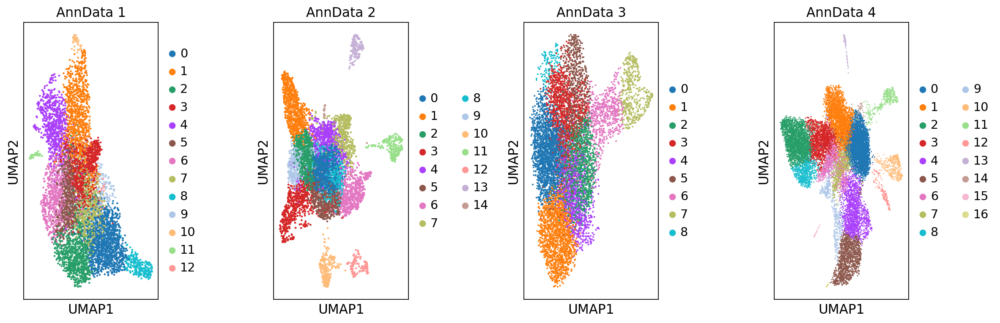

In [258]:
import scanpy as sc
import matplotlib.pyplot as plt

# Lista de tus objetos AnnData
adatas_1 = [adata1, adata2, adata3, adata4]

# Configura el tamaño de la figura
fig, axes = plt.subplots(1, len(adatas_1), figsize=(15, 5))

# Recorre cada objeto y plotea en un subplot
for i, (adata, ax) in enumerate(zip(adatas_1, axes)):
    sc.pl.umap(adata, color='leiden', ax=ax, show=False)
    ax.set_title(f'AnnData {i + 1}')  # Opcional, para etiquetar cada subplot

plt.tight_layout()
plt.show()

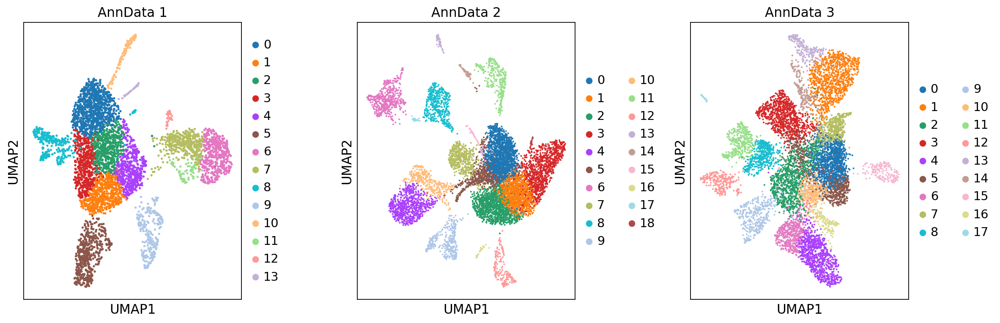

In [259]:
import scanpy as sc
import matplotlib.pyplot as plt

# Lista de tus objetos AnnData
adatas_2 = [adata5, adata6, adata7]

# Configura el tamaño de la figura
fig, axes = plt.subplots(1, len(adatas_2), figsize=(15, 5))

# Recorre cada objeto y plotea en un subplot
for i, (adata, ax) in enumerate(zip(adatas_2, axes)):
    sc.pl.umap(adata, color='leiden', ax=ax, show=False)
    ax.set_title(f'AnnData {i + 1}')  # Opcional, para etiquetar cada subplot

plt.tight_layout()
plt.show()

/tmp/ipykernel_2024655/1803721310.py:4: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_combined = adata1.concatenate(adata2, adata3, adata4, adata5, adata6, adata7, batch_key='dataset')


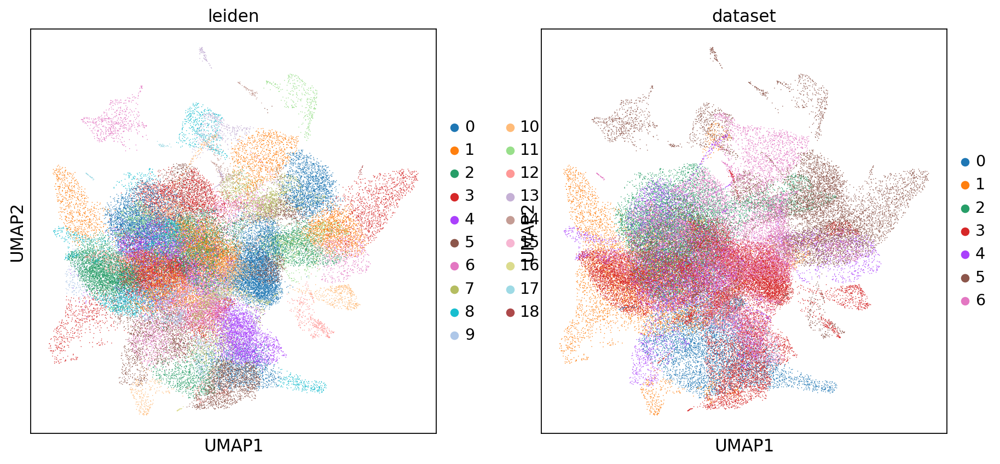

In [260]:
import scanpy as sc

# Concatenar los AnnData (asegúrate de que las claves no choquen)
adata_combined = adata1.concatenate(adata2, adata3, adata4, adata5, adata6, adata7, batch_key='dataset')

# Plotear UMAP del objeto combinado
sc.pl.umap(adata_combined, color=['leiden', 'dataset'])